## Importing the relevant libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings, joblib, gc, re, time
warnings.filterwarnings('ignore')
from scipy.stats import probplot
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor, BaggingRegressor, VotingRegressor, StackingRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, BayesianRidge, HuberRegressor, PassiveAggressiveRegressor, SGDRegressor, PoissonRegressor, RANSACRegressor, TheilSenRegressor, GammaRegressor, ARDRegression, TweedieRegressor
from sklearn.neighbors import KNeighborsRegressor, RadiusNeighborsRegressor
from sklearn.svm import SVR, LinearSVR, NuSVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor, XGBRFRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from ngboost import NGBRegressor
from sklearn.neural_network import MLPRegressor
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.preprocessing import StandardScaler, FunctionTransformer, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression, SelectPercentile, SelectFromModel, RFE, SequentialFeatureSelector
from mlxtend.plotting import plot_decision_regions
from feature_engine.outliers import Winsorizer
from sklearn.pipeline import Pipeline
from feature_engine.selection import DropConstantFeatures, DropDuplicateFeatures, DropCorrelatedFeatures 
from sklearn.impute import SimpleImputer
from yellowbrick.regressor import PredictionError, ResidualsPlot

## Loading the dataset

In [2]:
df = pd.read_excel('Superstore.xlsx')
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2013-152156,2013-11-09,2013-11-12,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2013-152156,2013-11-09,2013-11-12,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2013-138688,2013-06-13,2013-06-17,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2012-108966,2012-10-11,2012-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2012-108966,2012-10-11,2012-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


## Data Exploration

In [3]:
df.shape

(9994, 21)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Row ID         9994 non-null   int64         
 1   Order ID       9994 non-null   object        
 2   Order Date     9994 non-null   datetime64[ns]
 3   Ship Date      9994 non-null   datetime64[ns]
 4   Ship Mode      9994 non-null   object        
 5   Customer ID    9994 non-null   object        
 6   Customer Name  9994 non-null   object        
 7   Segment        9994 non-null   object        
 8   Country        9994 non-null   object        
 9   City           9994 non-null   object        
 10  State          9994 non-null   object        
 11  Postal Code    9994 non-null   int64         
 12  Region         9994 non-null   object        
 13  Product ID     9994 non-null   object        
 14  Category       9994 non-null   object        
 15  Sub-Category   9994 n

In [5]:
df.drop('Row ID', axis=1, inplace=True)

In [6]:
df.nunique() / len(df)

Order ID         0.501201
Order Date       0.123874
Ship Date        0.133480
Ship Mode        0.000400
Customer ID      0.079348
Customer Name    0.079348
Segment          0.000300
Country          0.000100
City             0.053132
State            0.004903
Postal Code      0.063138
Region           0.000400
Product ID       0.186312
Category         0.000300
Sub-Category     0.001701
Product Name     0.184211
Sales            0.614769
Quantity         0.001401
Discount         0.001201
Profit           0.754953
dtype: float64

In [7]:
df.isna().sum()

Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Customer Name    0
Segment          0
Country          0
City             0
State            0
Postal Code      0
Region           0
Product ID       0
Category         0
Sub-Category     0
Product Name     0
Sales            0
Quantity         0
Discount         0
Profit           0
dtype: int64

In [8]:
df.duplicated().sum()

1

In [9]:
df = df.drop_duplicates()
df.shape

(9993, 20)

In [10]:
df.drop(['Order ID','Customer ID','Customer Name','Product ID'],axis=1,inplace=True)

## Exploratory Data Analysis

### Univariate Analysis

Skewness of Postal Code: -0.12862858810335934
Kurtosis of Postal Code: -1.4931118549547797


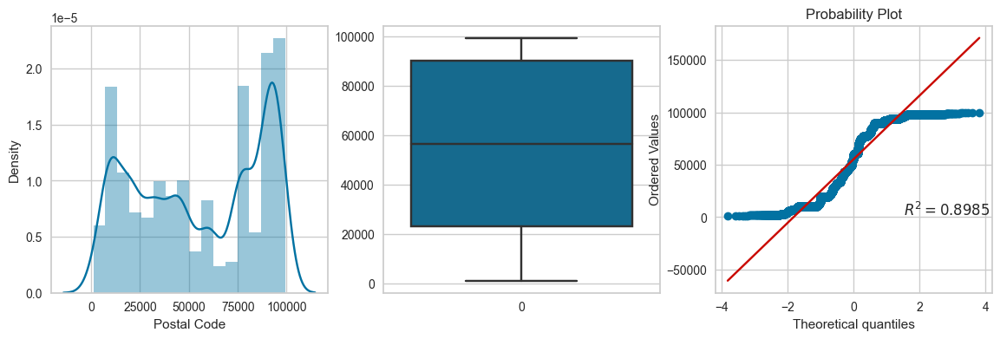

Skewness of Sales: 12.972141558363262
Kurtosis of Sales: 305.28176970634985


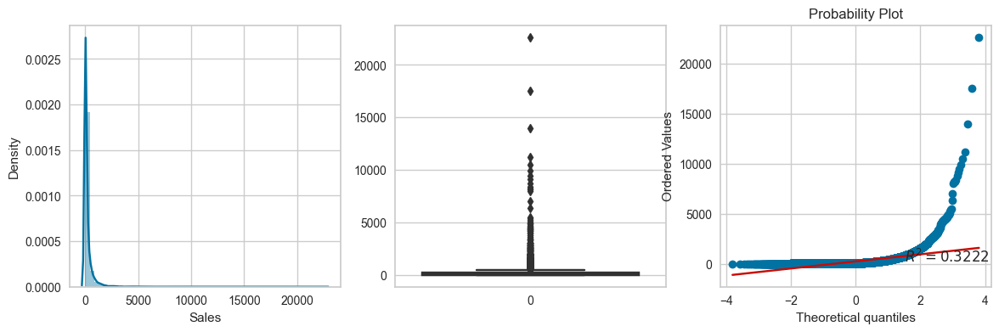

Skewness of Quantity: 1.2784155399852233
Kurtosis of Quantity: 1.9915827160047757


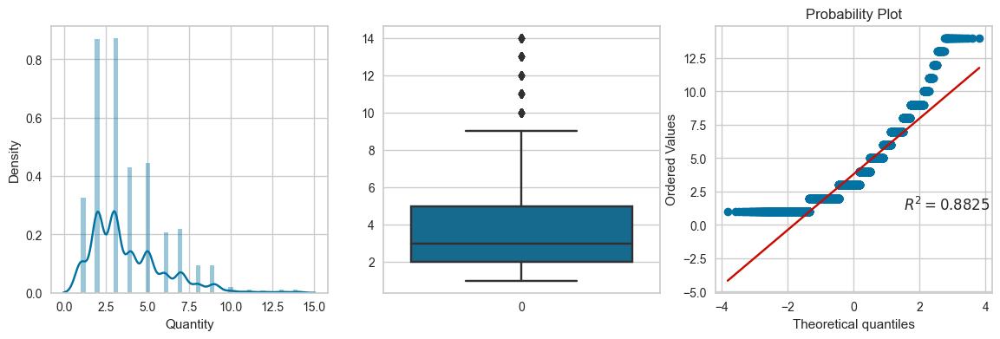

Skewness of Discount: 1.6845084876700462
Kurtosis of Discount: 2.409976524801519


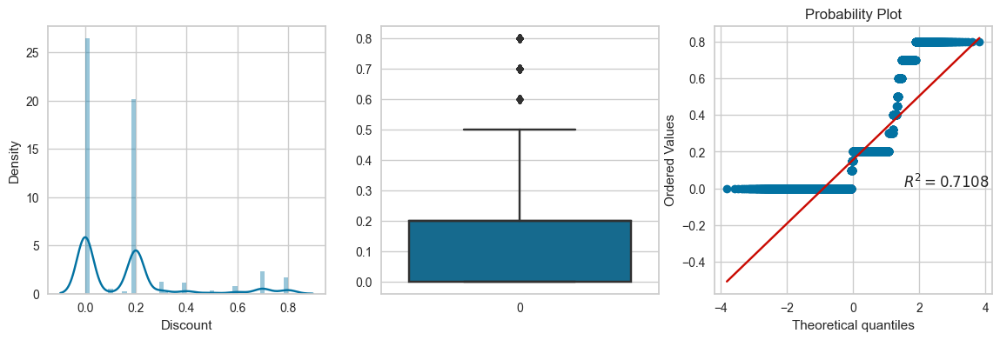

Skewness of Profit: 7.561035996041436
Kurtosis of Profit: 397.15038474389223


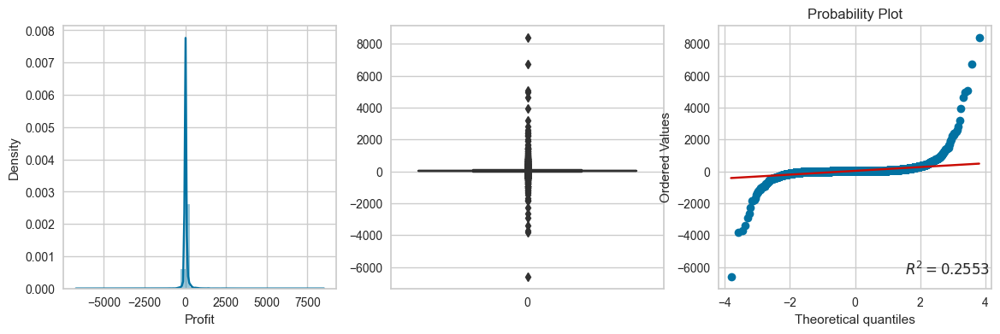

In [11]:
for col in df.select_dtypes(np.number).columns:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurt())
    plt.subplots(nrows=1,ncols=2,figsize=(14,4))
    plt.subplot(1,3,1)
    sns.distplot(df[col])
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    probplot(df[col],plot=plt,dist='norm',rvalue=True)
    plt.show()

In [12]:
skewed_cols = ['Quantity','Discount','Profit']

In [13]:
df['Country'].value_counts()

United States    9993
Name: Country, dtype: int64

In [14]:
df.drop('Country', axis=1, inplace=True)

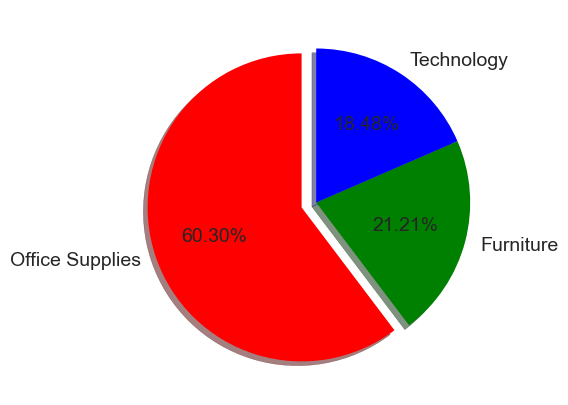

In [15]:
plt.figure(figsize=(10,5))
labels = df['Category'].value_counts().keys()
values = df['Category'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0,0],startangle=90,textprops={'fontsize': 14},colors=['red','green','blue'])
plt.show()

Majority of the products are in Office Supplies category whereas the least number of products are in Technology category.

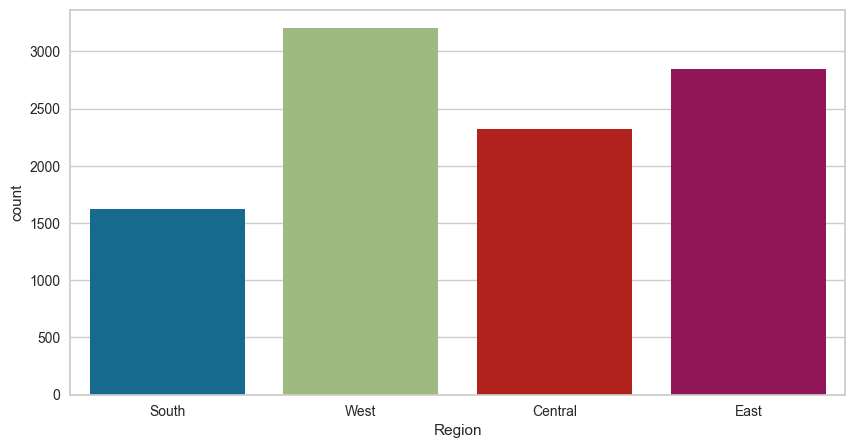

In [16]:
plt.figure(figsize=(10,5))
sns.countplot(x='Region',data=df)
plt.show()

A significant number of customers belong to the Western region while the Southern region has the least number of customers.

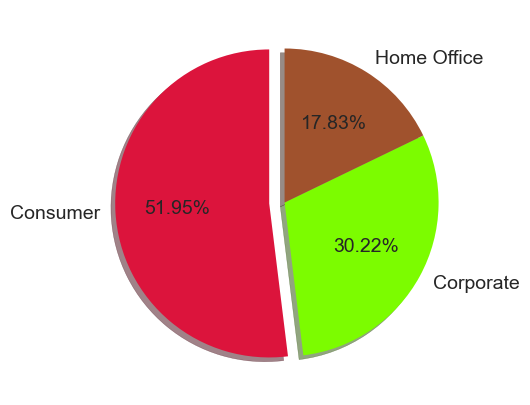

In [17]:
plt.figure(figsize=(10,5))
labels = df['Segment'].value_counts().keys()
values = df['Segment'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0,0],startangle=90,textprops={'fontsize': 14},colors=['crimson','lawngreen','sienna'])
plt.show()

More than half of the entire population belongs to the Consumer segment.

In [18]:
df['Ship Mode'].value_counts()

Standard Class    5967
Second Class      1945
First Class       1538
Same Day           543
Name: Ship Mode, dtype: int64

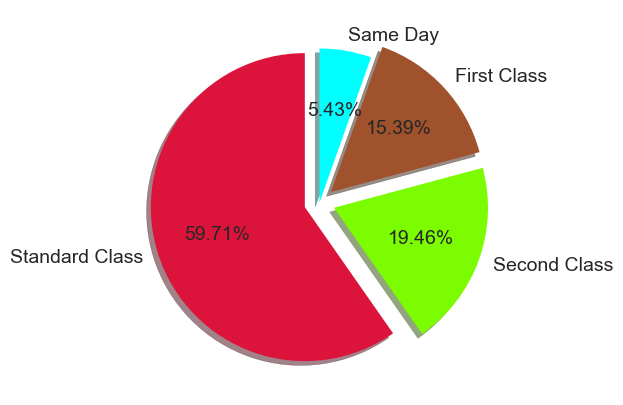

In [19]:
plt.figure(figsize=(10,5))
labels = df['Ship Mode'].value_counts().keys()
values = df['Ship Mode'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0.1,0.1,0],startangle=90,textprops={'fontsize': 14},colors=['crimson','lawngreen','sienna','cyan'])
plt.show()

A significant number of orders were delivered via the Standard shipping mode whereas First Class and Second Class shipping modes were less frequently used.

### Bivariate Analysis

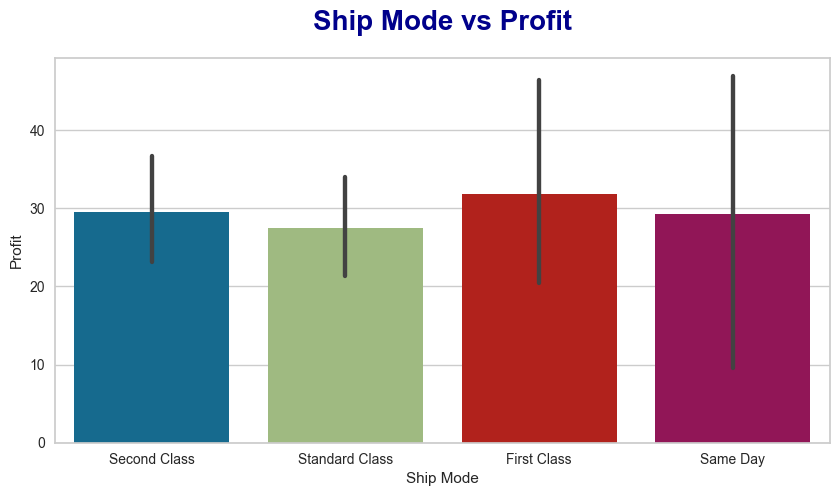

In [20]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Profit',data=df)
plt.title('Ship Mode vs Profit',pad=20,fontsize=20,color='darkblue',fontweight='bold')
plt.show()

The First Class was the most profitable shipping mode while the Standard shipping mode was the least profitable.

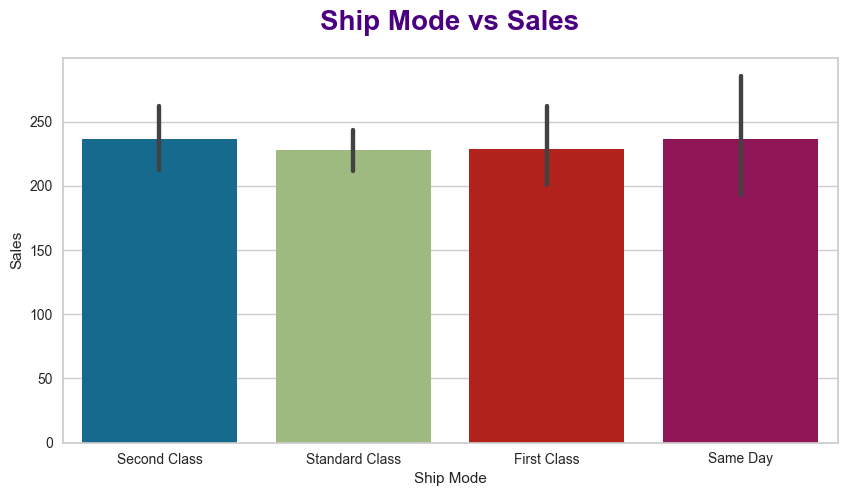

In [21]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Sales',data=df)
plt.title('Ship Mode vs Sales',pad=20,fontsize=20,fontweight='bold',color='indigo')
plt.show()

The shipping modes that generated the highest sales are Second Class and Same Day whereas Standard Class and First Class generated the least sales.

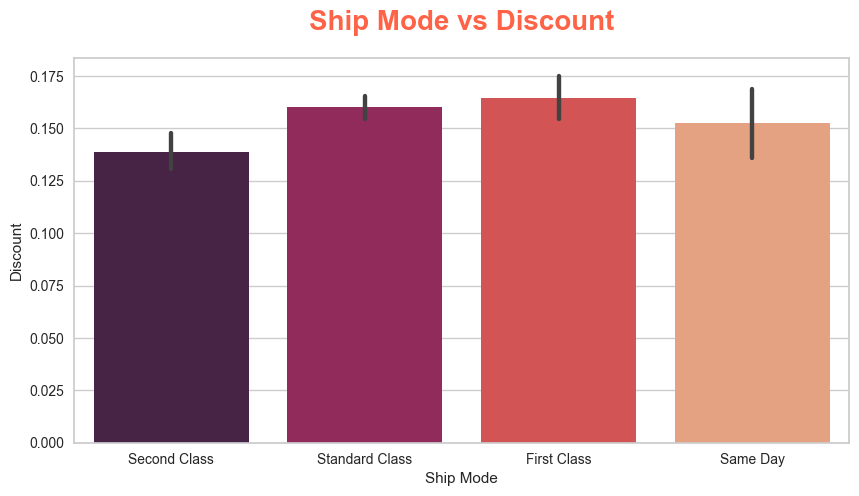

In [22]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Discount',data=df,palette='rocket')
plt.title('Ship Mode vs Discount',pad=20,fontsize=20,fontweight='bold',color='tomato')
plt.show()

The maximum discount was offered on products that were delivered via the First Class shipping mode whereas the minimum discount was given on products that were shipped via the Second Class.

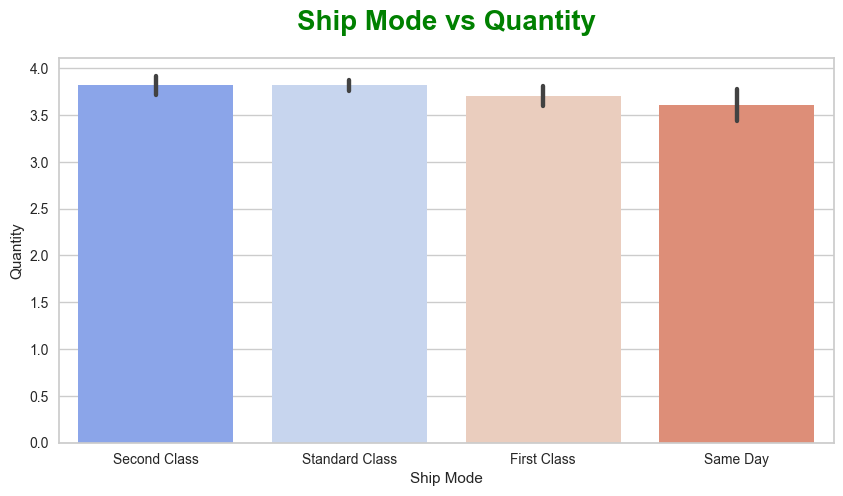

In [23]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Quantity',data=df,palette='coolwarm')
plt.title('Ship Mode vs Quantity',pad=20,fontsize=20,fontweight='bold',color='green')
plt.show()

The highest quantities of products were shipped via the Second Class and Standard Class shipping modes whereas the least quantities were shipped through the Same Day shipping mode.

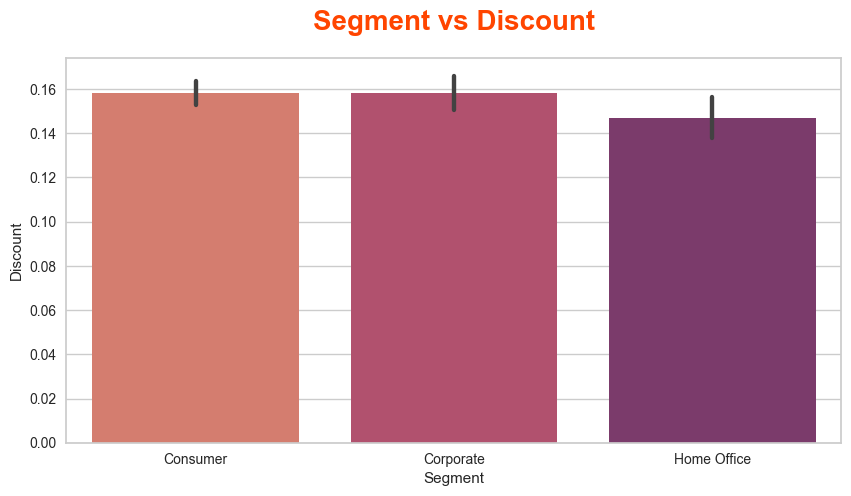

In [24]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Discount',data=df,palette='flare')
plt.title('Segment vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

The highest discount was given on the orders made by Consumer and Corporate segments whereas those made by Home Office provided the least discount.

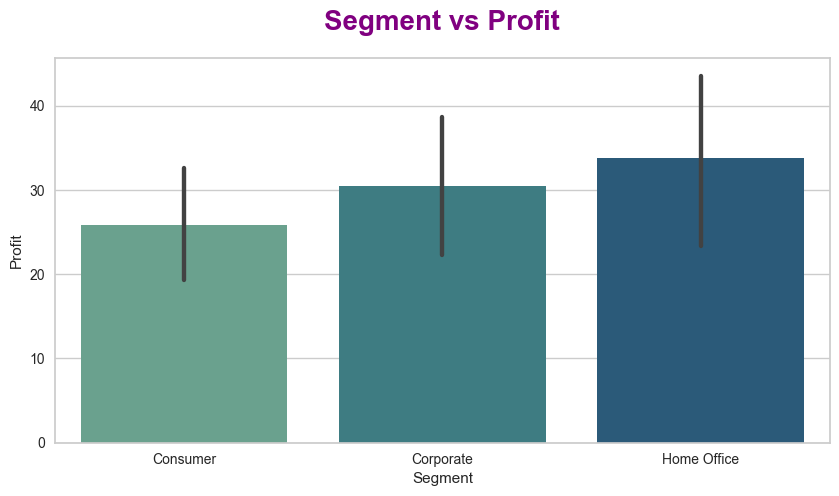

In [25]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Profit',data=df,palette='crest')
plt.title('Segment vs Profit',pad=20,fontsize=20,fontweight='bold',color='purple')
plt.show()

The orders made by Home Office segment generated the highest profit whereas those made by Consumer and Corporate segments generated the least profit.

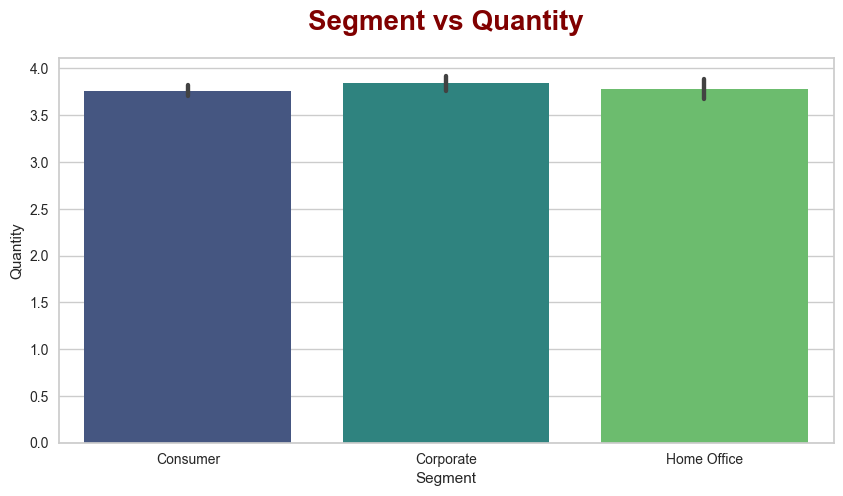

In [26]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Quantity',data=df,palette='viridis')
plt.title('Segment vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

The highest quantities of products were purchased by the Corporate segment whereas the lowest quantities were purchased by the Consumer segment.

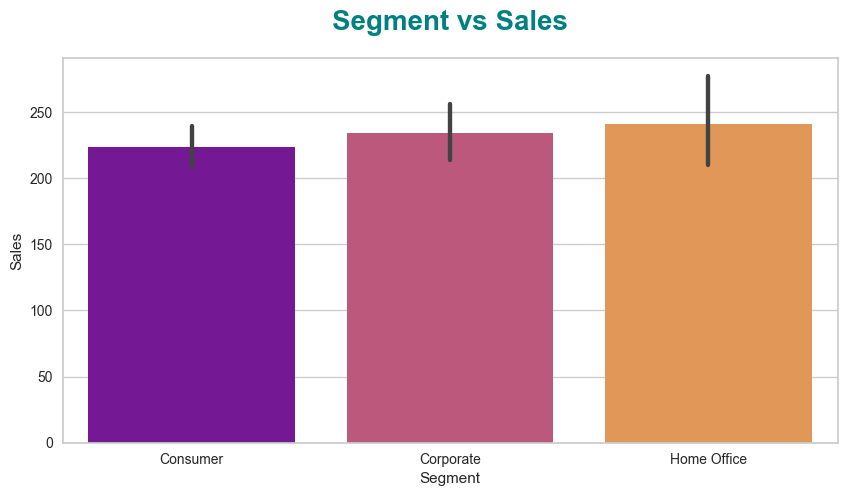

In [27]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Sales',data=df,palette='plasma')
plt.title('Segment vs Sales',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The orders made by the Home Office segment generated the maximum sales whereas those made by the Consumer segment generated the minimum sales.

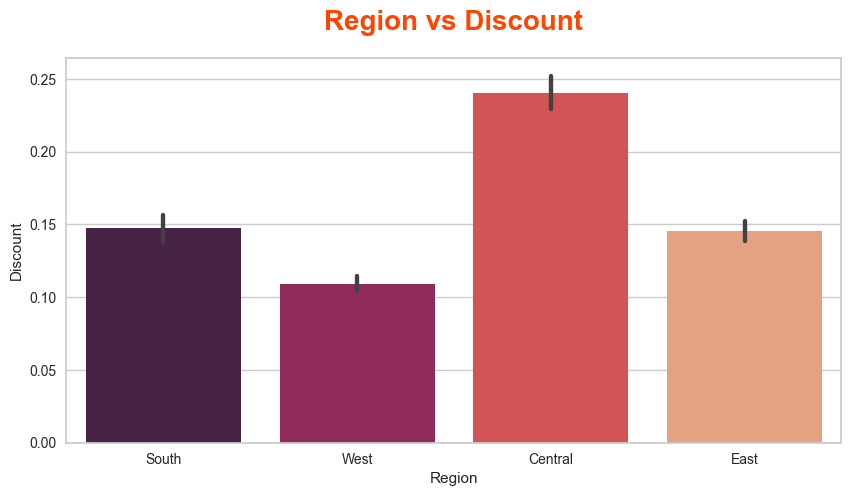

In [28]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Discount',data=df,palette='rocket')
plt.title('Region vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

A substantial discount was offered on the orders made in the Central region whereas the least discount was given on those made in the Western region.

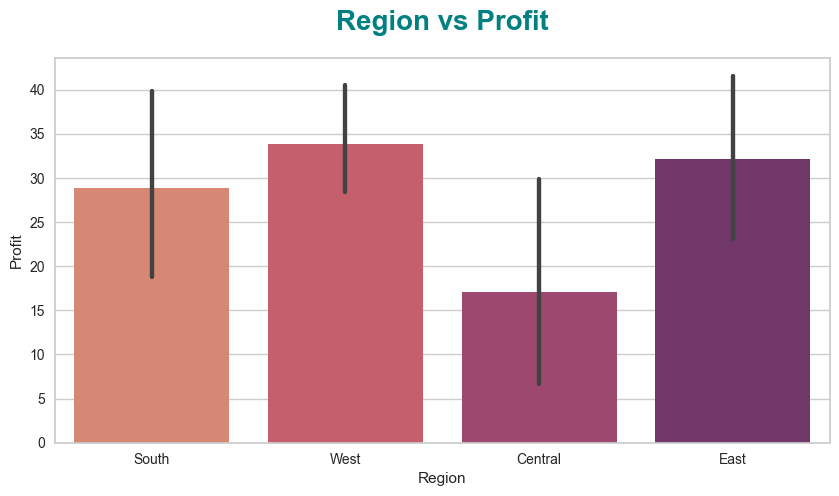

In [29]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Profit',data=df,palette='flare')
plt.title('Region vs Profit',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The largest profit was recorded in the Western region while the lowest profit was obtained in the Central region.

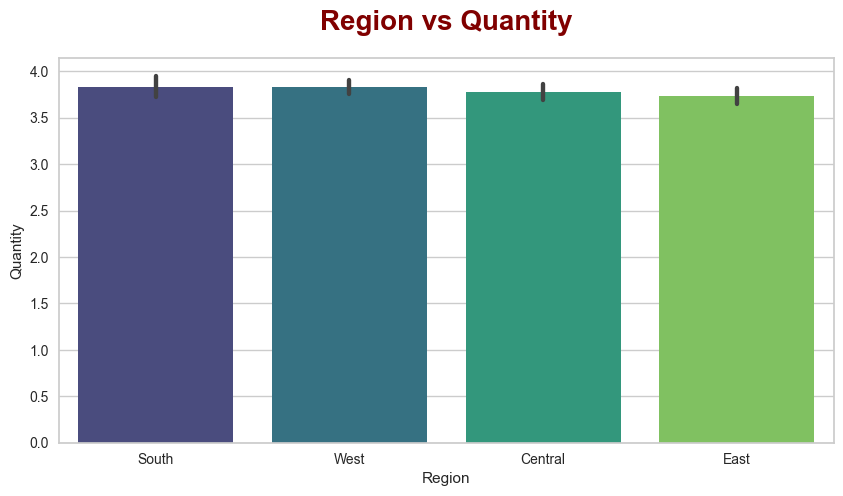

In [30]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Quantity',data=df,palette='viridis')
plt.title('Region vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

The highest quantities of products were purchased in the Southern and Western regions whereas the lowest quantities were ordered in the Eastern region. However, there is overall a minimal difference in the quantities of products ordered across all regions.

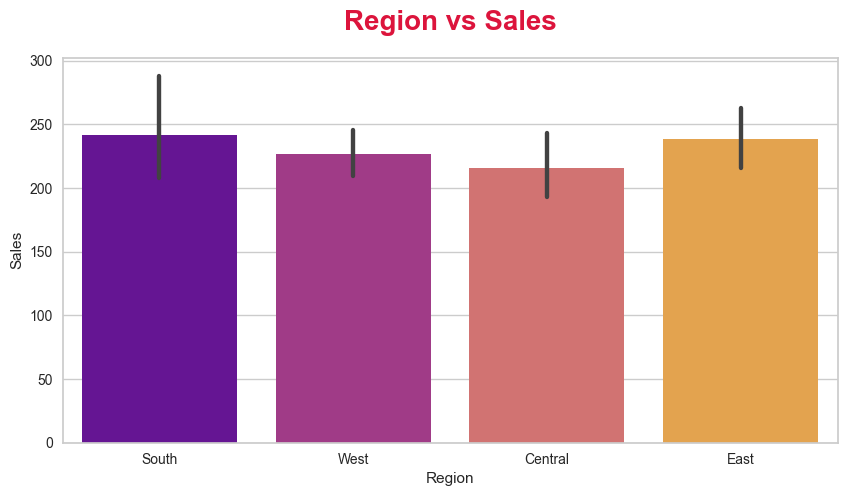

In [31]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Sales',data=df,palette='plasma')
plt.title('Region vs Sales',pad=20,fontsize=20,fontweight='bold',color='crimson')
plt.show()

The highest sales were recorded in the South and East regions while the lowest sales were observed in the Central region.

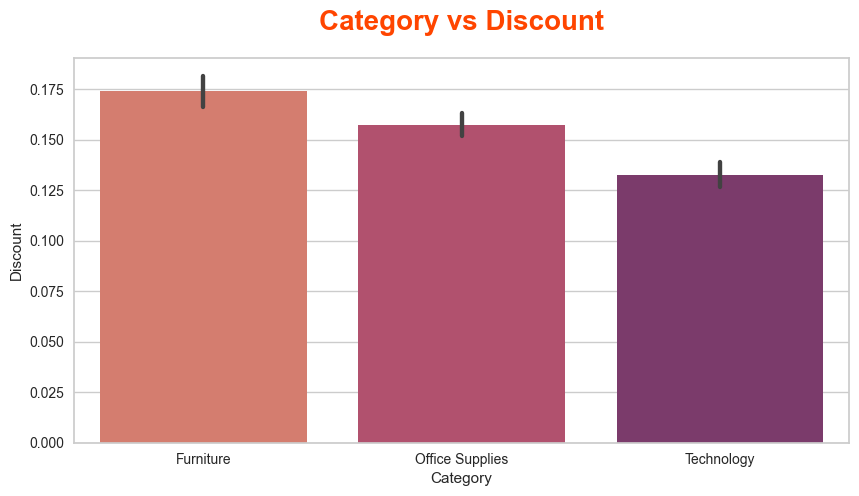

In [32]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Discount',data=df,palette='flare')
plt.title('Category vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

A significant discount was provided on furniture products whereas the least discount was given on technology products.

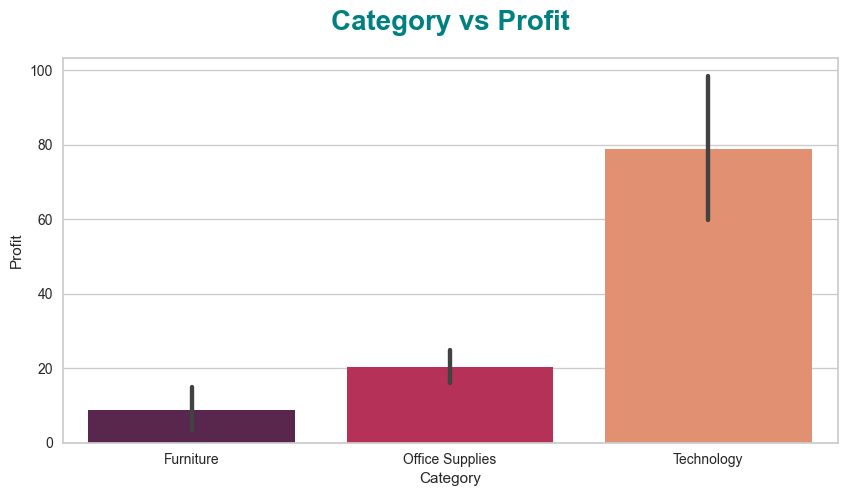

In [33]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Profit',data=df,palette='rocket')
plt.title('Category vs Profit',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The products belonging to the Technology category are the most profitable while the products belonging to the Furniture category are the least profitable.

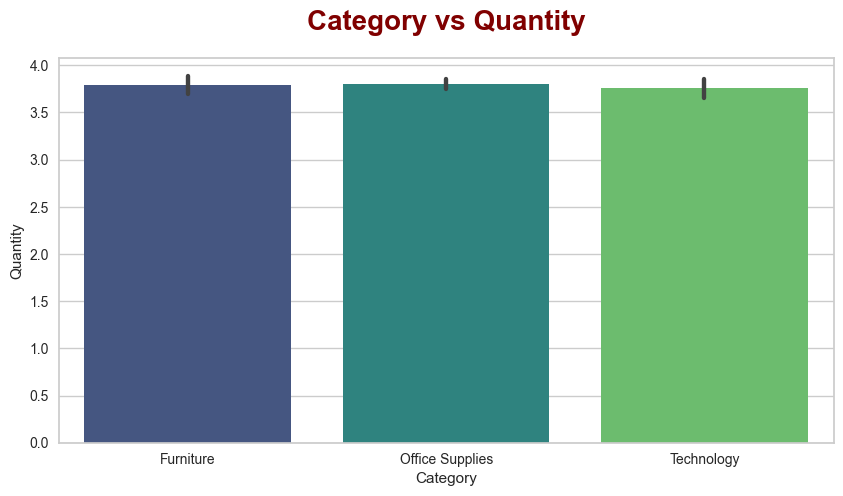

In [34]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Quantity',data=df,palette='viridis')
plt.title('Category vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

All categories have almost similar quantities of products ordered.

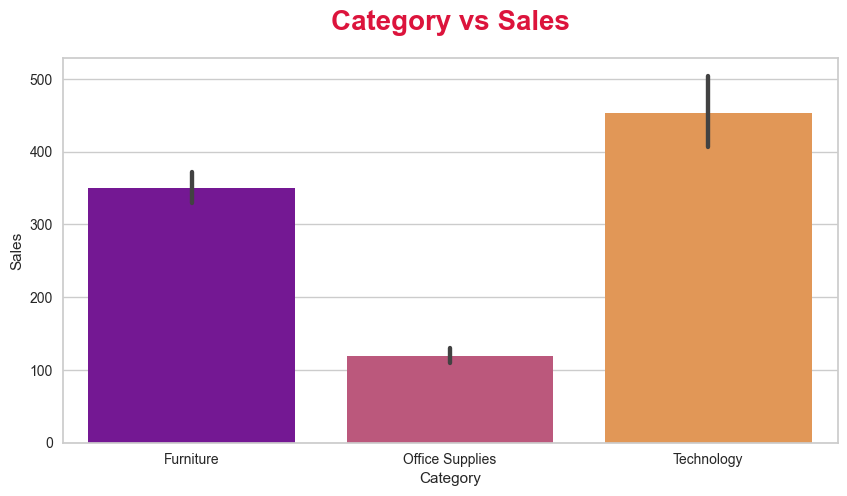

In [35]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Sales',data=df,palette='plasma')
plt.title('Category vs Sales',pad=20,fontsize=20,fontweight='bold',color='crimson')
plt.show()

The maximum sales were recorded in the Technology category while the lowest sales were obtained in the Office Supplies category.

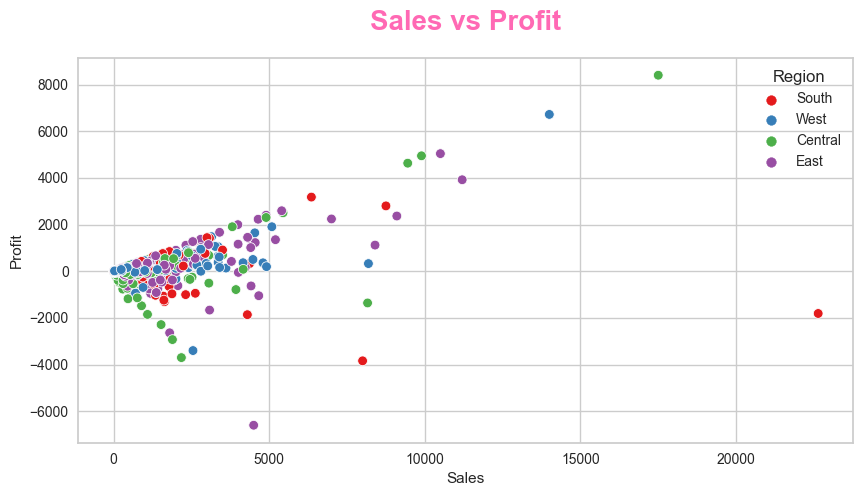

68914

In [36]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Region',palette='Set1')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='hotpink')
plt.show()
plt.close('all')
del fig
gc.collect()

The Western region recorded the lowest sales and profit among all regions whereas the Eastern region generated a considerable profit in general across all regions.

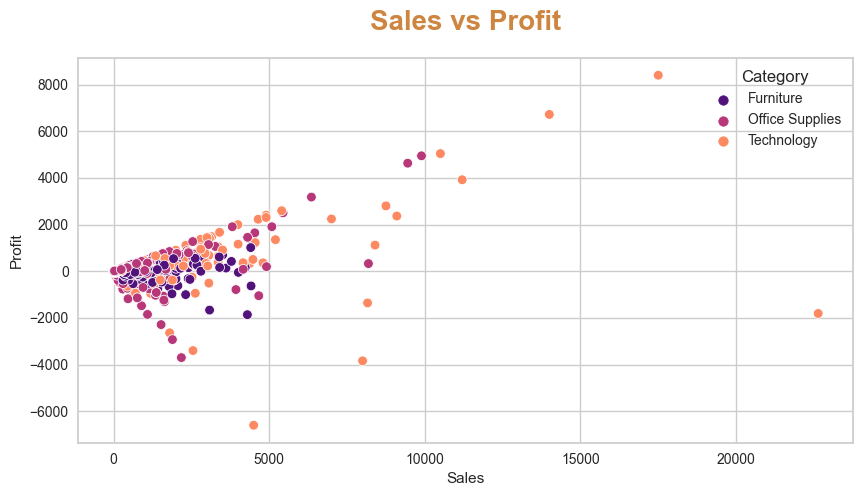

4385

In [37]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Category',palette='magma')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='peru')
plt.show()
plt.close('all')
del fig
gc.collect()

It is clearly evident from the above plot that the highest profit was obtained in the Technology category whereas the lowest profit was obtained in the Office Supplies category.

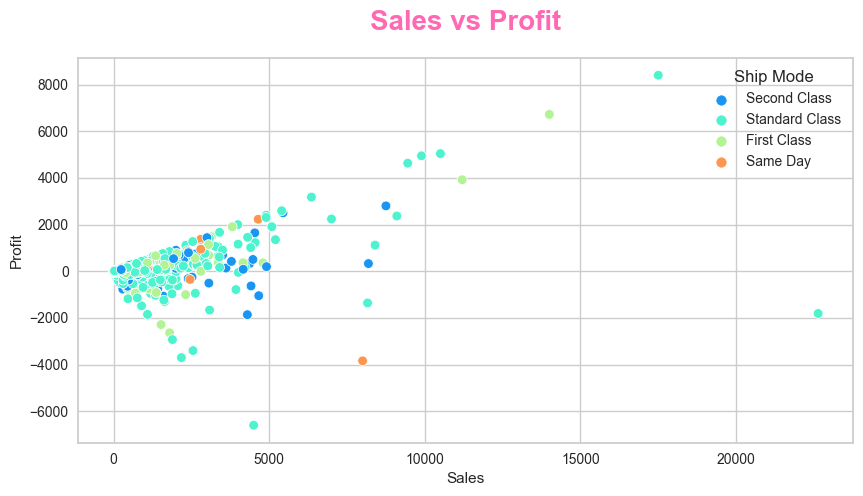

4189

In [38]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Ship Mode',palette='rainbow')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='hotpink')
plt.show()
plt.close('all')
del fig
gc.collect()

The highest sales and profit were recorded in the orders delivered via the Standard Class shipping mode while the Second Class shipping mode was the least profitable.

### Multivariate Analysis

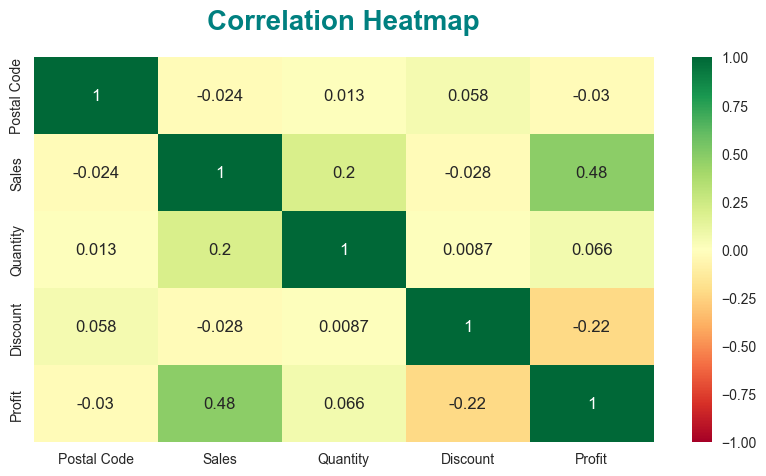

11336

In [39]:
plt.figure(figsize=(10,5))
fig = sns.heatmap(df.corr(),annot=True,cmap='RdYlGn',vmin=-1.0,vmax=1.0)
plt.title('Correlation Heatmap',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()
plt.close('all')
del fig
gc.collect()

<Figure size 1000x500 with 0 Axes>

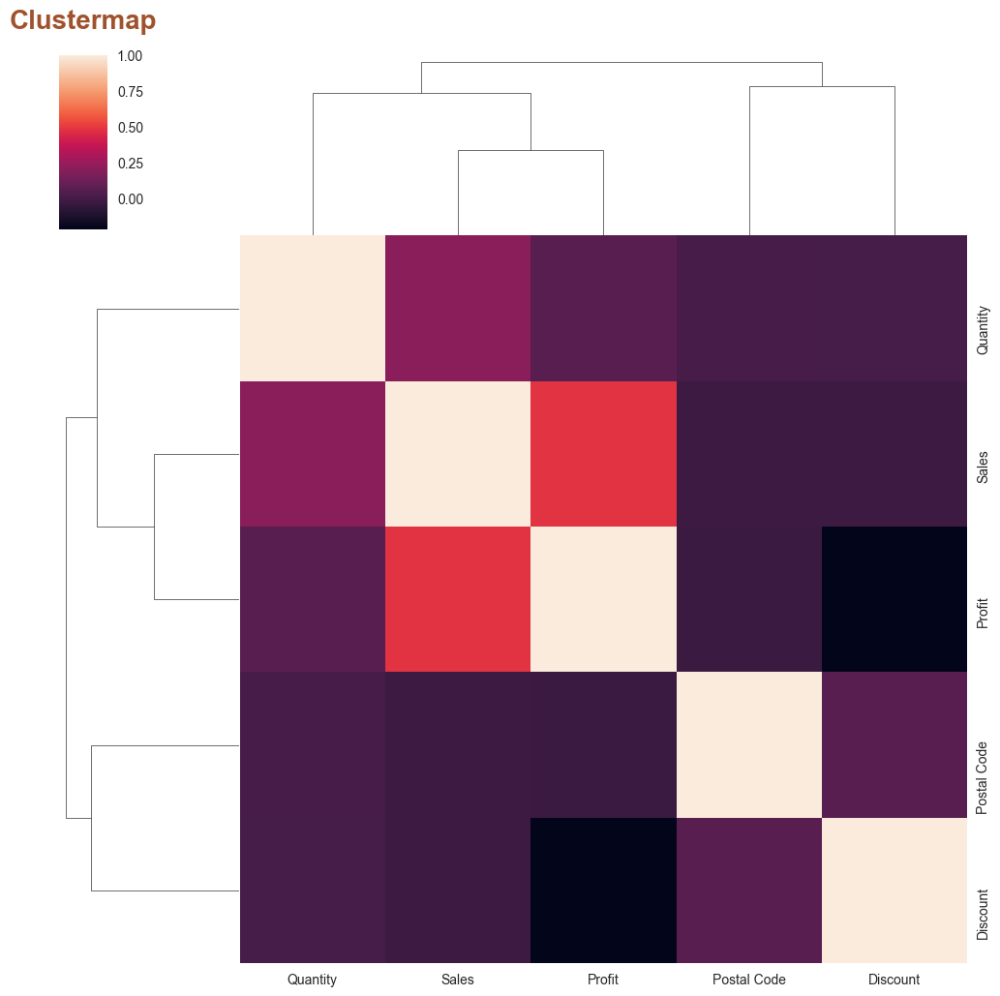

9817

In [40]:
plt.figure(figsize=(10,5))
fig = sns.clustermap(df.corr())
plt.title('Clustermap',pad=20,fontsize=20,fontweight='bold',color='sienna')
plt.show()
plt.close('all')
del fig
gc.collect()

<Figure size 1000x500 with 0 Axes>

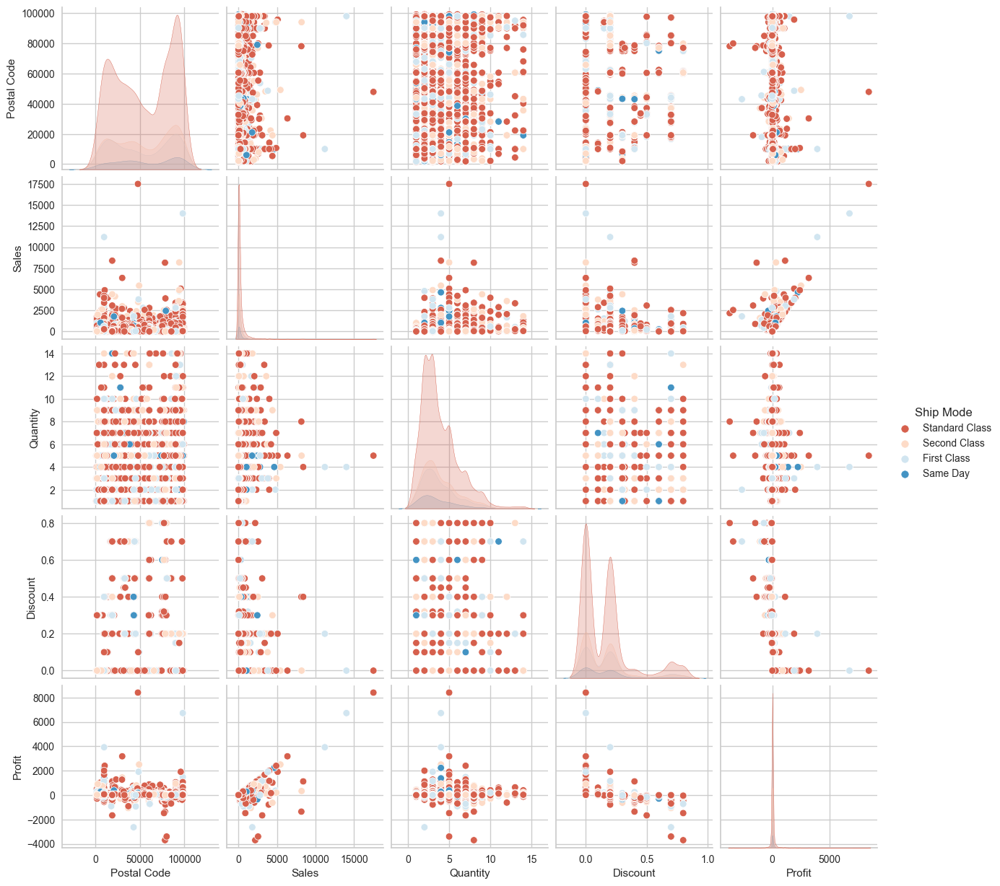

969

In [41]:
plt.figure(figsize=(10,5))
fig = sns.pairplot(df.sample(n=5000),hue='Ship Mode',palette='RdBu')
plt.show()
plt.close('all')
del fig
gc.collect()

## Feature Engineering

### Feature Extraction

In [42]:
df['Profit Margin'] = df['Profit']/df['Sales']
df['Discounted Profit'] = df['Profit']-df['Profit']*df['Discount']
df['Discount Percentage'] = df['Discount']/df['Sales']*100
df['Operating Expenses'] = df['Sales'] - df['Profit']
df['Net Profit'] = df['Profit'] - df['Discount']

In [43]:
df['Order Date'] = pd.to_datetime(df['Order Date'],errors='coerce')
df['Ship Date'] = pd.to_datetime(df['Ship Date'],errors='coerce')

In [44]:
df['Order Year'] = df['Order Date'].dt.year
df['Order Month'] = df['Order Date'].dt.month
df['Order Day'] = df['Order Date'].dt.day
df['Order Weekday'] = df['Order Date'].dt.dayofweek
df['Ship Year'] = df['Ship Date'].dt.year
df['Ship Month'] = df['Ship Date'].dt.month
df['Ship Day'] = df['Ship Date'].dt.day
df['Ship Weekday'] = df['Ship Date'].dt.dayofweek
df.drop(['Order Date','Ship Date'],axis=1,inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9993 entries, 0 to 9993
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Ship Mode            9993 non-null   object 
 1   Segment              9993 non-null   object 
 2   City                 9993 non-null   object 
 3   State                9993 non-null   object 
 4   Postal Code          9993 non-null   int64  
 5   Region               9993 non-null   object 
 6   Category             9993 non-null   object 
 7   Sub-Category         9993 non-null   object 
 8   Product Name         9993 non-null   object 
 9   Sales                9993 non-null   float64
 10  Quantity             9993 non-null   int64  
 11  Discount             9993 non-null   float64
 12  Profit               9993 non-null   float64
 13  Profit Margin        9993 non-null   float64
 14  Discounted Profit    9993 non-null   float64
 15  Discount Percentage  9993 non-null   f

### Categorical Encoding

In [45]:
df['Ship Mode'].unique()

array(['Second Class', 'Standard Class', 'First Class', 'Same Day'],
      dtype=object)

In [46]:
df['Segment'].unique()

array(['Consumer', 'Corporate', 'Home Office'], dtype=object)

In [47]:
df['Category'].unique()

array(['Furniture', 'Office Supplies', 'Technology'], dtype=object)

In [48]:
df['Sub-Category'].unique()

array(['Bookcases', 'Chairs', 'Labels', 'Tables', 'Storage',
       'Furnishings', 'Art', 'Phones', 'Binders', 'Appliances', 'Paper',
       'Accessories', 'Envelopes', 'Fasteners', 'Supplies', 'Machines',
       'Copiers'], dtype=object)

In [49]:
df['Product Name'].nunique()

1841

In [50]:
df['City'].nunique()

531

In [51]:
df['State'].nunique()

49

In [52]:
df['Region'].unique()

array(['South', 'West', 'Central', 'East'], dtype=object)

In [53]:
def onehotencode(data: pd.DataFrame,col: str) -> pd.DataFrame:
    encoder = OneHotEncoder(drop='first',sparse_output=False,max_categories=10)
    encoded_data = encoder.fit_transform(data[[col]])
    encoded_data = pd.DataFrame(encoded_data,columns=encoder.get_feature_names_out())
    return encoded_data

In [54]:
for col in ['Ship Mode','Segment','State','City','Region','Category','Sub-Category','Product Name']:
    encoded_data = onehotencode(df,col)
    df = pd.concat([df,encoded_data],axis=1)
    df.drop(col,axis=1,inplace=True)

In [55]:
transformer = ColumnTransformer(transformers=[
    ('log_transform',FunctionTransformer(np.log1p),['Quantity','Profit','Discounted Profit','Net Profit']),
    ('sqrt_transform',FunctionTransformer(np.sqrt),['Discount']),
    ('power_transform',PowerTransformer(),['Profit Margin','Discount Percentage','Operating Expenses'])
],remainder='passthrough')
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('log_transform',
                                 FunctionTransformer(func=<ufunc 'log1p'>),
                                 ['Quantity', 'Profit', 'Discounted Profit',
                                  'Net Profit']),
                                ('sqrt_transform',
                                 FunctionTransformer(func=<ufunc 'sqrt'>),
                                 ['Discount']),
                                ('power_transform', PowerTransformer(),
                                 ['Profit Margin', 'Discount Percentage',
                                  'Operating Expenses'])])

### Feature Transformation

In [56]:
skewed_cols = ['Quantity',
 'Discount',
 'Profit',
 'Profit Margin',
 'Discounted Profit',
 'Discount Percentage',
 'Operating Expenses',
 'Net Profit',
 'Order Day',
 'Order Weekday',
 'Order Month',
 'Ship Day']

Skewness of Quantity: 1.2784155399852233
Kurtosis of Quantity: 1.9915827160047757


posx and posy should be finite values
posx and posy should be finite values


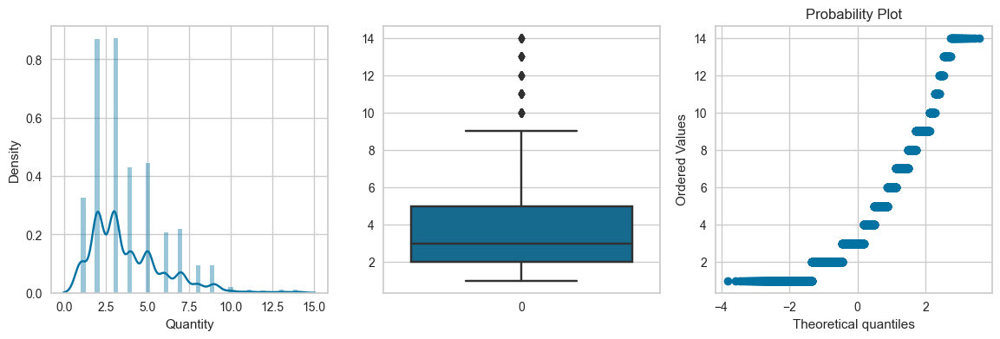

Skewness of Discount: 1.6845084876700462
Kurtosis of Discount: 2.409976524801519


posx and posy should be finite values
posx and posy should be finite values


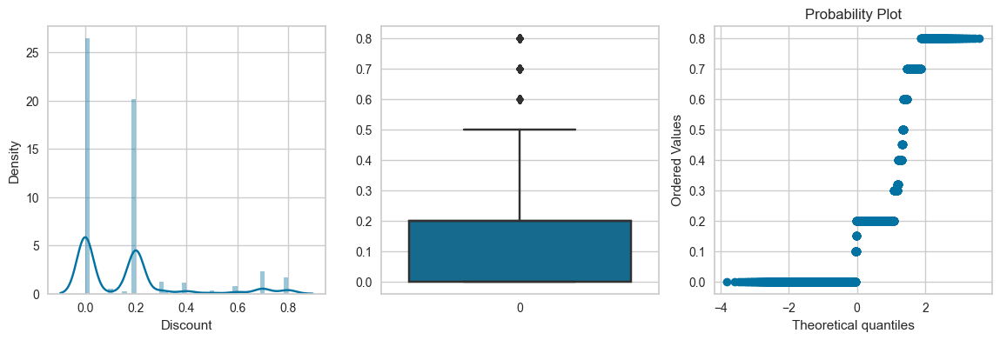

Skewness of Profit: 7.561035996041436
Kurtosis of Profit: 397.15038474389223


posx and posy should be finite values
posx and posy should be finite values


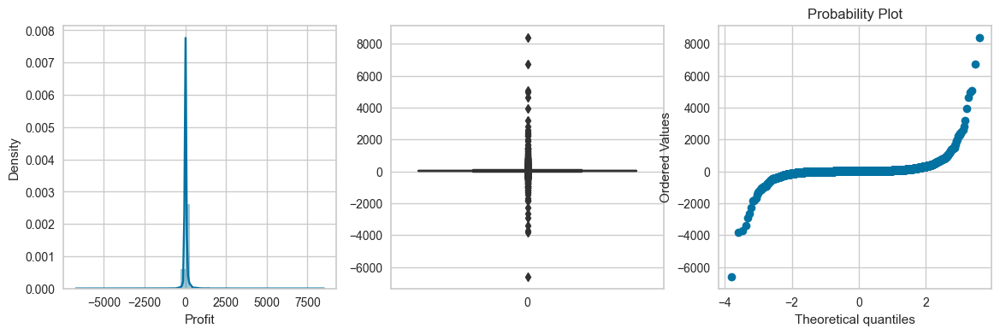

Skewness of Profit Margin: -2.894835315865789
Kurtosis of Profit Margin: 10.172752622828092


posx and posy should be finite values
posx and posy should be finite values


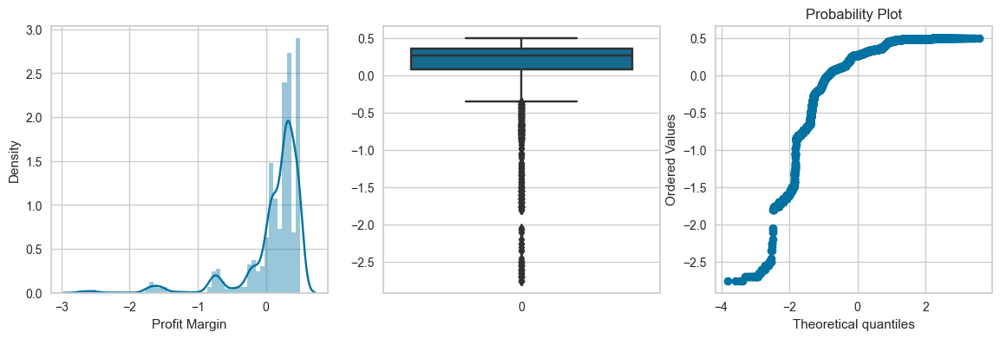

Skewness of Discounted Profit: 19.35659799419806
Kurtosis of Discounted Profit: 617.6369152241313


posx and posy should be finite values
posx and posy should be finite values


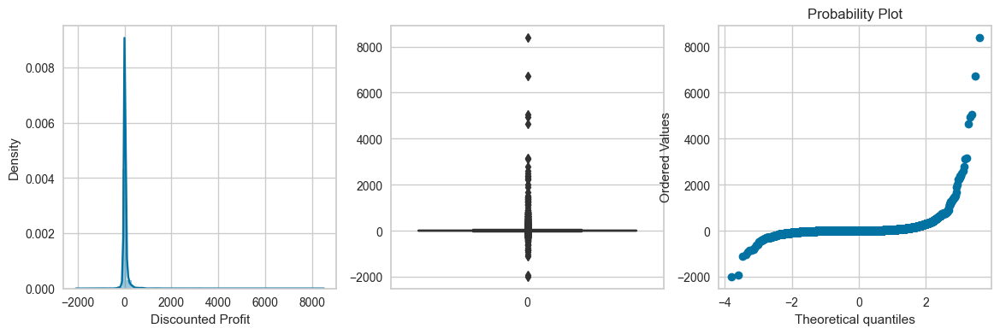

Skewness of Discount Percentage: 10.828151381652273
Kurtosis of Discount Percentage: 188.85920639655157


posx and posy should be finite values
posx and posy should be finite values


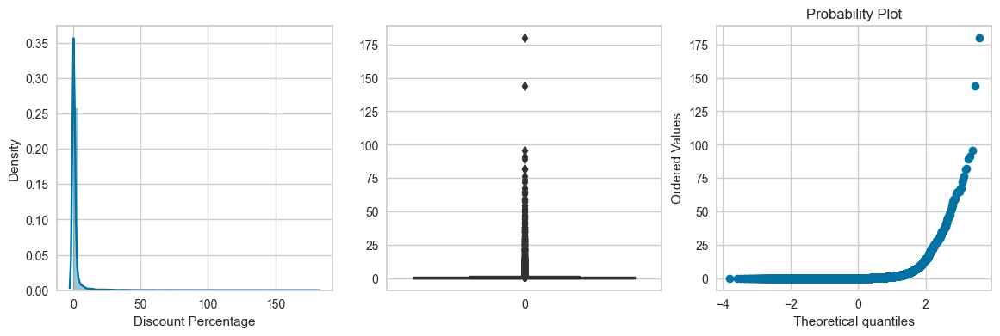

Skewness of Operating Expenses: 14.752446377055431
Kurtosis of Operating Expenses: 454.5499992208234


posx and posy should be finite values
posx and posy should be finite values


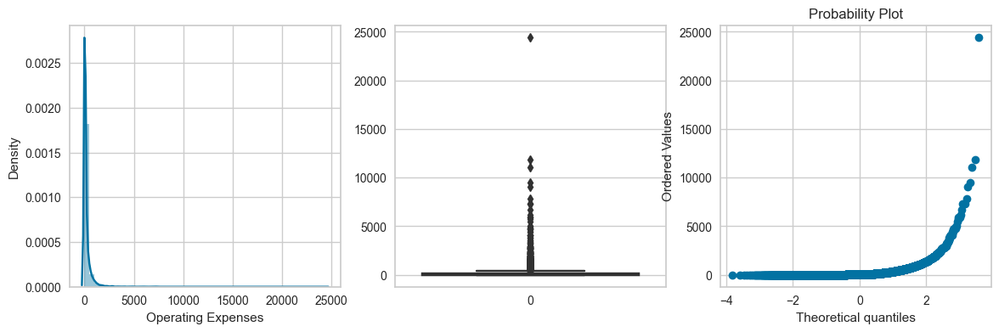

Skewness of Net Profit: 7.555768996026929
Kurtosis of Net Profit: 396.9091881919584


posx and posy should be finite values
posx and posy should be finite values


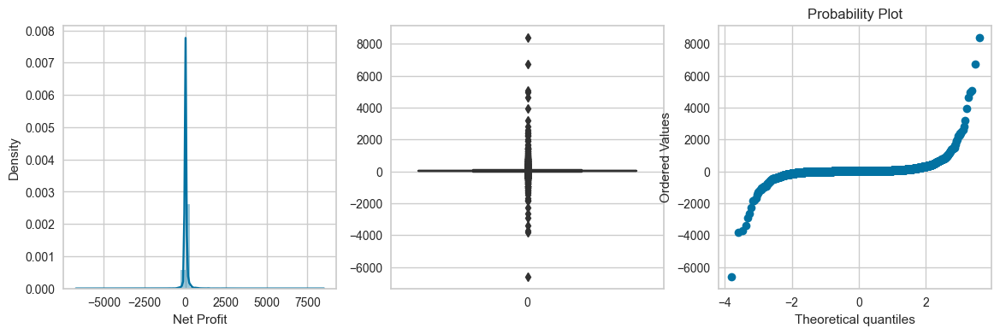

Skewness of Order Day: 0.013550065823461663
Kurtosis of Order Day: -1.1861898468255059


posx and posy should be finite values
posx and posy should be finite values


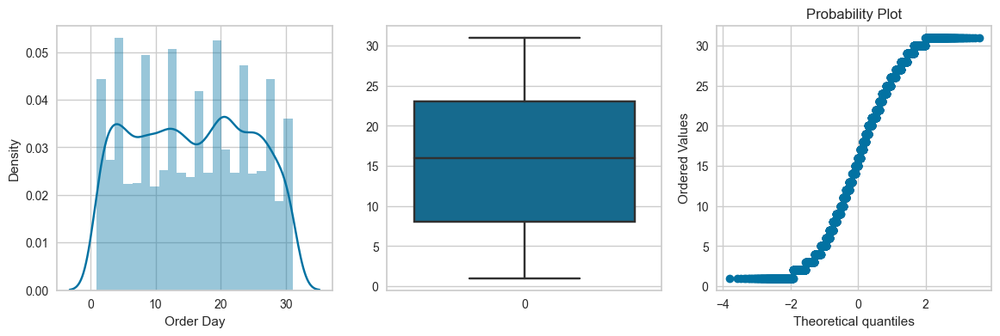

Skewness of Order Weekday: 0.12340952691336028
Kurtosis of Order Weekday: -1.0869179921056922


posx and posy should be finite values
posx and posy should be finite values


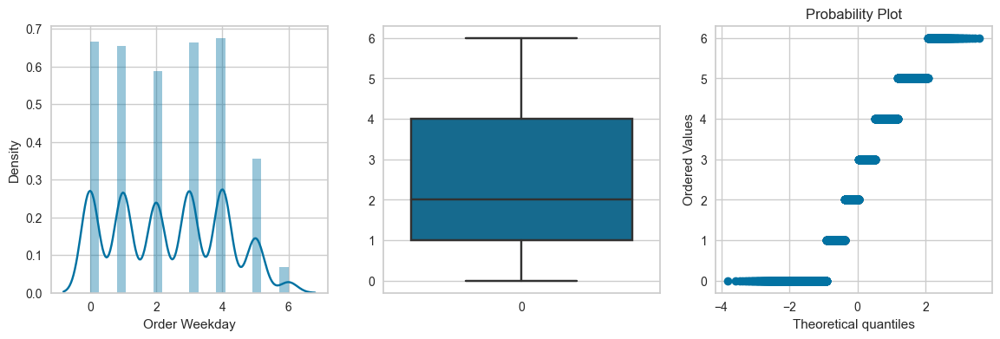

Skewness of Order Month: -0.4329511345177871
Kurtosis of Order Month: -0.9846637321437535


posx and posy should be finite values
posx and posy should be finite values


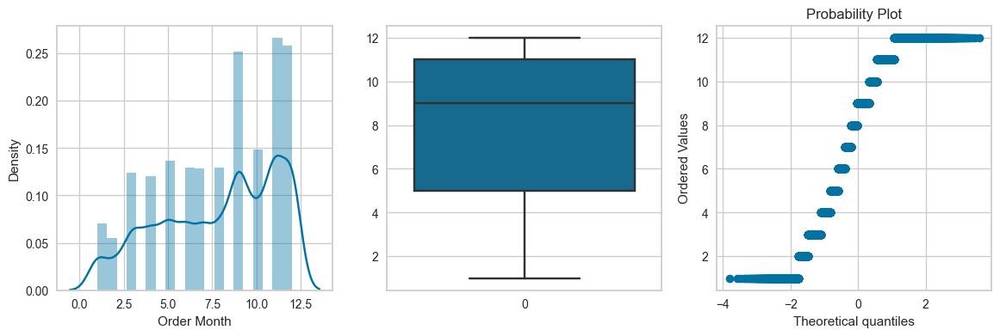

Skewness of Ship Day: -0.012355797229445813
Kurtosis of Ship Day: -1.2070053450291567


posx and posy should be finite values
posx and posy should be finite values


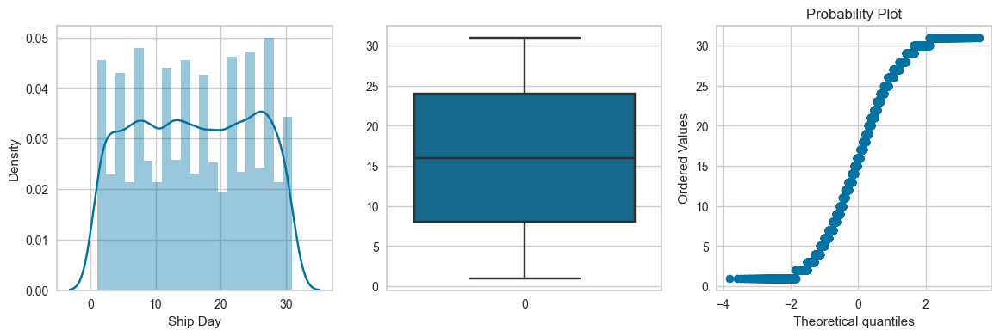

In [57]:
for col in skewed_cols:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurt())
    plt.subplots(nrows=1,ncols=2,figsize=(14,4))
    plt.subplot(1,3,1)
    sns.distplot(df[col])
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    probplot(df[col],plot=plt,dist='norm',rvalue=True)
    plt.show()

In [61]:
def apply_transform(data,col,transformer):
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(data[col])
    plt.subplot(132)
    sns.boxplot(data[col])
    plt.subplot(133)
    probplot(data[col],rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} Before Transform")
    plt.show()
    col_tf = transformer.fit_transform(data[[col]])
    col_tf = np.array(col_tf).reshape(col_tf.shape[0])
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(col_tf)
    plt.subplot(132)
    sns.boxplot(col_tf)
    plt.subplot(133)
    probplot(col_tf,rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} After Transform")
    plt.show()
    gc.collect();

posx and posy should be finite values
posx and posy should be finite values


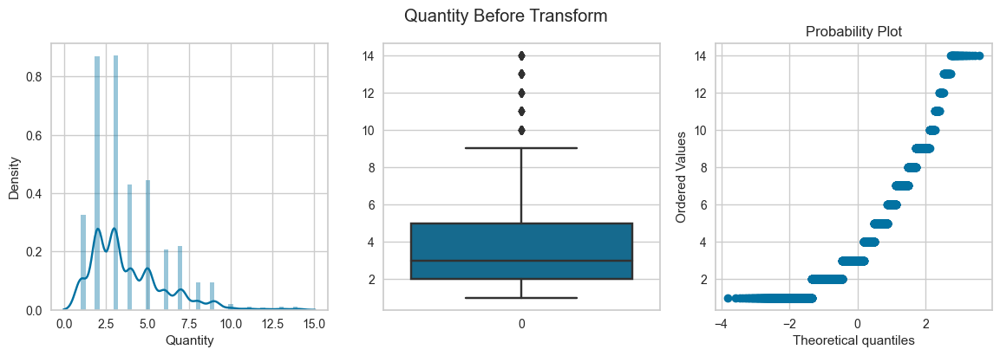

posx and posy should be finite values
posx and posy should be finite values


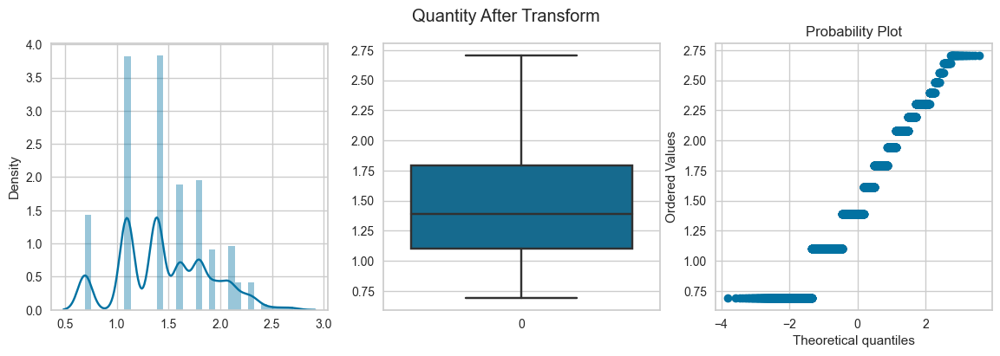

posx and posy should be finite values
posx and posy should be finite values


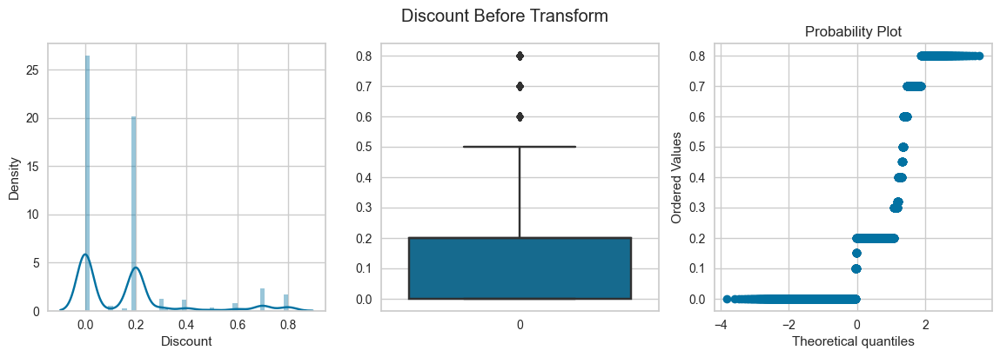

posx and posy should be finite values
posx and posy should be finite values


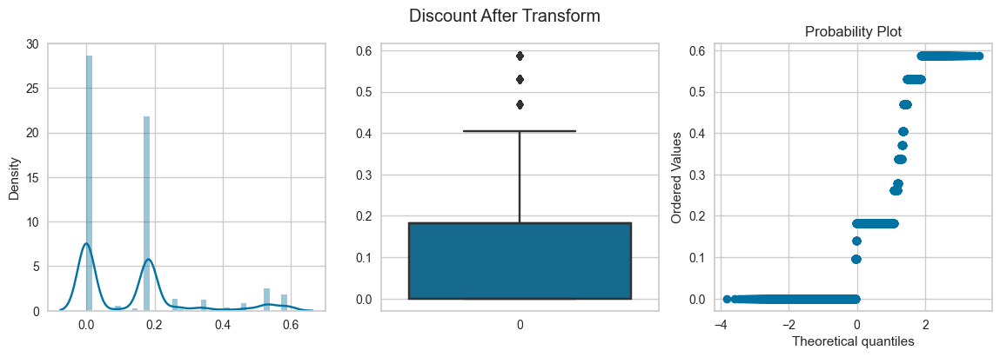

posx and posy should be finite values
posx and posy should be finite values


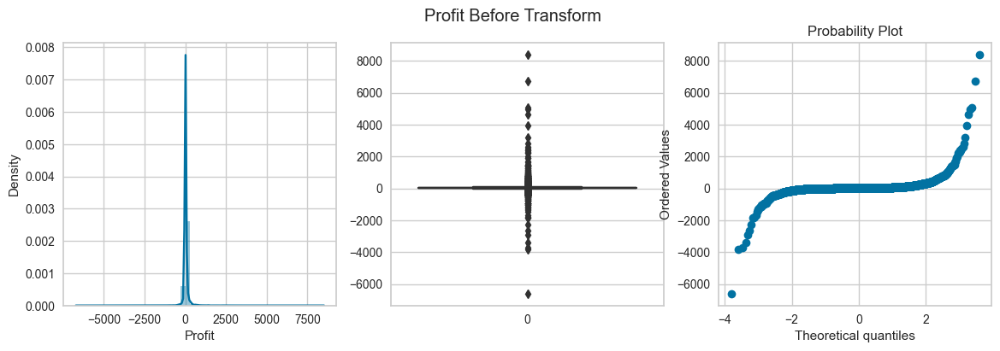

posx and posy should be finite values
posx and posy should be finite values


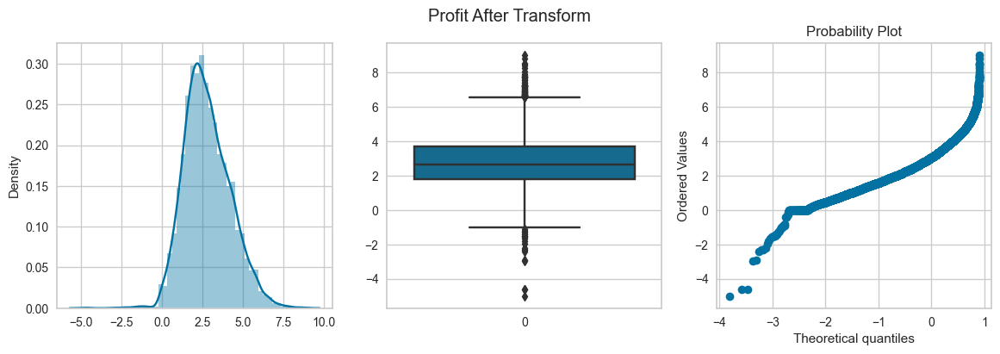

posx and posy should be finite values
posx and posy should be finite values


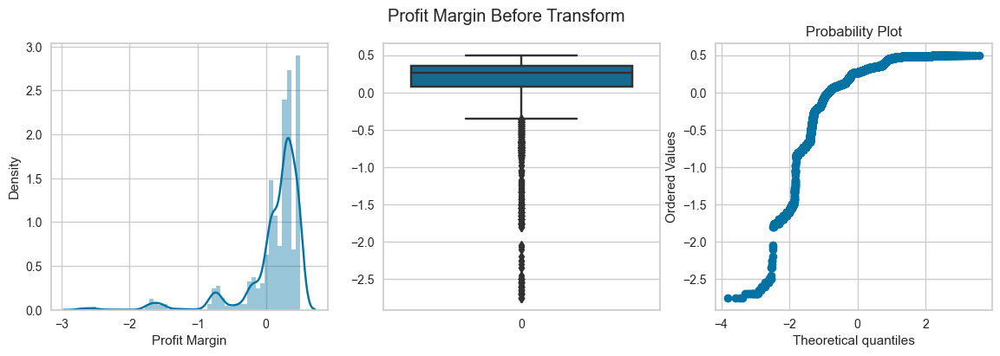

posx and posy should be finite values
posx and posy should be finite values


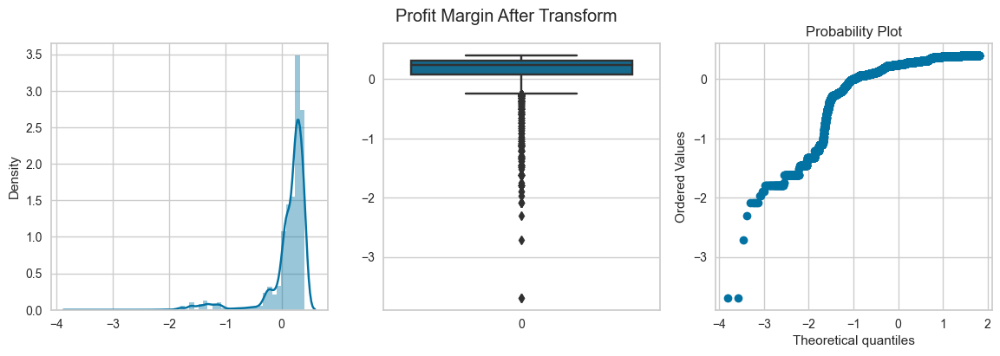

posx and posy should be finite values
posx and posy should be finite values


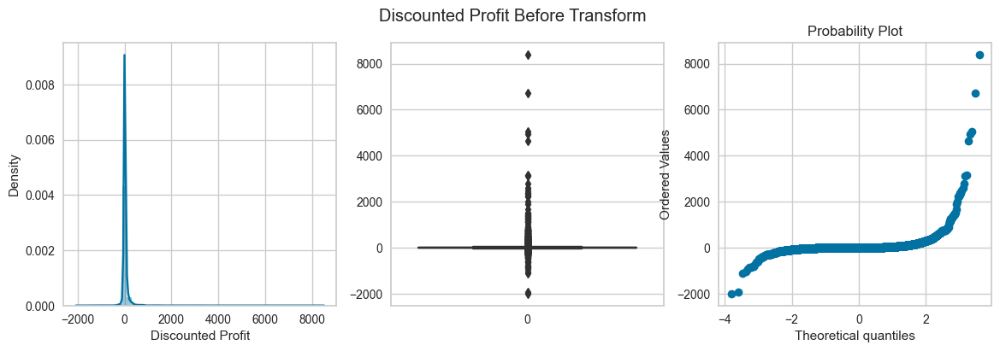

posx and posy should be finite values
posx and posy should be finite values


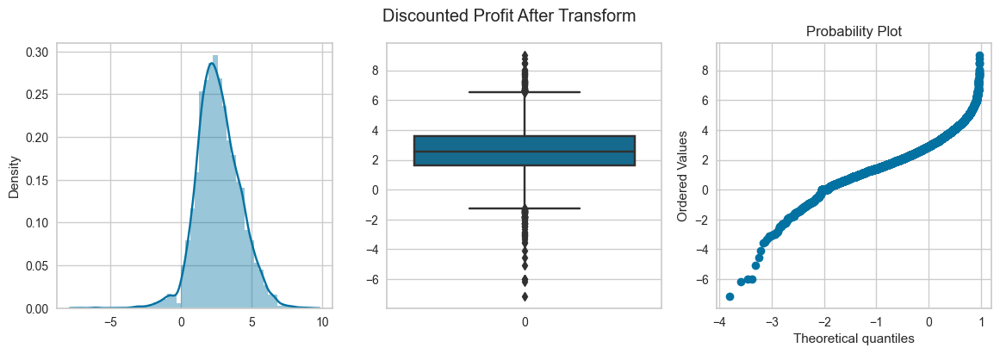

posx and posy should be finite values
posx and posy should be finite values


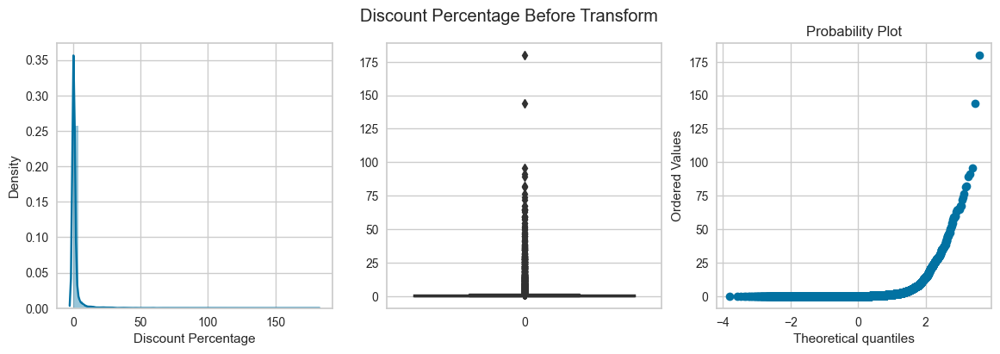

posx and posy should be finite values
posx and posy should be finite values


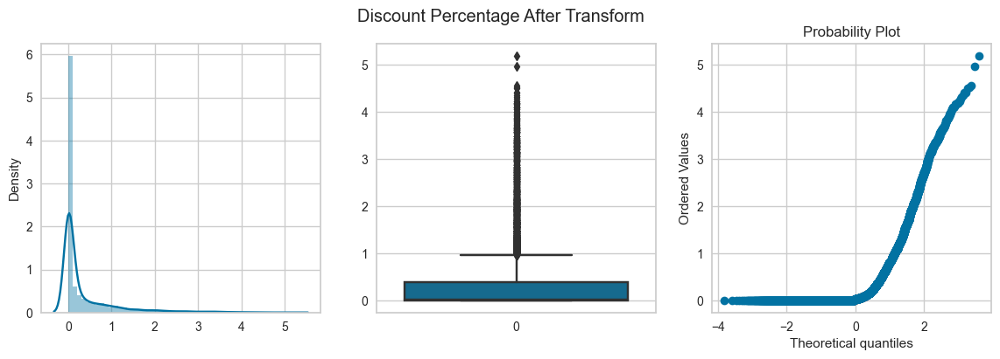

posx and posy should be finite values
posx and posy should be finite values


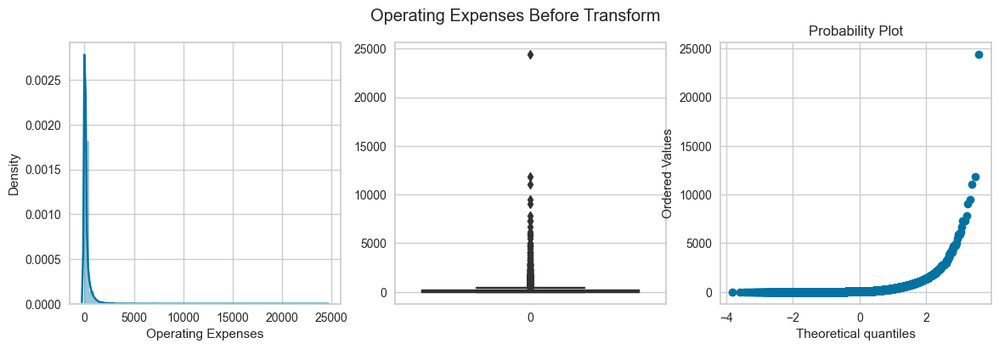

posx and posy should be finite values
posx and posy should be finite values


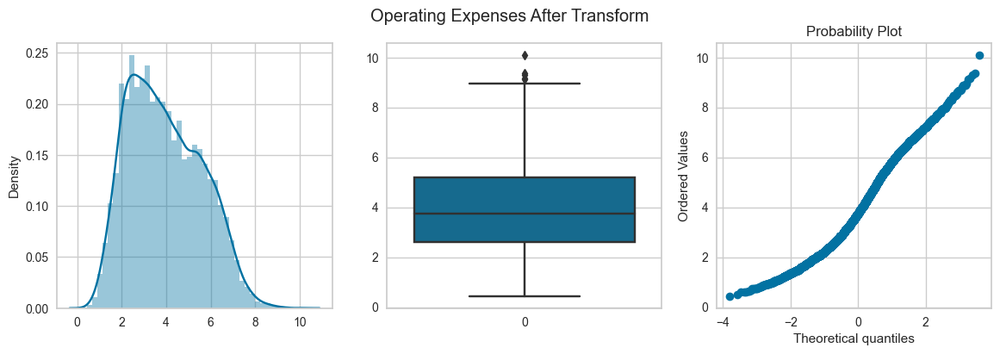

posx and posy should be finite values
posx and posy should be finite values


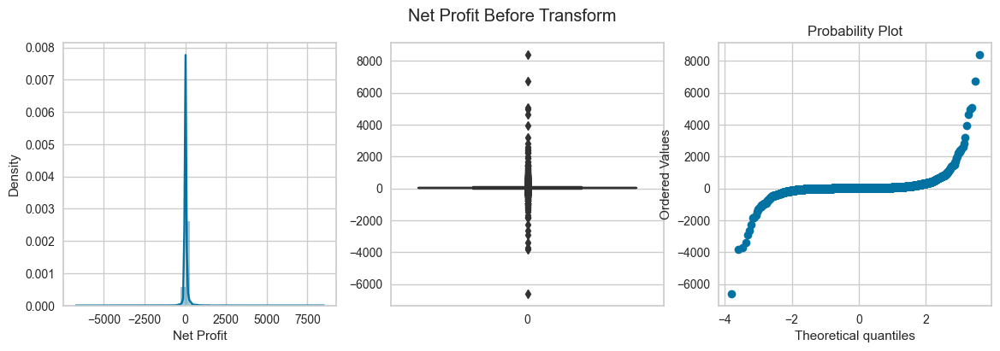

posx and posy should be finite values
posx and posy should be finite values


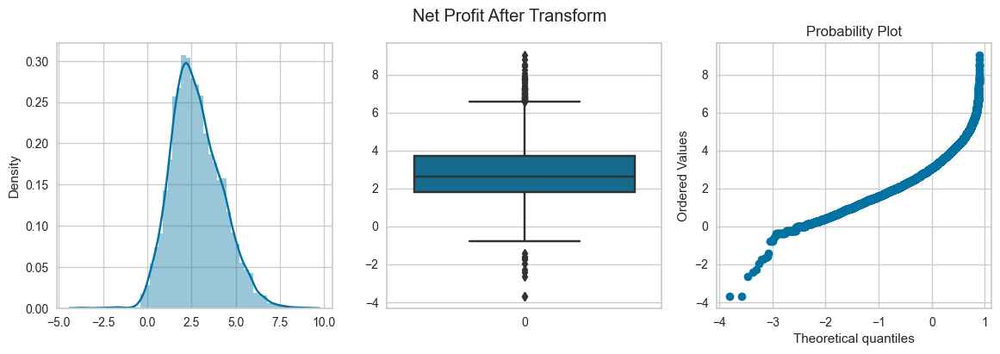

posx and posy should be finite values
posx and posy should be finite values


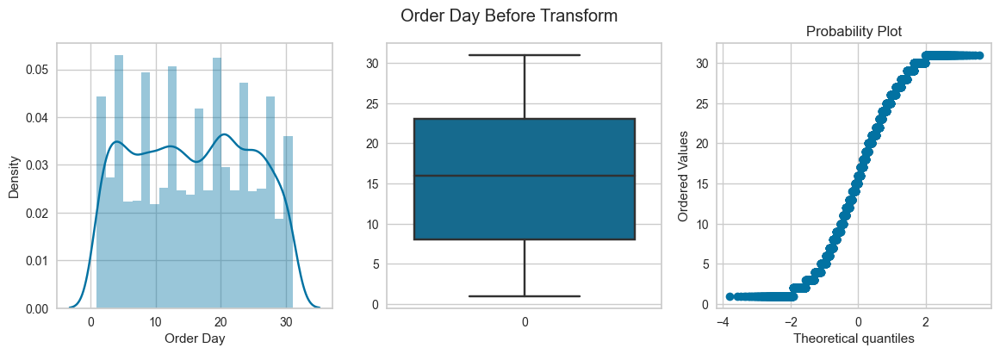

posx and posy should be finite values
posx and posy should be finite values


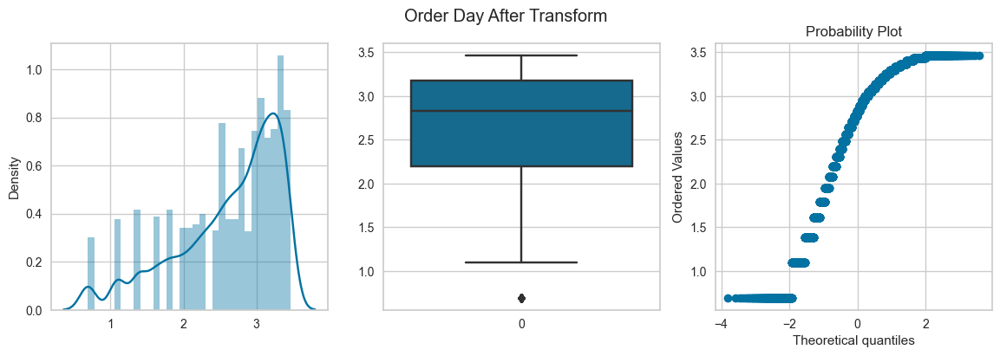

posx and posy should be finite values
posx and posy should be finite values


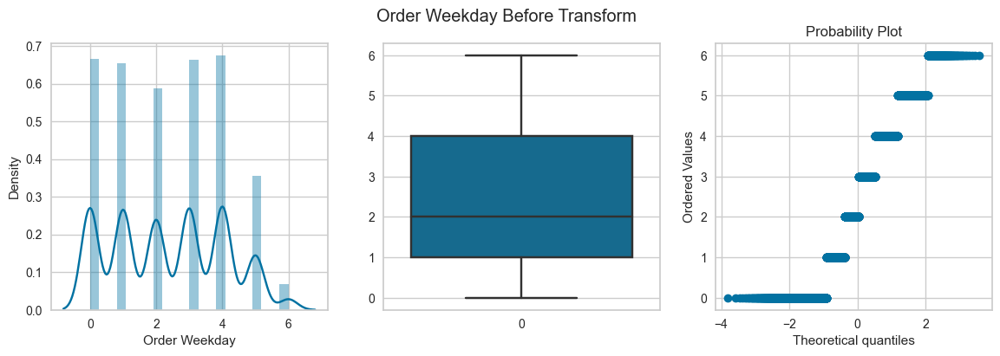

posx and posy should be finite values
posx and posy should be finite values


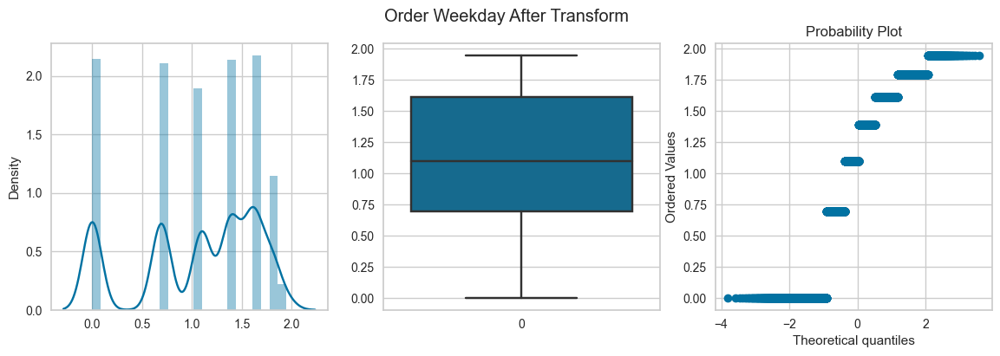

posx and posy should be finite values
posx and posy should be finite values


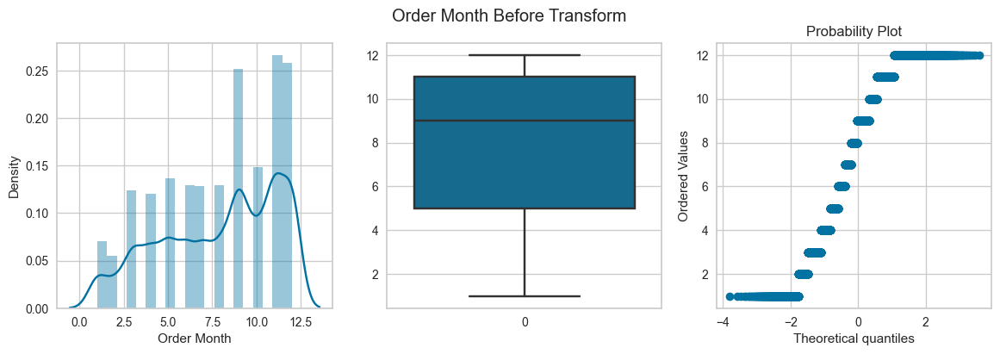

posx and posy should be finite values
posx and posy should be finite values


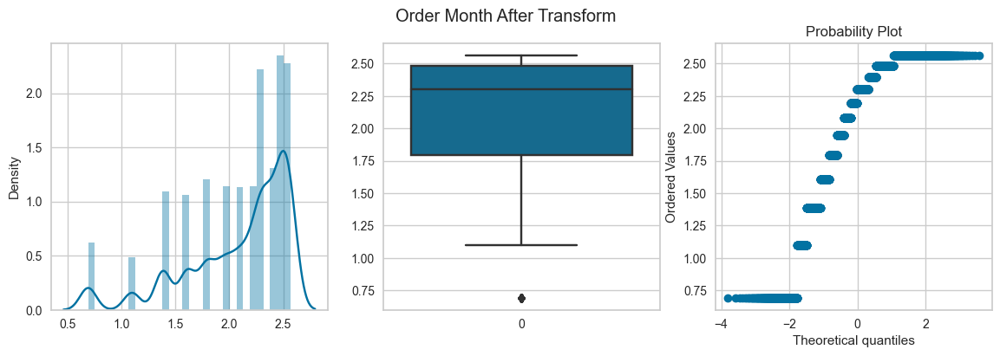

posx and posy should be finite values
posx and posy should be finite values


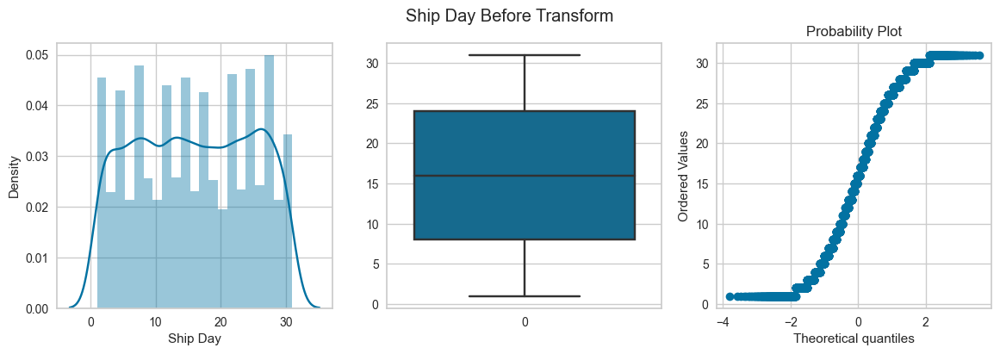

posx and posy should be finite values
posx and posy should be finite values


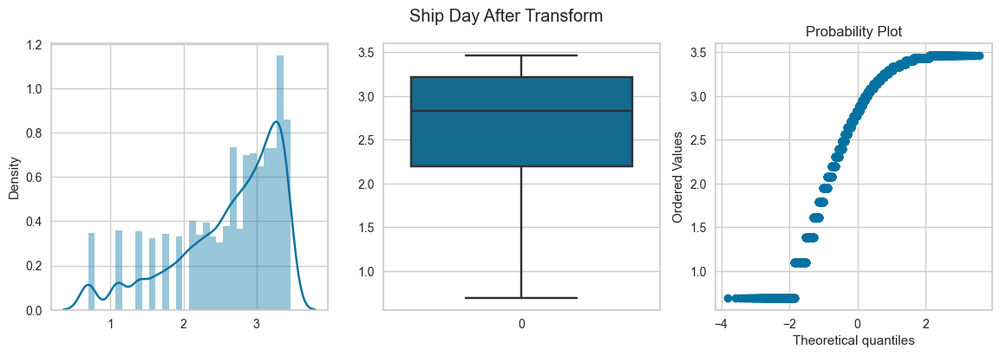

In [62]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.log1p))

posx and posy should be finite values
posx and posy should be finite values


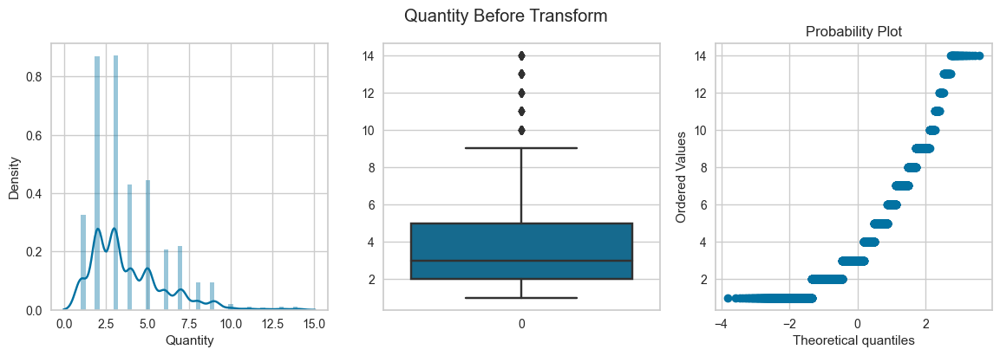

posx and posy should be finite values
posx and posy should be finite values


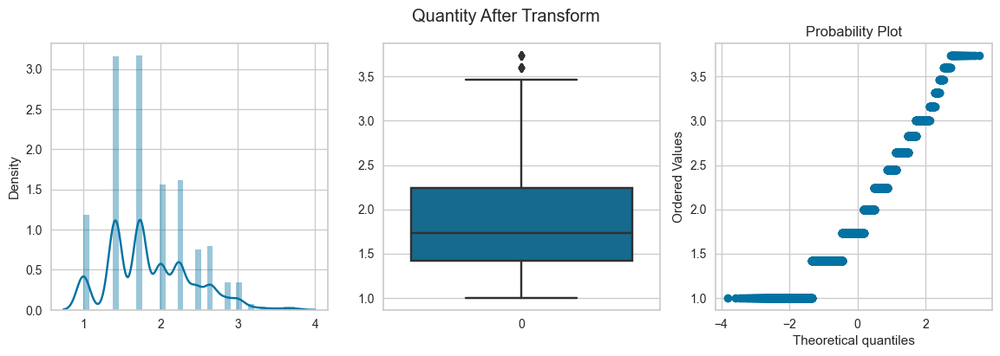

posx and posy should be finite values
posx and posy should be finite values


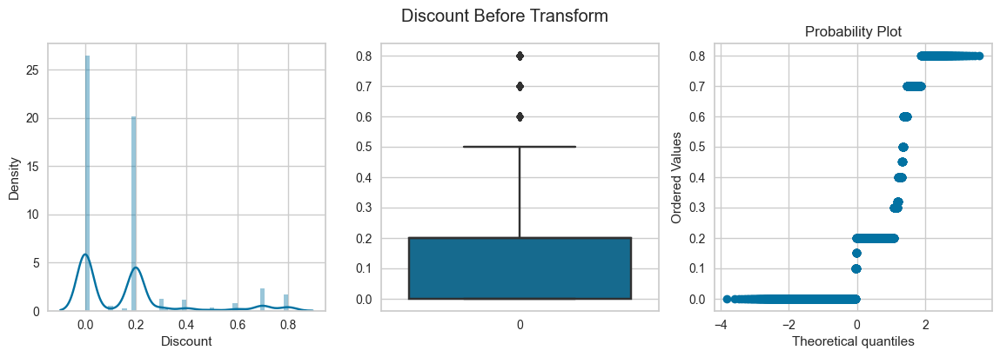

posx and posy should be finite values
posx and posy should be finite values


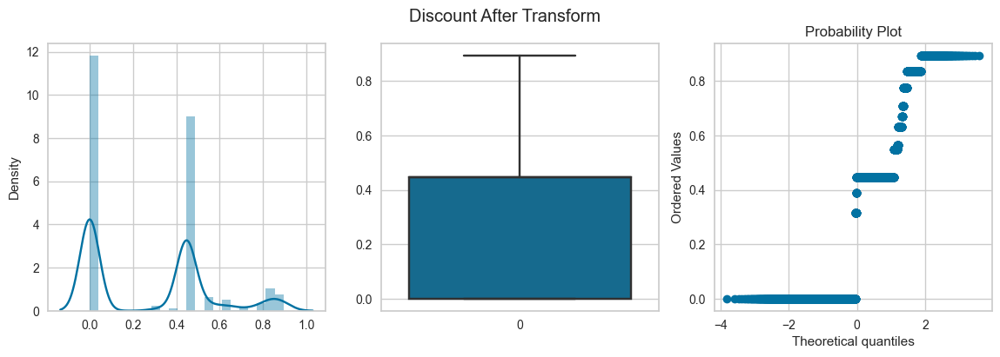

posx and posy should be finite values
posx and posy should be finite values


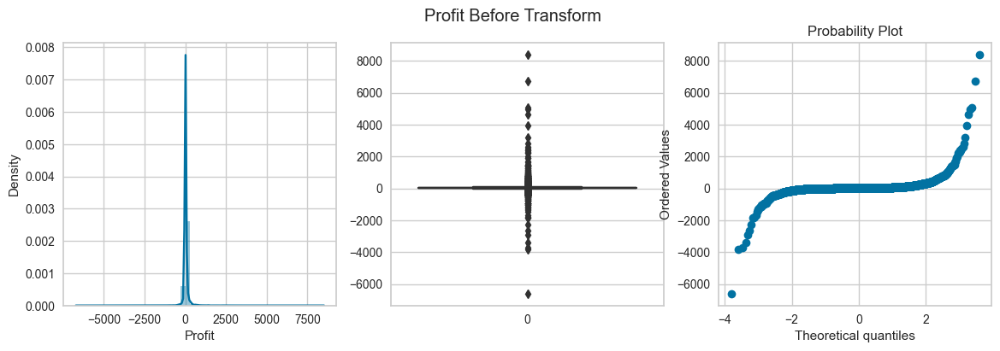

posx and posy should be finite values
posx and posy should be finite values


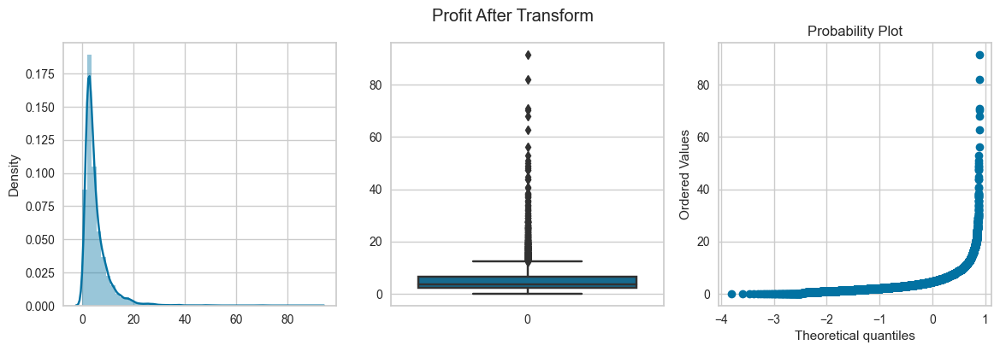

posx and posy should be finite values
posx and posy should be finite values


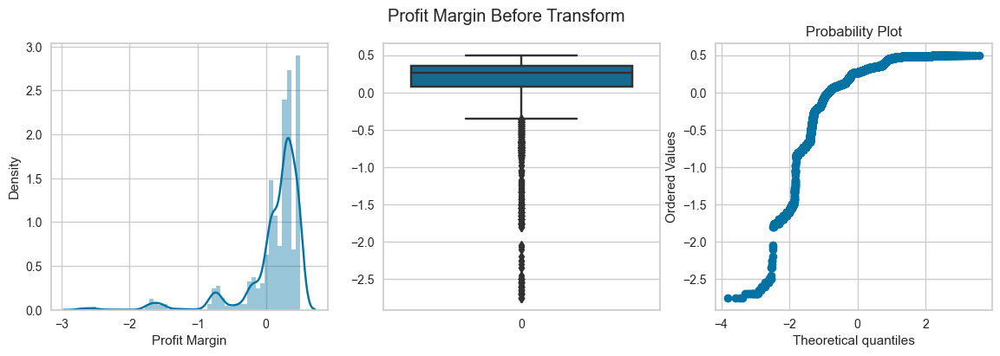

posx and posy should be finite values
posx and posy should be finite values


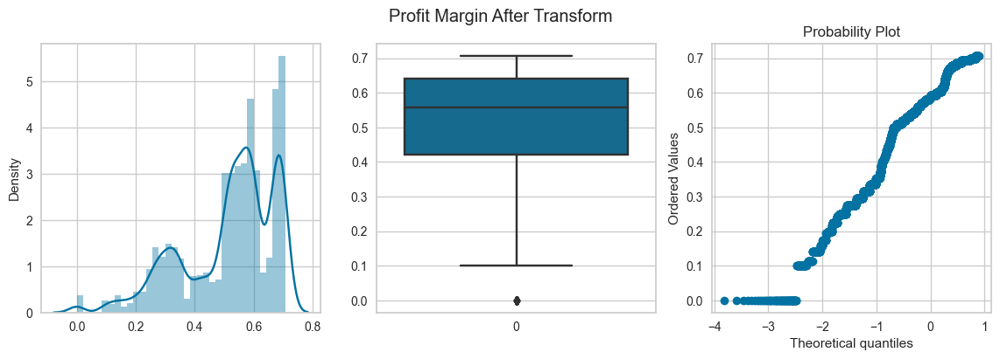

posx and posy should be finite values
posx and posy should be finite values


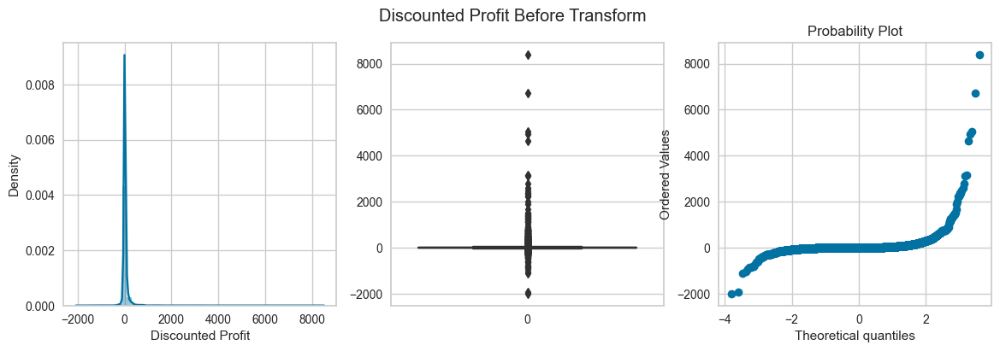

posx and posy should be finite values
posx and posy should be finite values


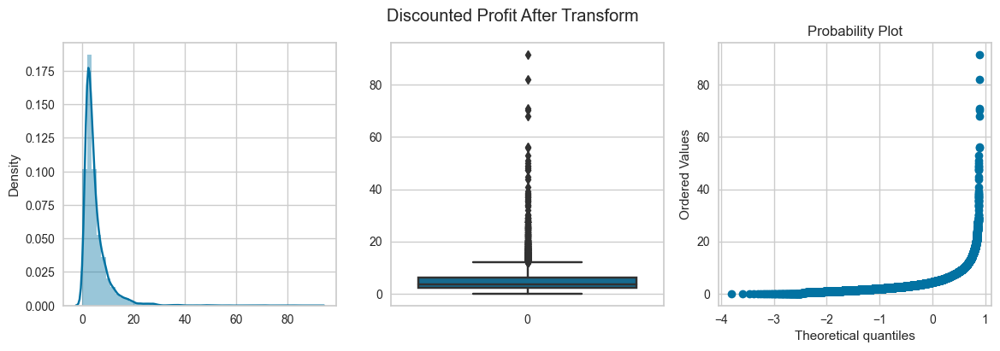

posx and posy should be finite values
posx and posy should be finite values


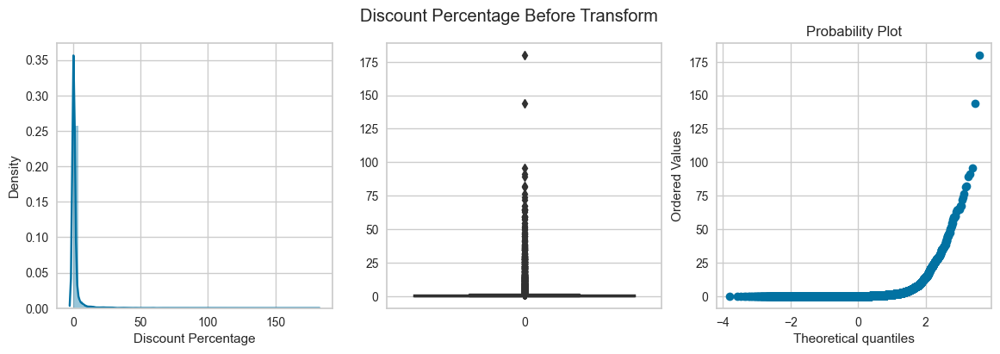

posx and posy should be finite values
posx and posy should be finite values


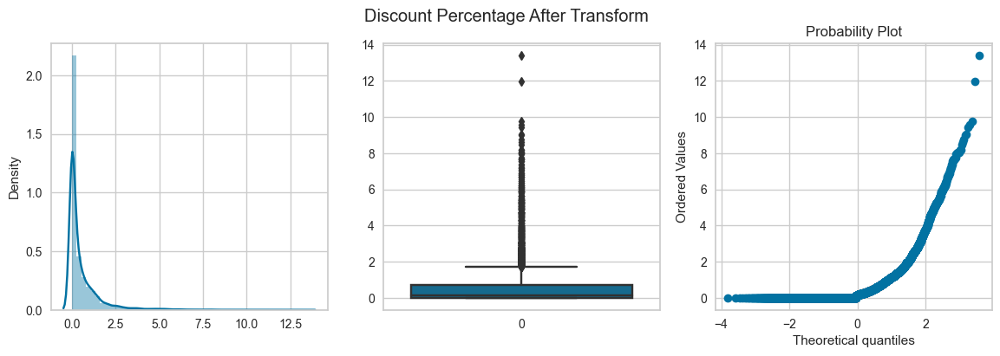

posx and posy should be finite values
posx and posy should be finite values


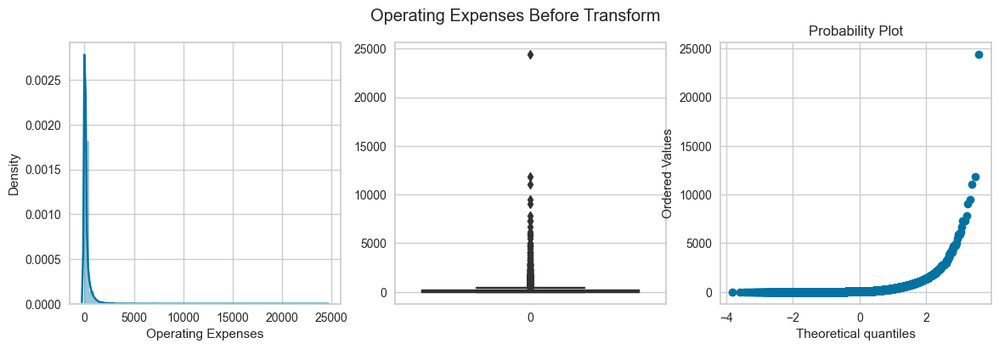

posx and posy should be finite values
posx and posy should be finite values


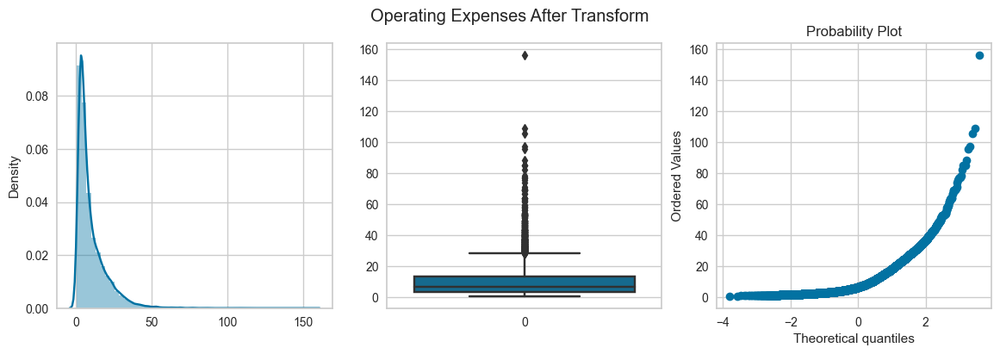

posx and posy should be finite values
posx and posy should be finite values


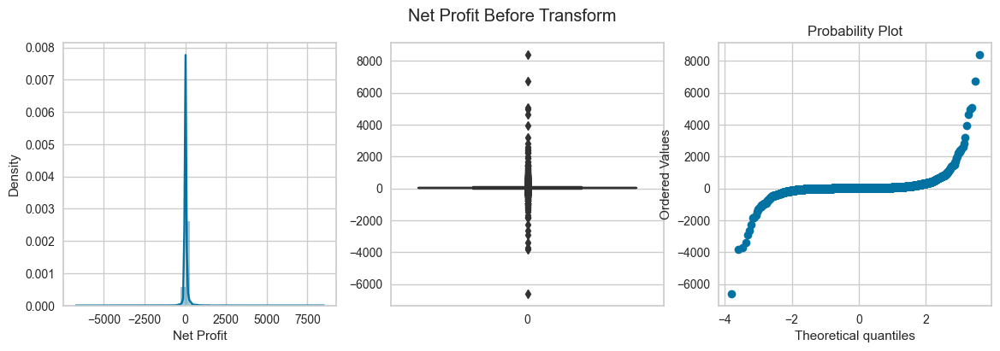

posx and posy should be finite values
posx and posy should be finite values


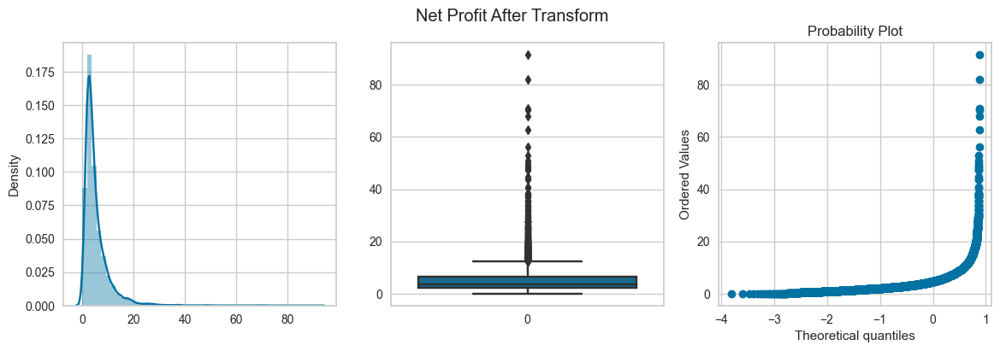

posx and posy should be finite values
posx and posy should be finite values


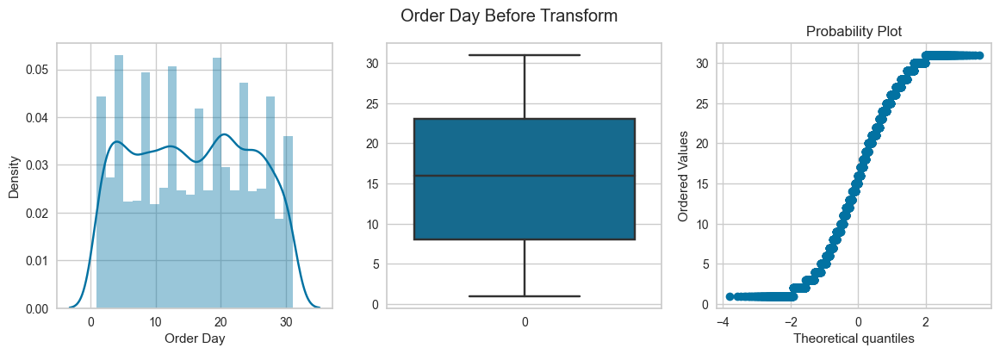

posx and posy should be finite values
posx and posy should be finite values


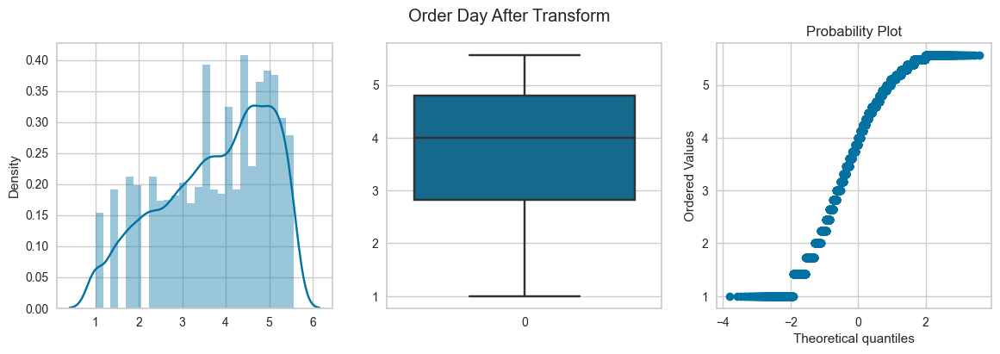

posx and posy should be finite values
posx and posy should be finite values


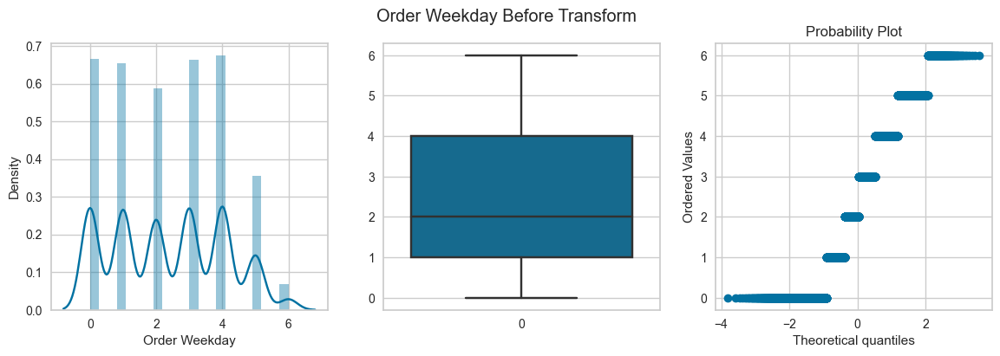

posx and posy should be finite values
posx and posy should be finite values


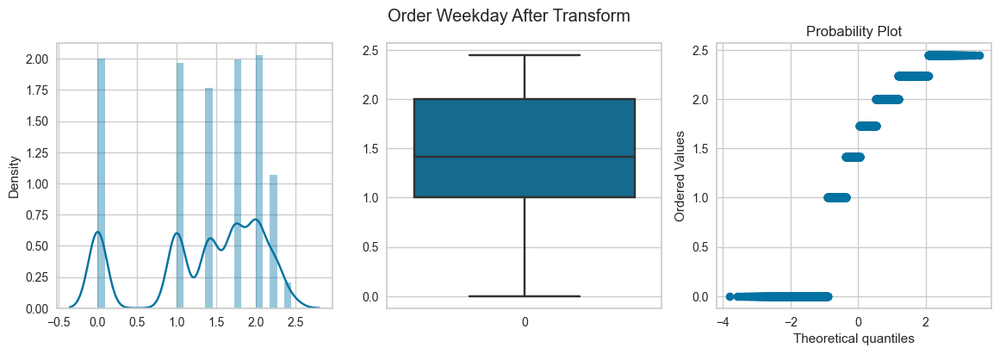

posx and posy should be finite values
posx and posy should be finite values


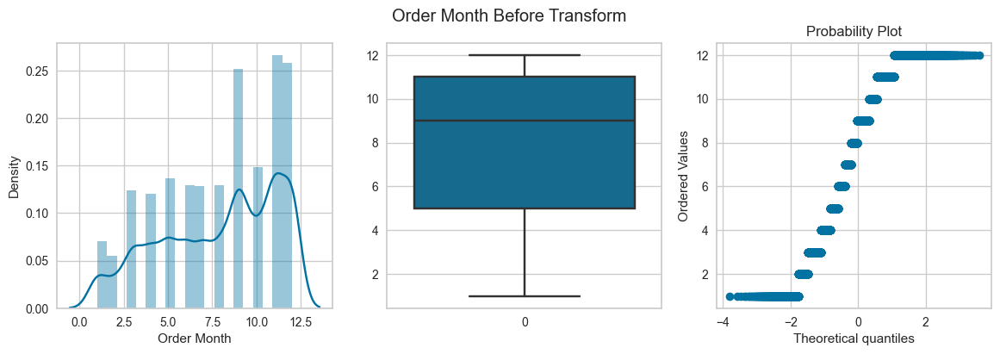

posx and posy should be finite values
posx and posy should be finite values


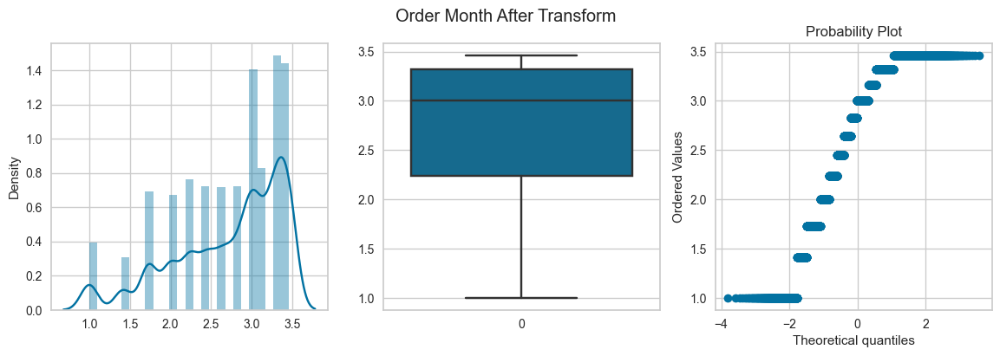

posx and posy should be finite values
posx and posy should be finite values


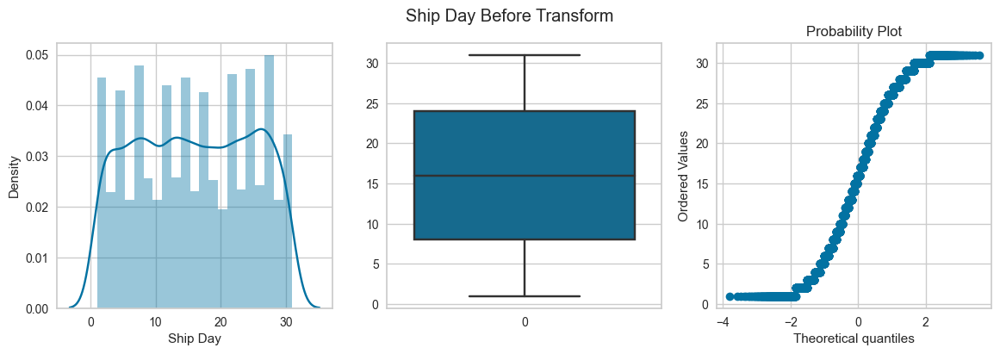

posx and posy should be finite values
posx and posy should be finite values


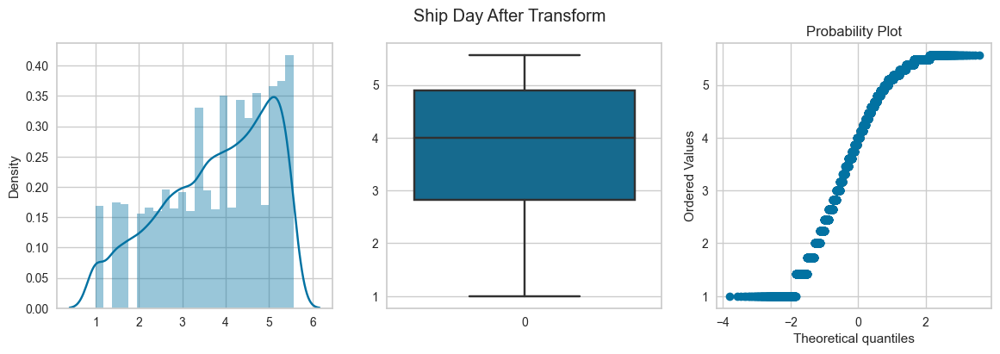

In [63]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.sqrt))

posx and posy should be finite values
posx and posy should be finite values


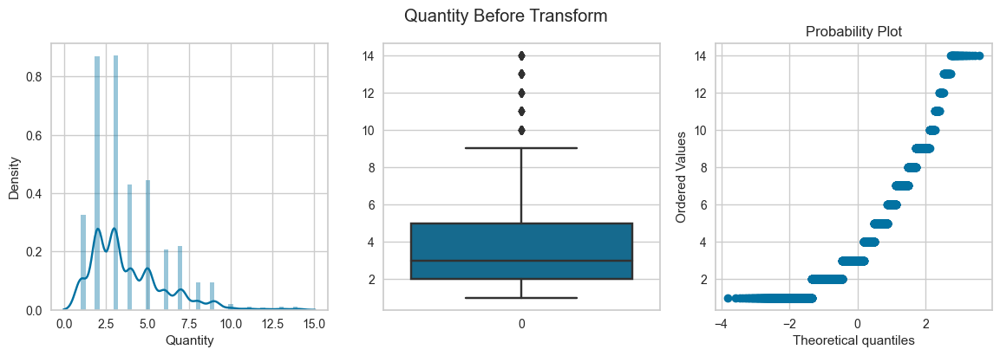

posx and posy should be finite values
posx and posy should be finite values


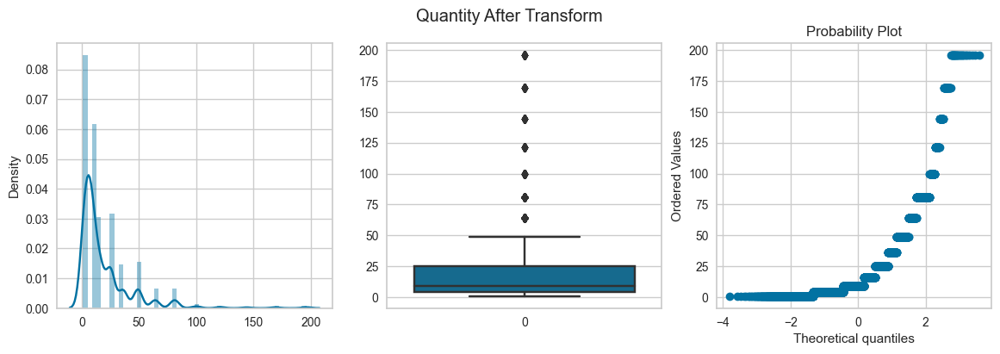

posx and posy should be finite values
posx and posy should be finite values


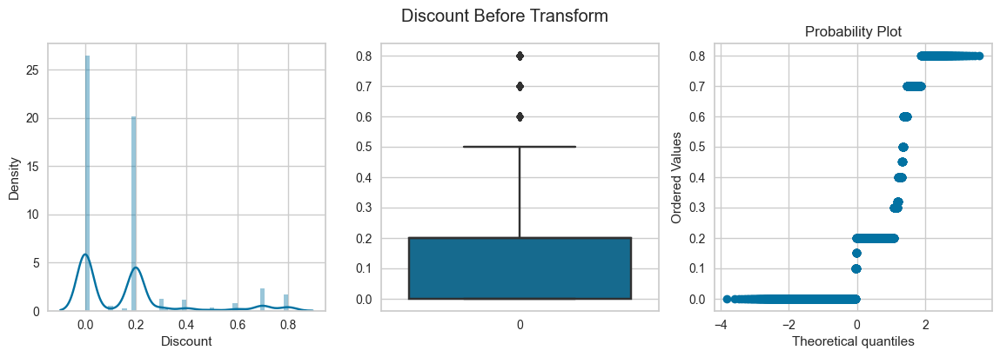

posx and posy should be finite values
posx and posy should be finite values


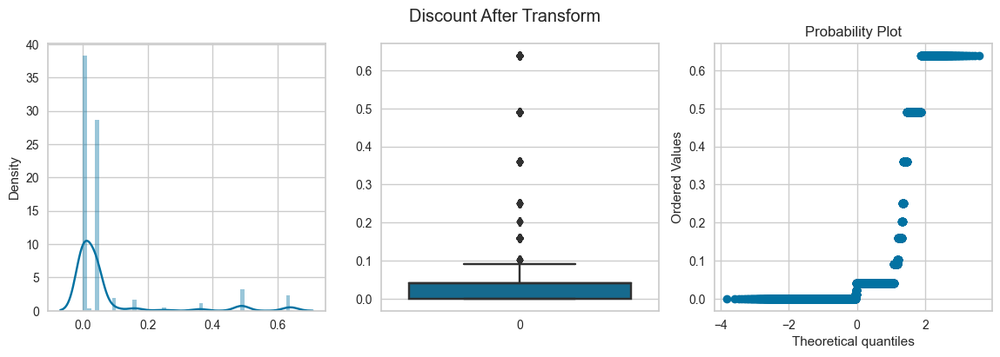

posx and posy should be finite values
posx and posy should be finite values


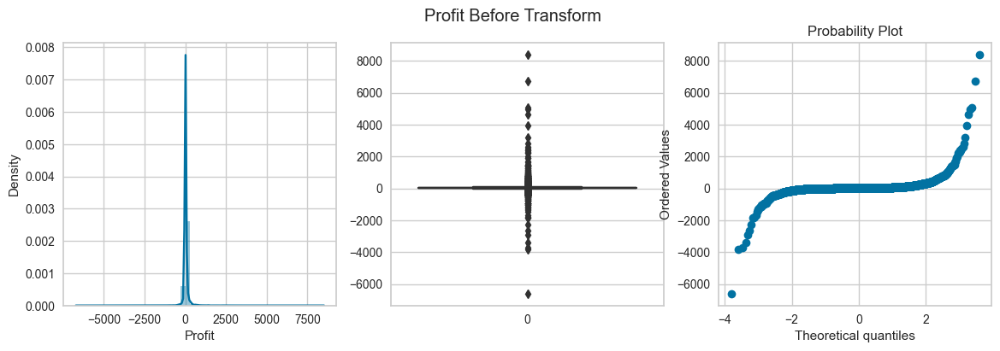

posx and posy should be finite values
posx and posy should be finite values


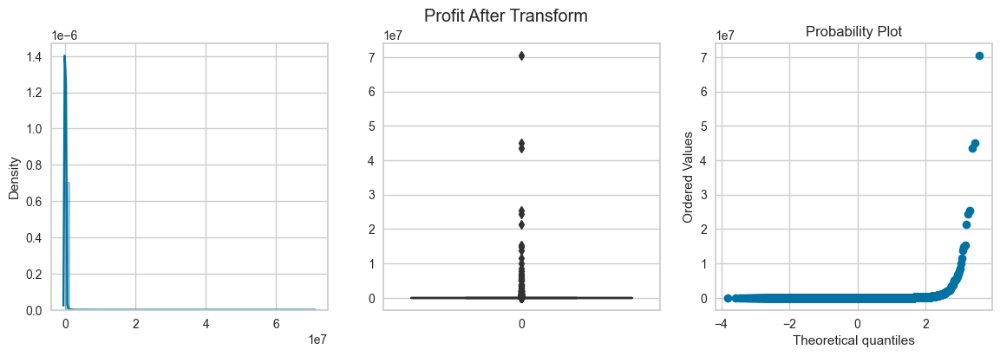

posx and posy should be finite values
posx and posy should be finite values


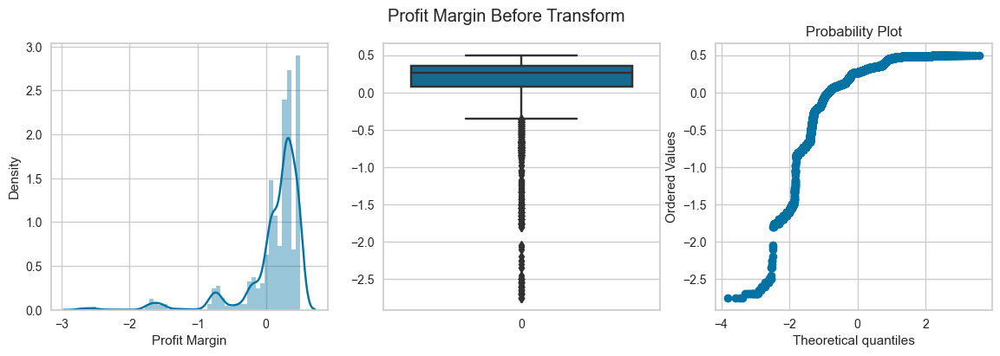

posx and posy should be finite values
posx and posy should be finite values


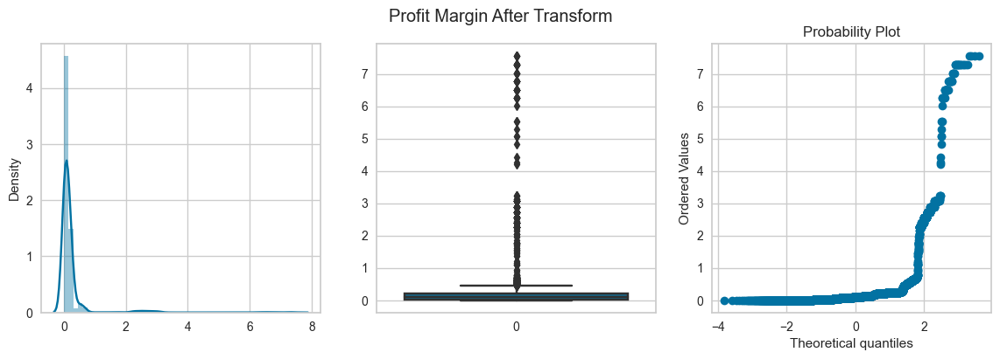

posx and posy should be finite values
posx and posy should be finite values


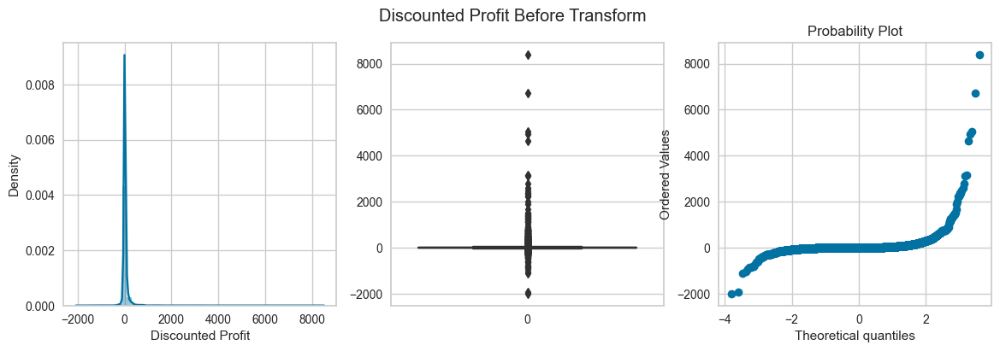

posx and posy should be finite values
posx and posy should be finite values


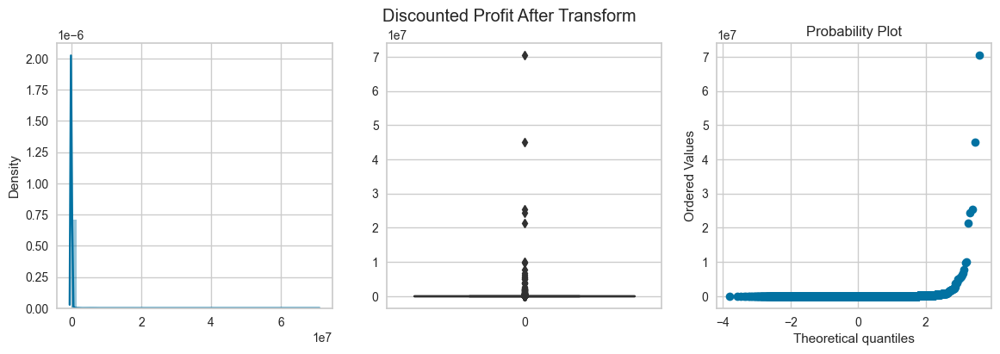

posx and posy should be finite values
posx and posy should be finite values


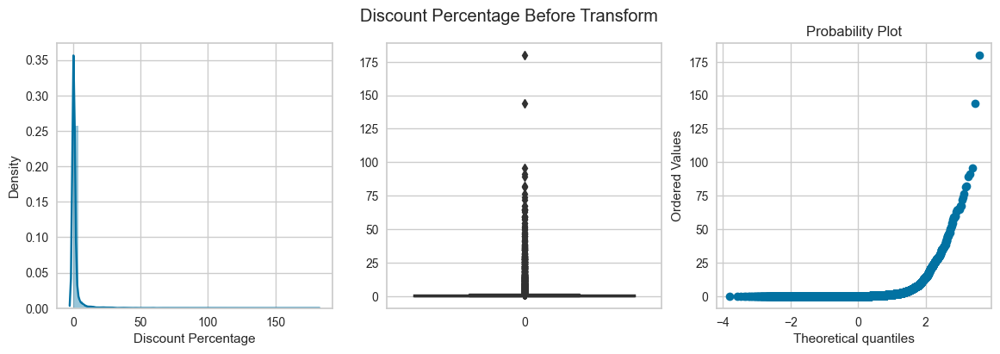

posx and posy should be finite values
posx and posy should be finite values


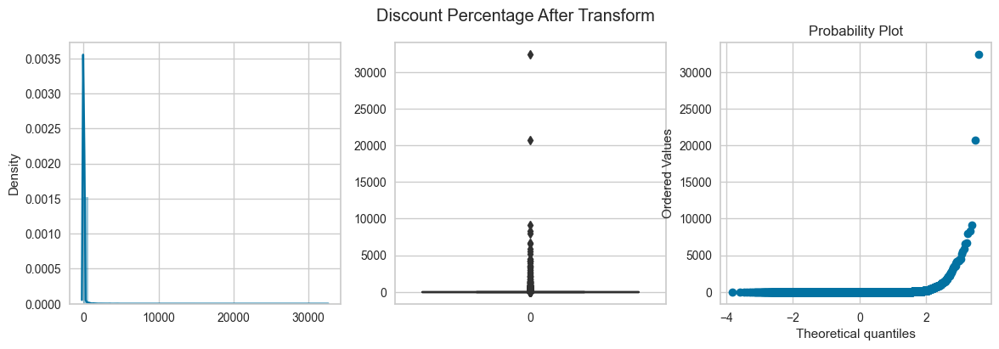

posx and posy should be finite values
posx and posy should be finite values


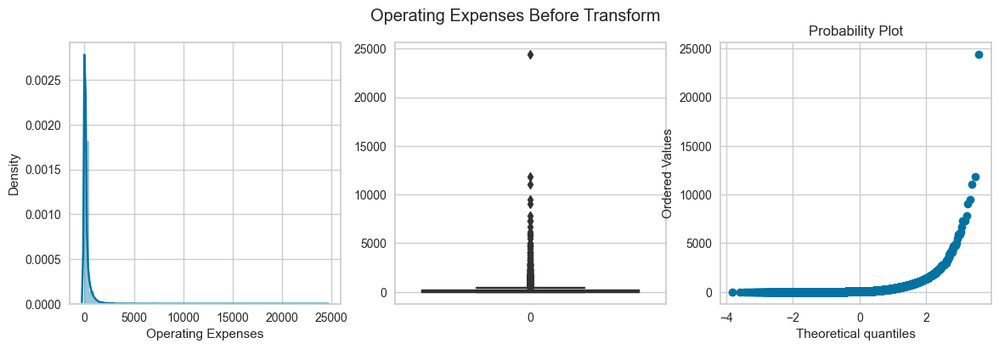

posx and posy should be finite values
posx and posy should be finite values


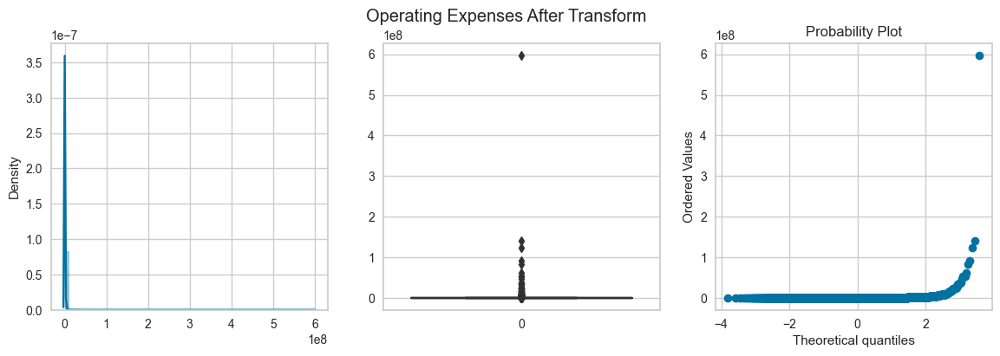

posx and posy should be finite values
posx and posy should be finite values


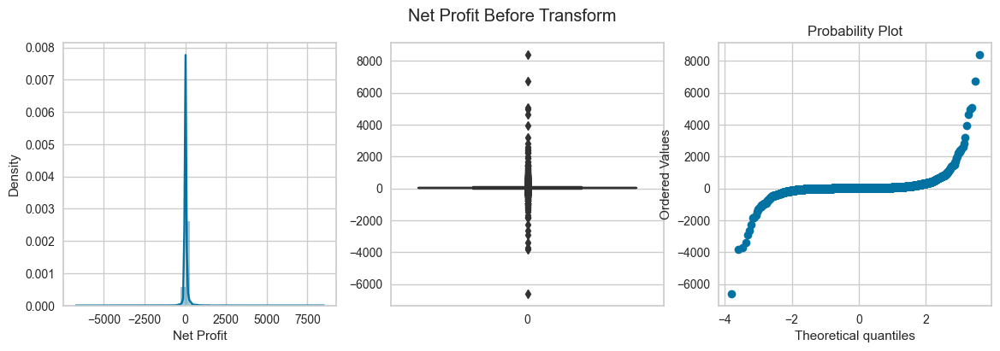

posx and posy should be finite values
posx and posy should be finite values


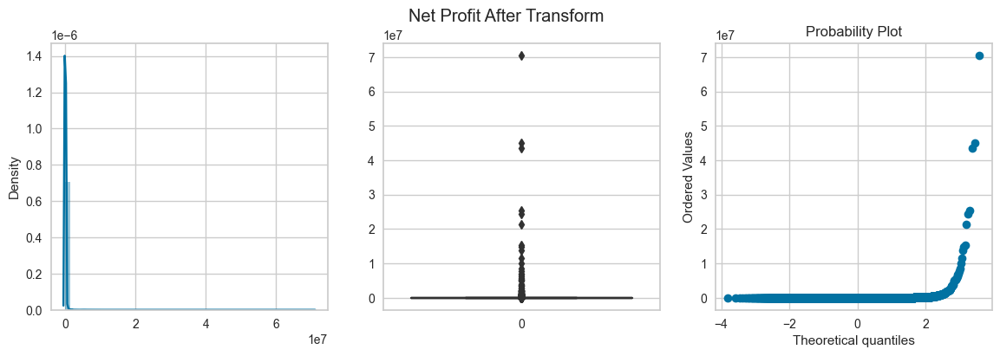

posx and posy should be finite values
posx and posy should be finite values


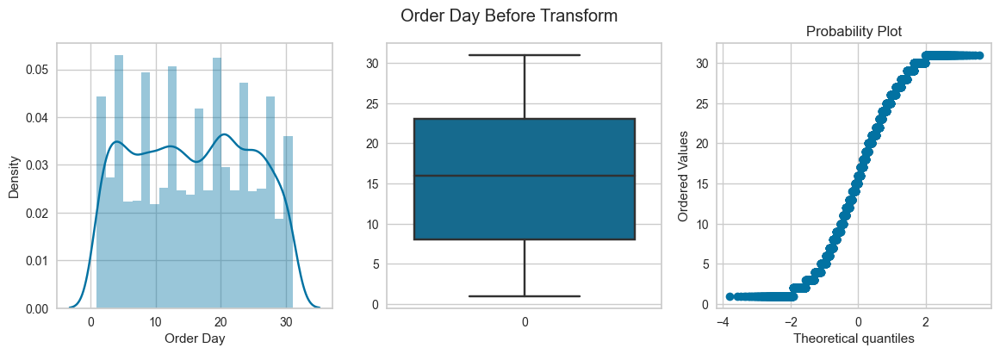

posx and posy should be finite values
posx and posy should be finite values


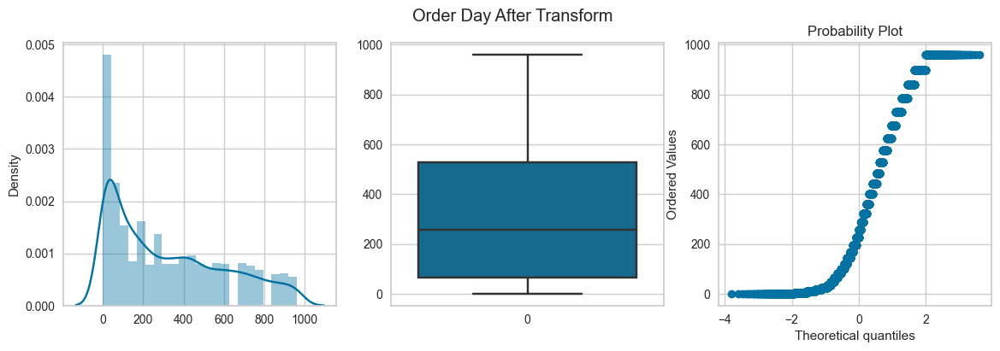

posx and posy should be finite values
posx and posy should be finite values


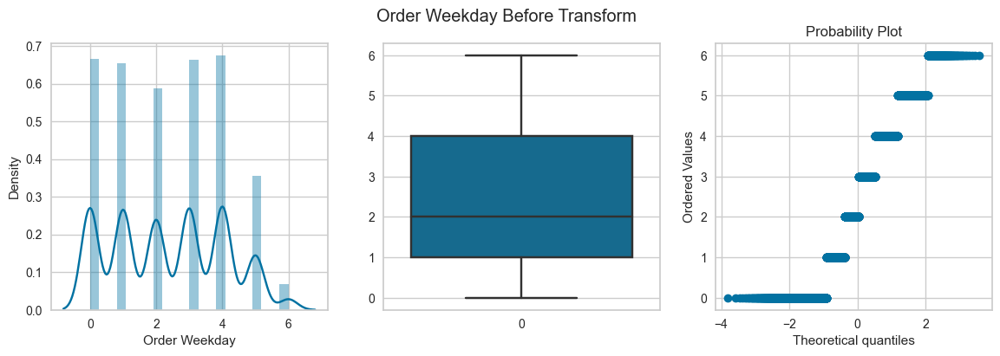

posx and posy should be finite values
posx and posy should be finite values


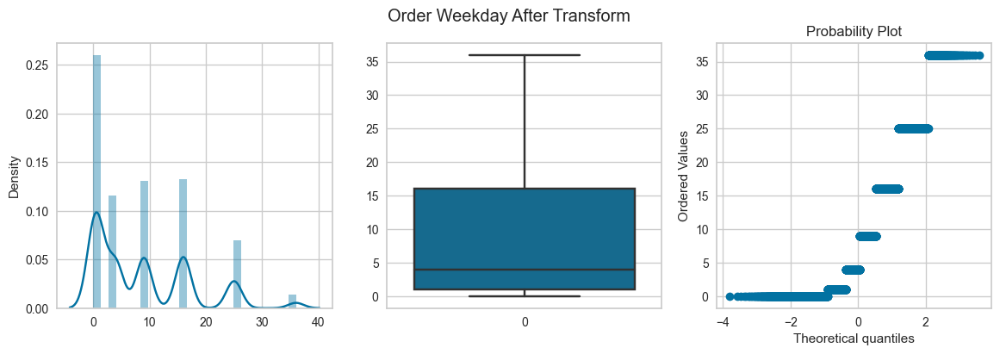

posx and posy should be finite values
posx and posy should be finite values


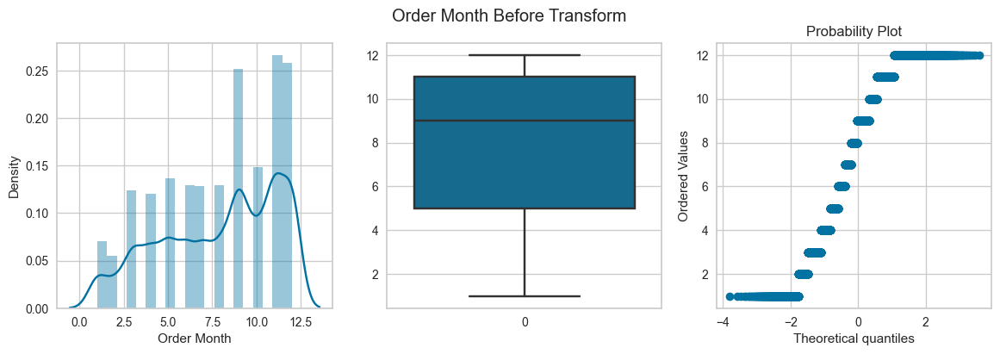

posx and posy should be finite values
posx and posy should be finite values


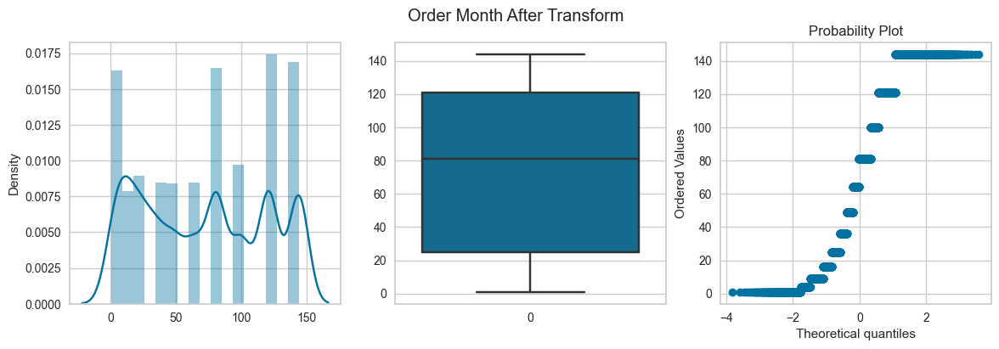

posx and posy should be finite values
posx and posy should be finite values


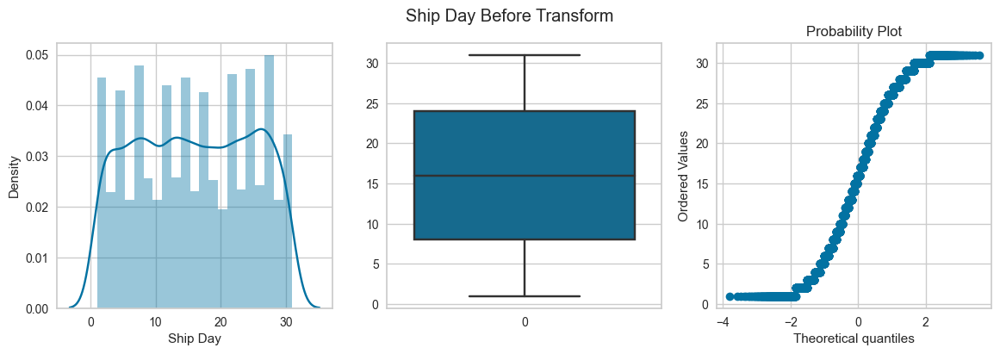

posx and posy should be finite values
posx and posy should be finite values


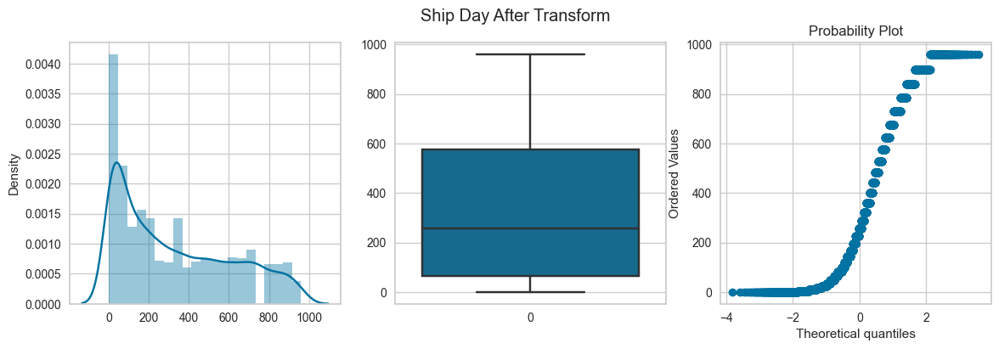

In [64]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.square))

posx and posy should be finite values
posx and posy should be finite values


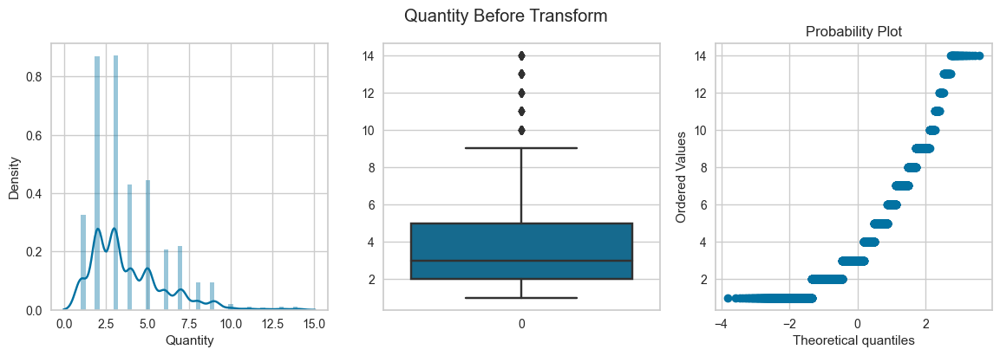

posx and posy should be finite values
posx and posy should be finite values


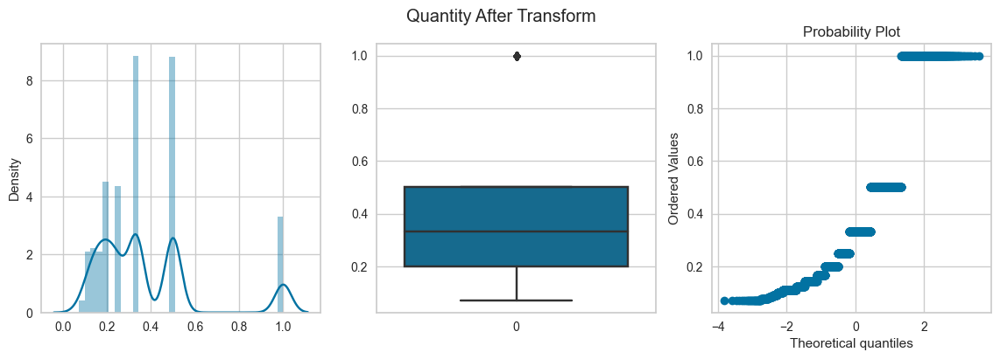

posx and posy should be finite values
posx and posy should be finite values


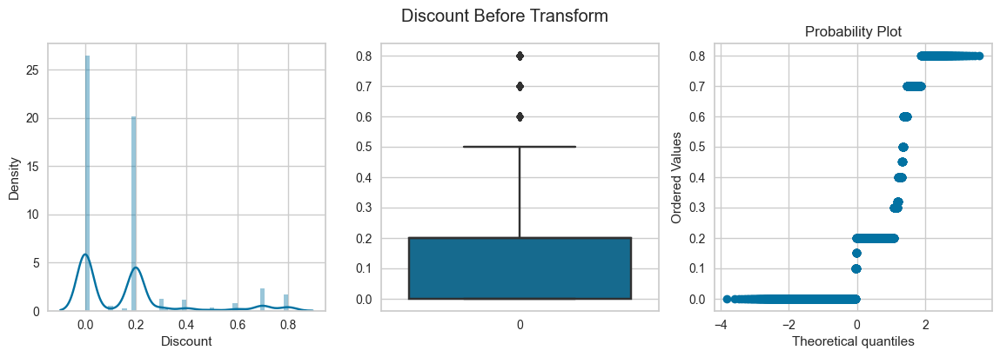

posx and posy should be finite values
posx and posy should be finite values


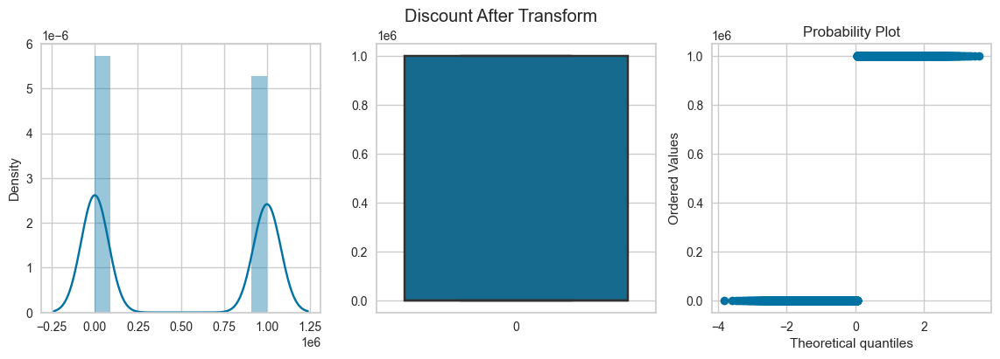

posx and posy should be finite values
posx and posy should be finite values


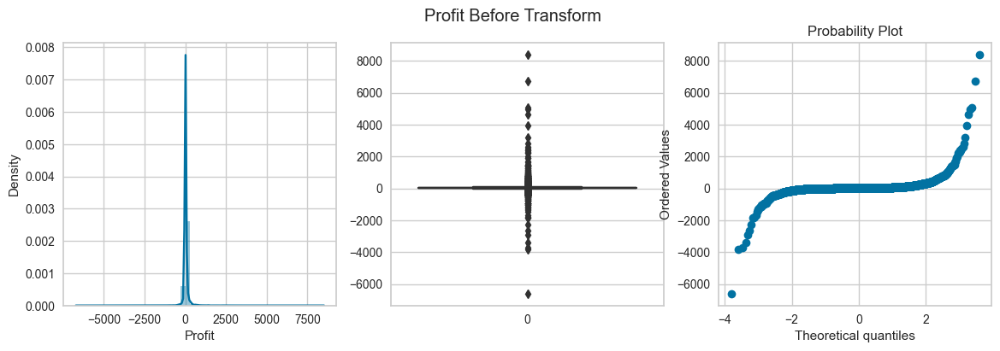

posx and posy should be finite values
posx and posy should be finite values


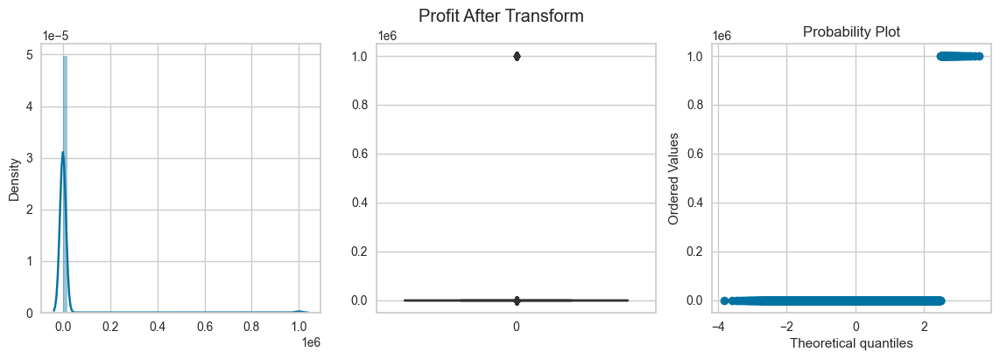

posx and posy should be finite values
posx and posy should be finite values


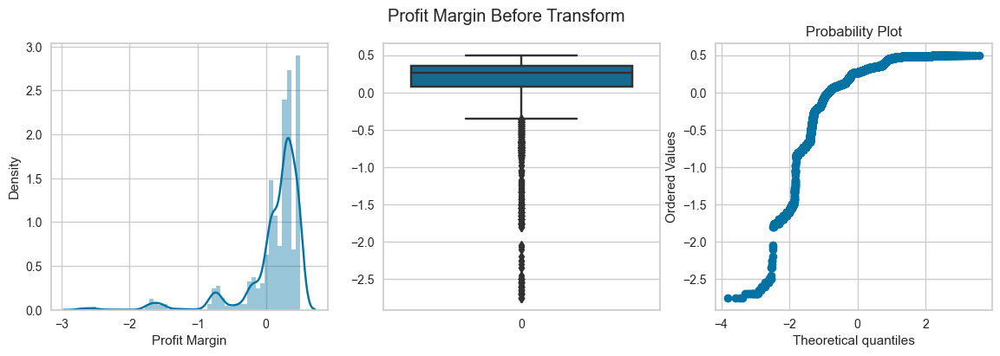

posx and posy should be finite values
posx and posy should be finite values


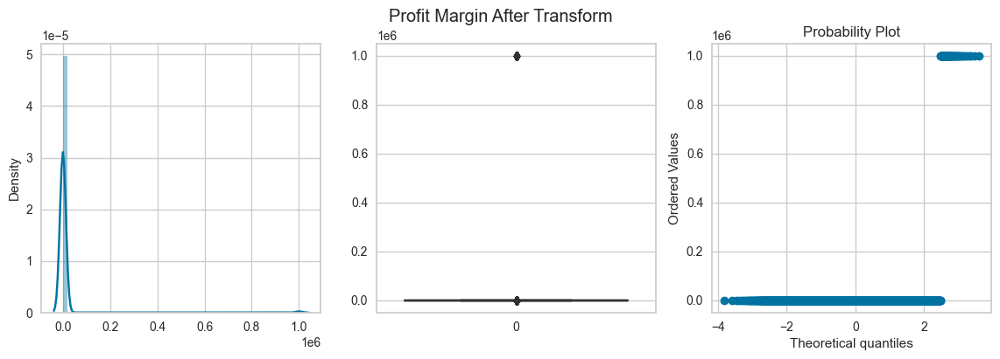

posx and posy should be finite values
posx and posy should be finite values


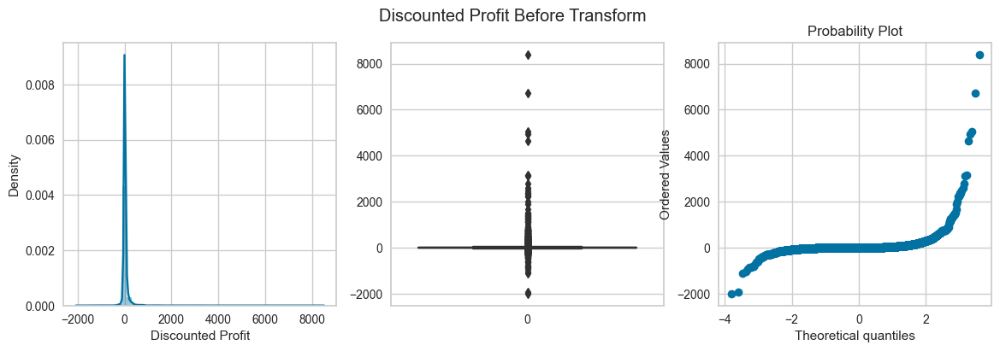

posx and posy should be finite values
posx and posy should be finite values


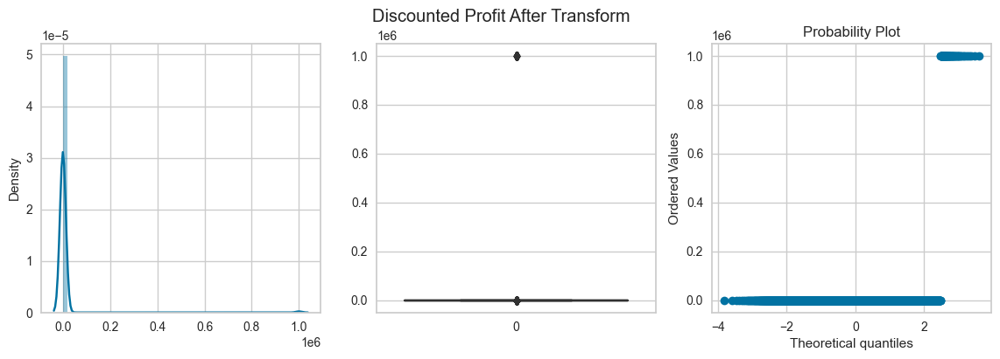

posx and posy should be finite values
posx and posy should be finite values


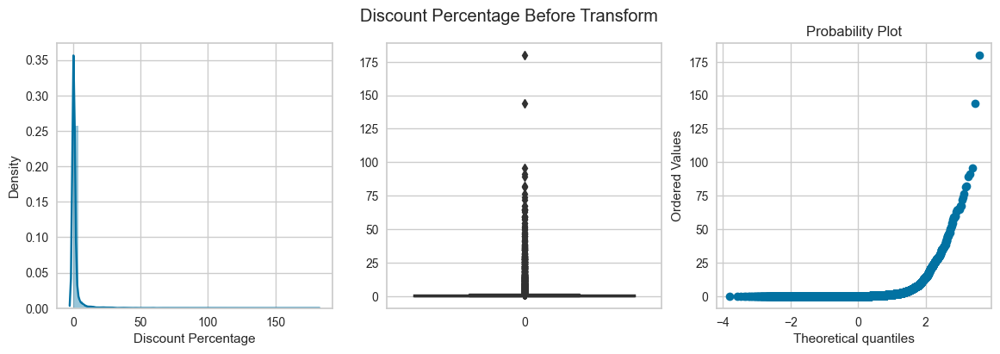

posx and posy should be finite values
posx and posy should be finite values


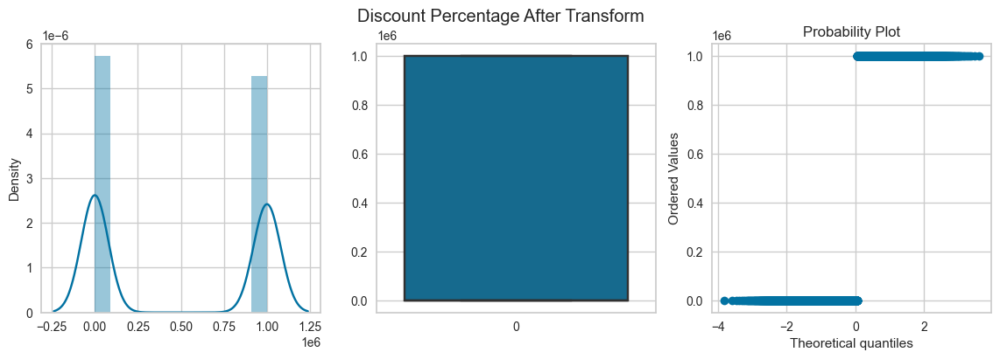

posx and posy should be finite values
posx and posy should be finite values


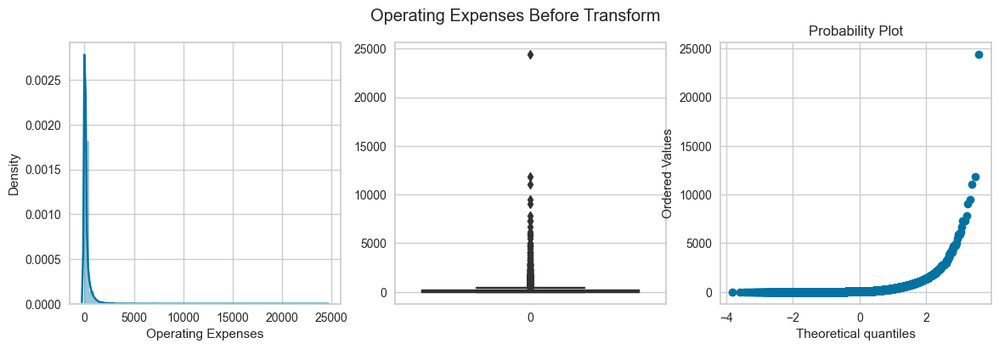

posx and posy should be finite values
posx and posy should be finite values


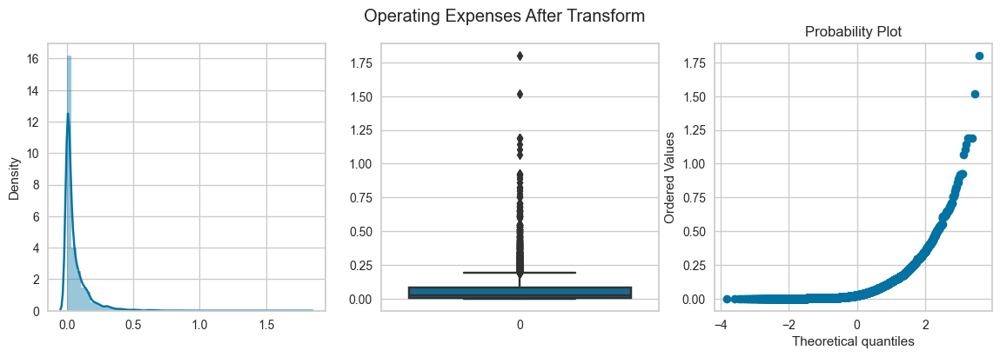

posx and posy should be finite values
posx and posy should be finite values


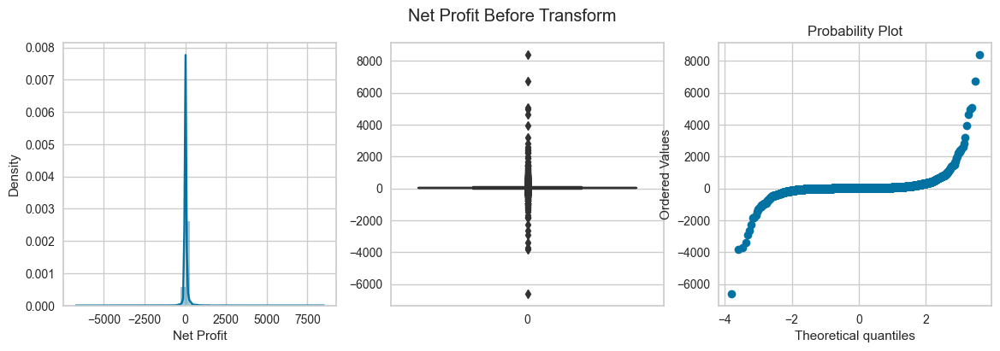

posx and posy should be finite values
posx and posy should be finite values


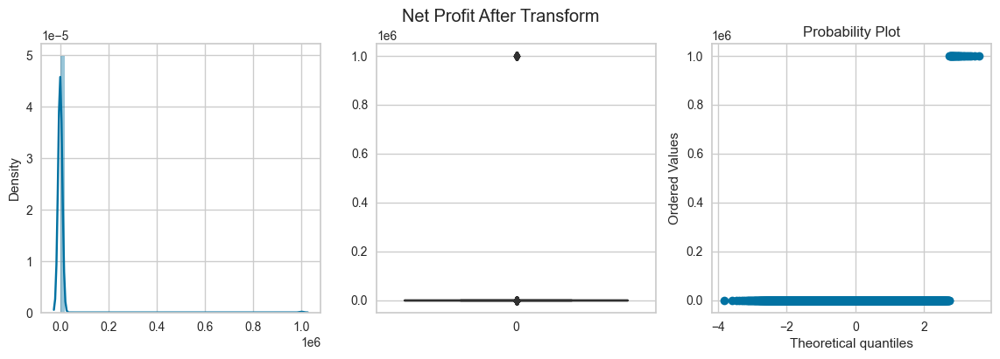

posx and posy should be finite values
posx and posy should be finite values


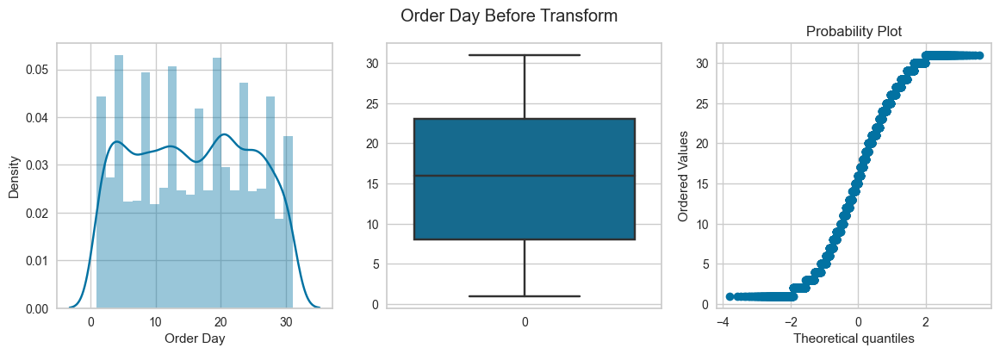

posx and posy should be finite values
posx and posy should be finite values


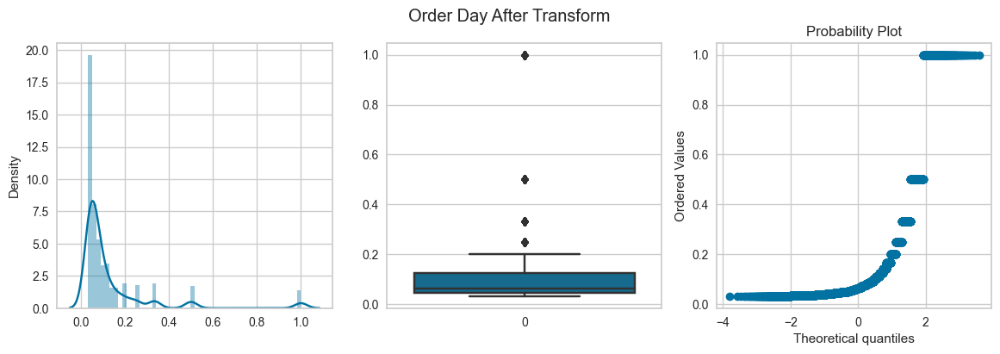

posx and posy should be finite values
posx and posy should be finite values


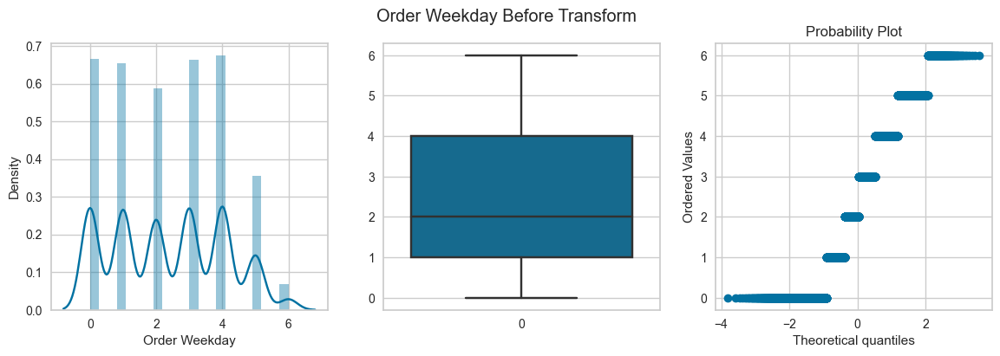

posx and posy should be finite values
posx and posy should be finite values


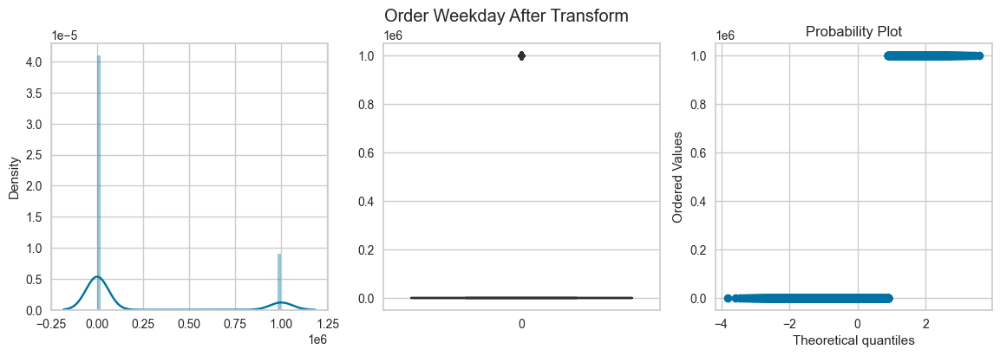

posx and posy should be finite values
posx and posy should be finite values


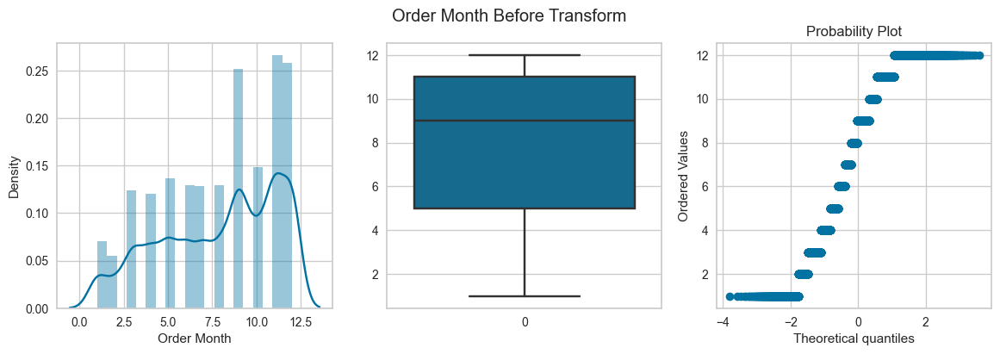

posx and posy should be finite values
posx and posy should be finite values


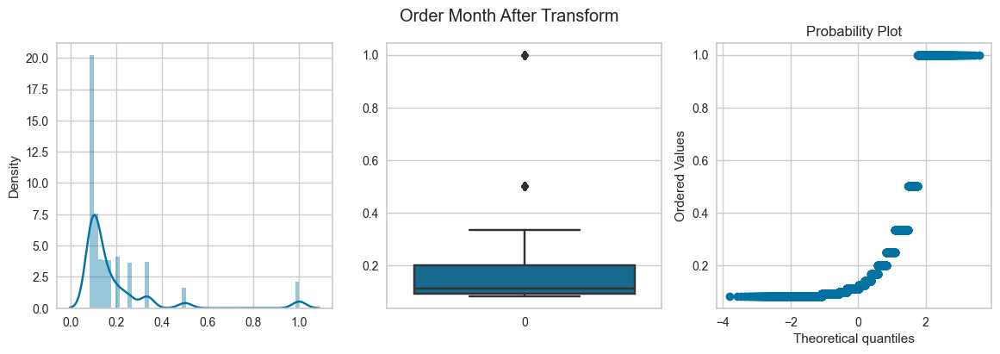

posx and posy should be finite values
posx and posy should be finite values


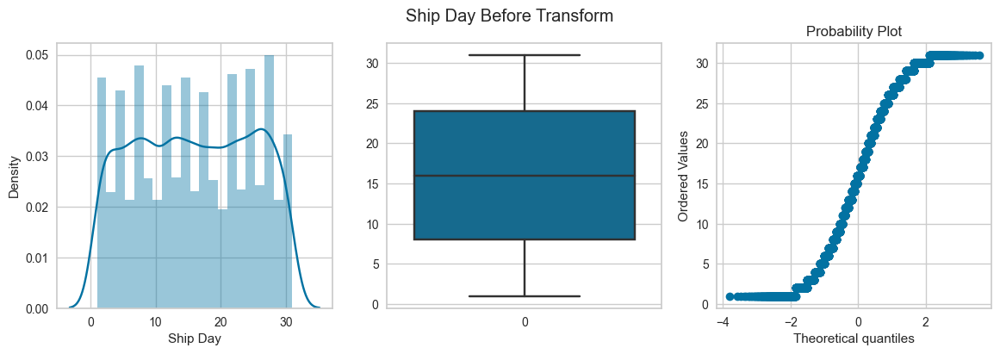

posx and posy should be finite values
posx and posy should be finite values


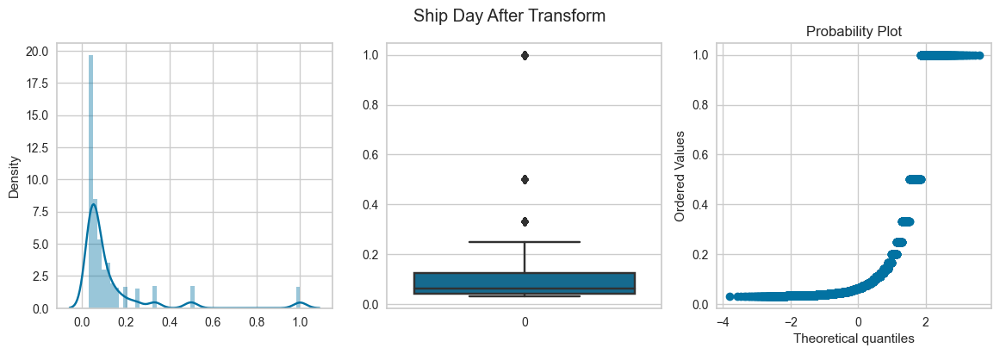

In [65]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(lambda x: 1/(x+0.000001)))

posx and posy should be finite values
posx and posy should be finite values


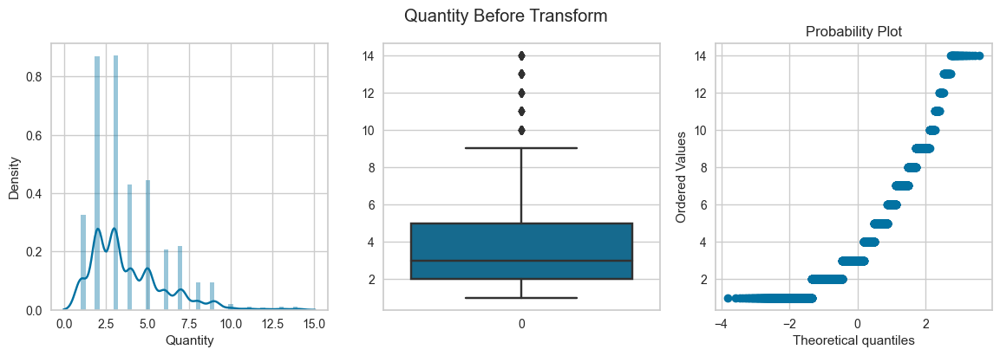

posx and posy should be finite values
posx and posy should be finite values


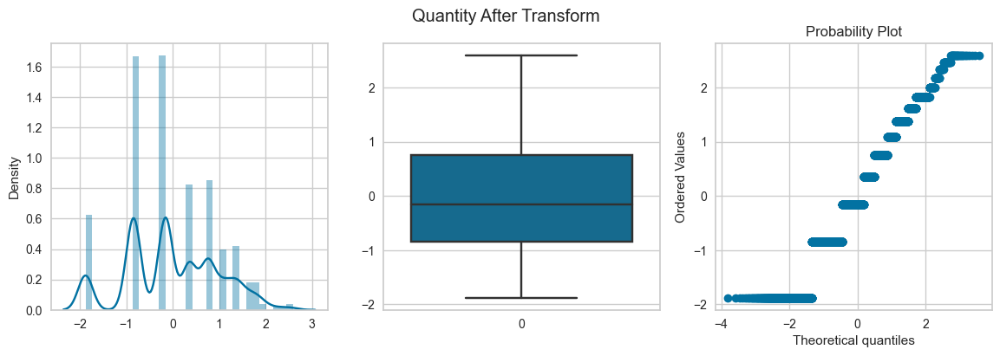

posx and posy should be finite values
posx and posy should be finite values


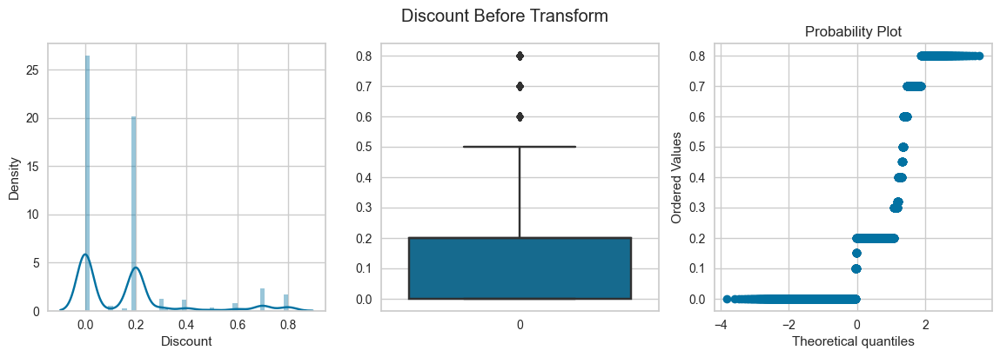

posx and posy should be finite values
posx and posy should be finite values


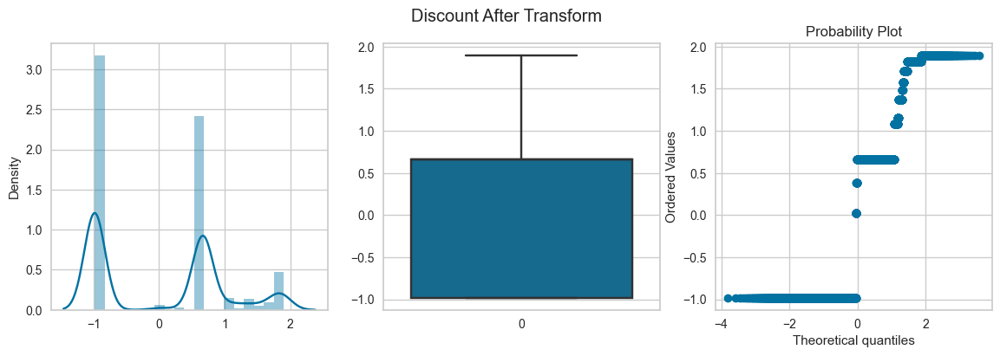

posx and posy should be finite values
posx and posy should be finite values


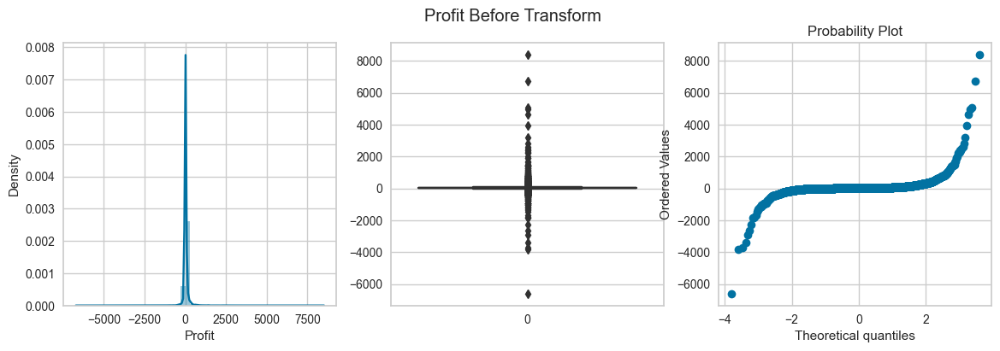

posx and posy should be finite values
posx and posy should be finite values


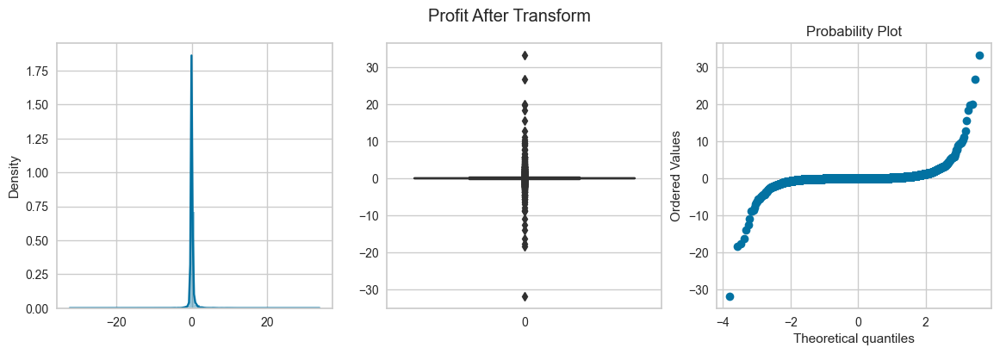

posx and posy should be finite values
posx and posy should be finite values


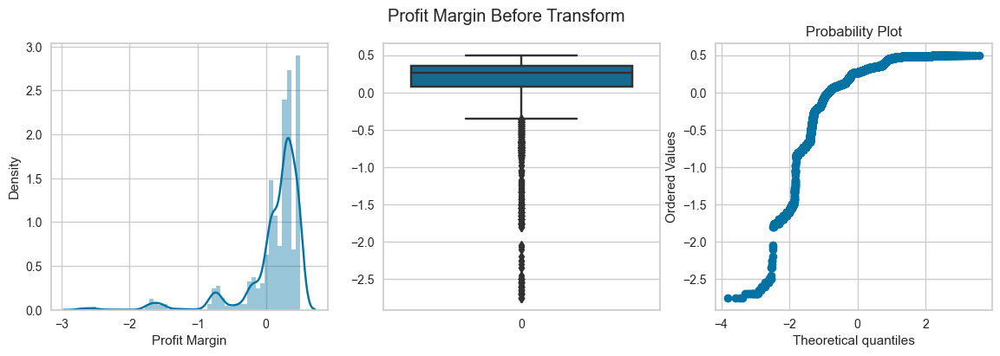

posx and posy should be finite values
posx and posy should be finite values


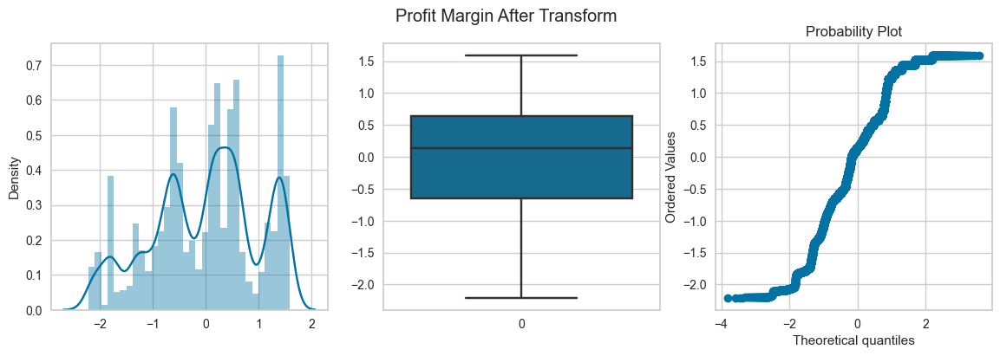

posx and posy should be finite values
posx and posy should be finite values


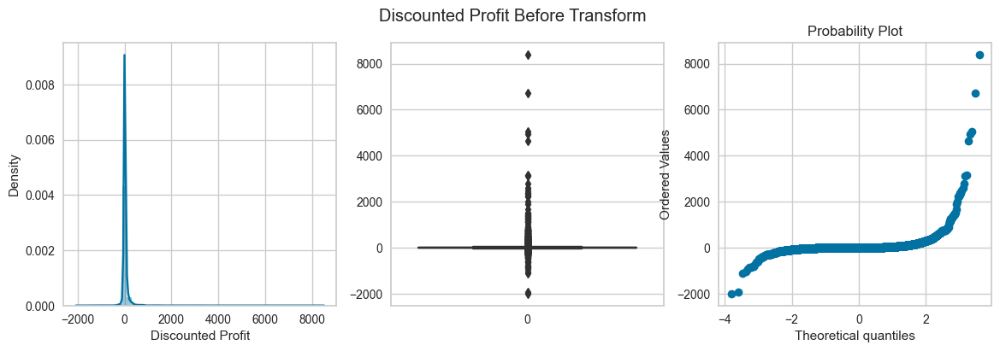

posx and posy should be finite values
posx and posy should be finite values


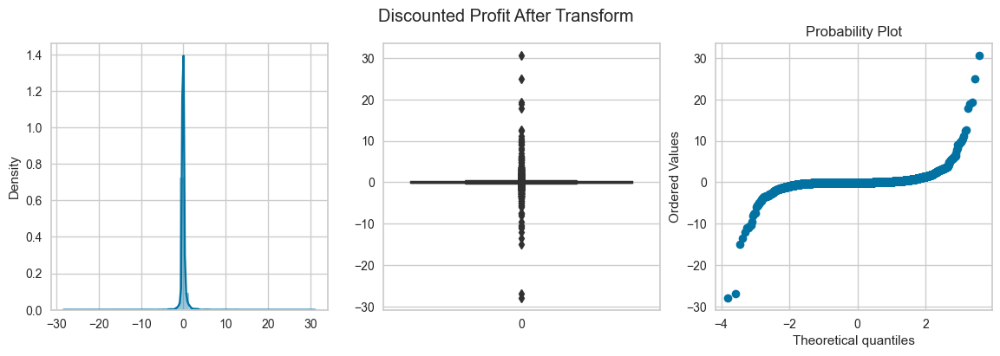

posx and posy should be finite values
posx and posy should be finite values


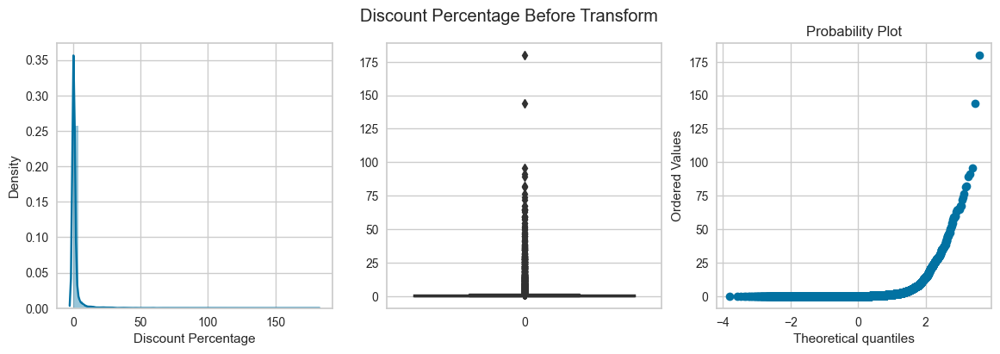

posx and posy should be finite values
posx and posy should be finite values


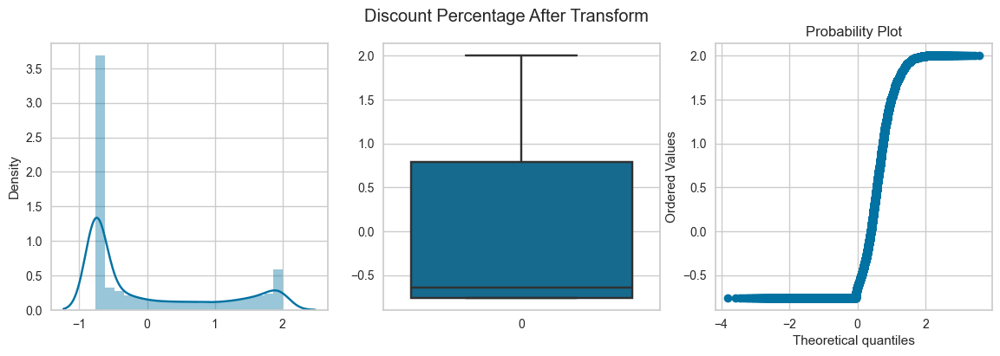

posx and posy should be finite values
posx and posy should be finite values


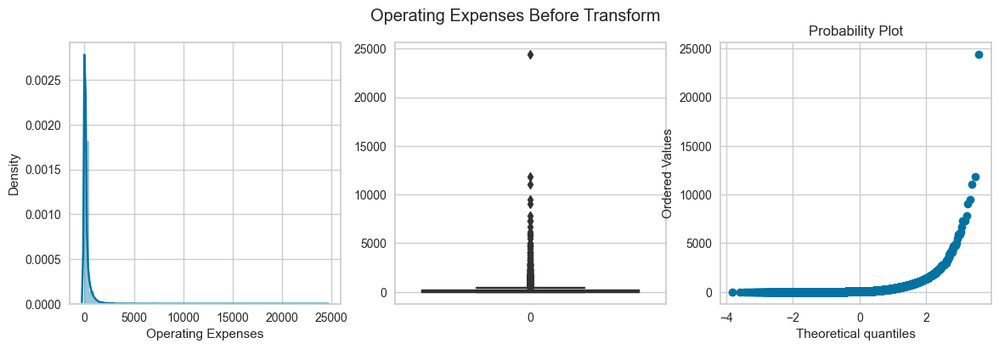

posx and posy should be finite values
posx and posy should be finite values


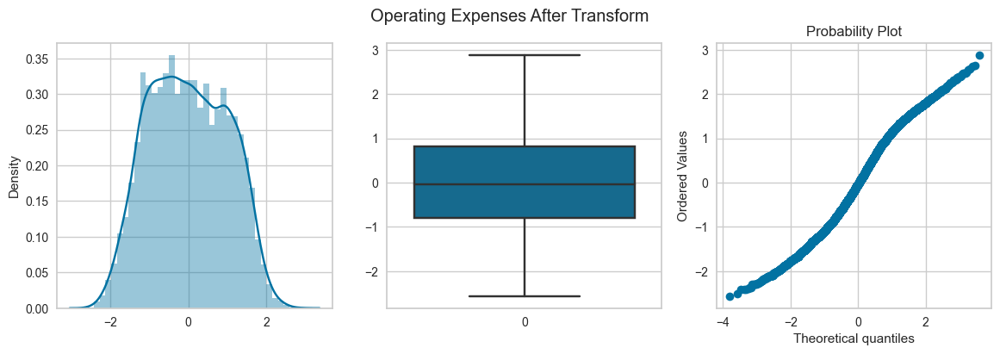

posx and posy should be finite values
posx and posy should be finite values


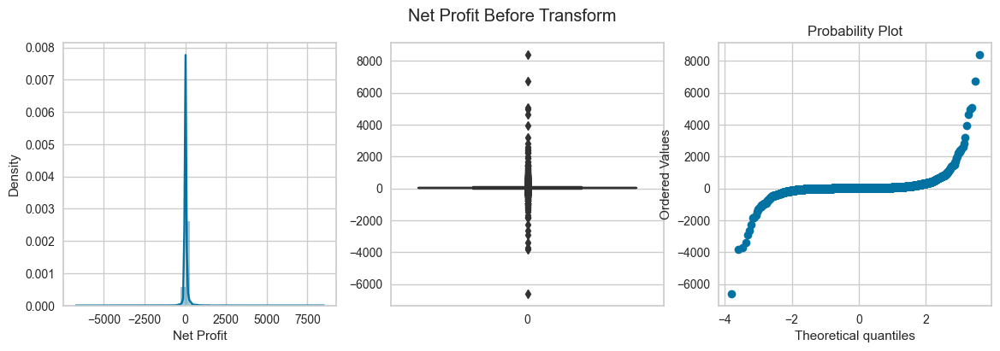

posx and posy should be finite values
posx and posy should be finite values


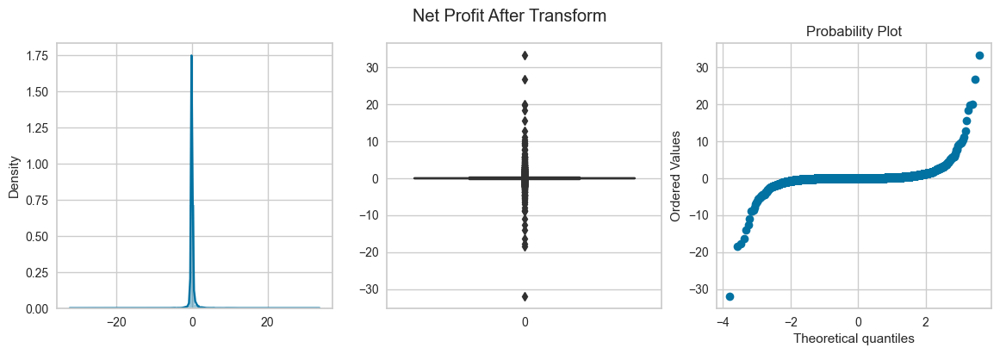

posx and posy should be finite values
posx and posy should be finite values


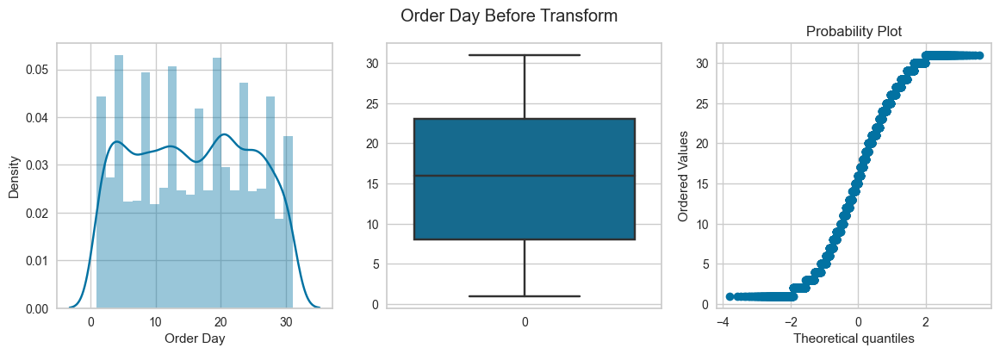

posx and posy should be finite values
posx and posy should be finite values


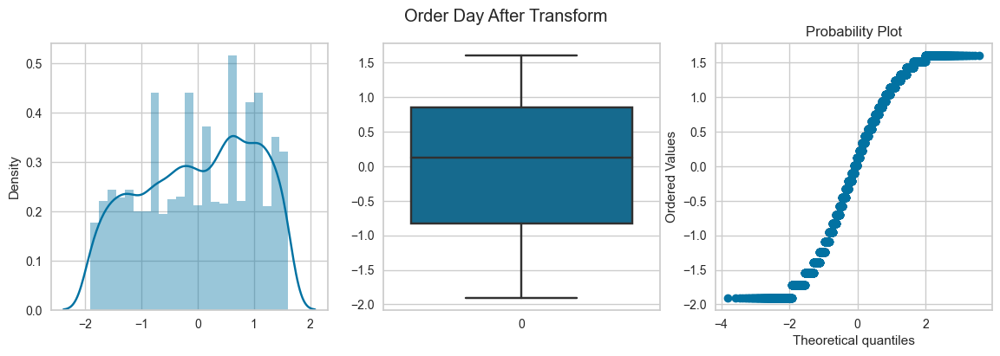

posx and posy should be finite values
posx and posy should be finite values


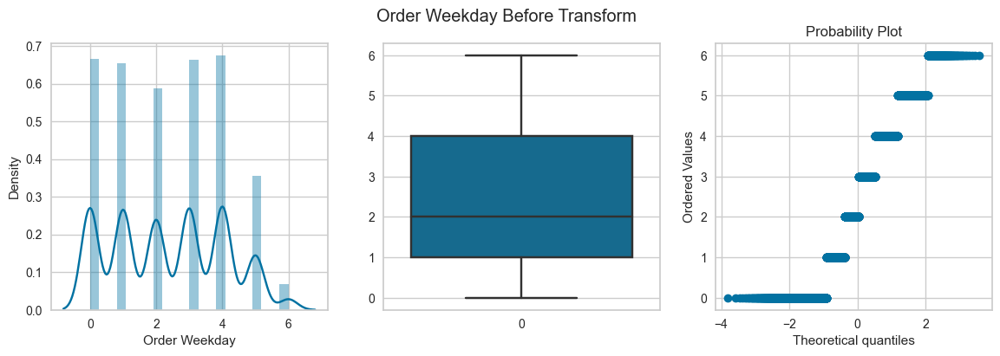

posx and posy should be finite values
posx and posy should be finite values


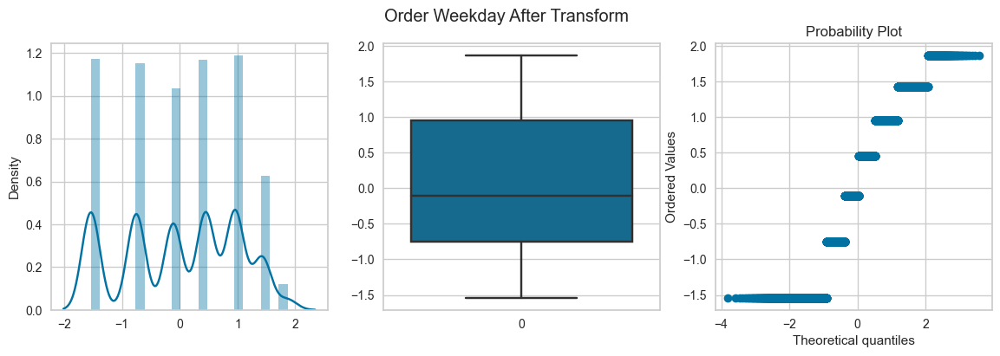

posx and posy should be finite values
posx and posy should be finite values


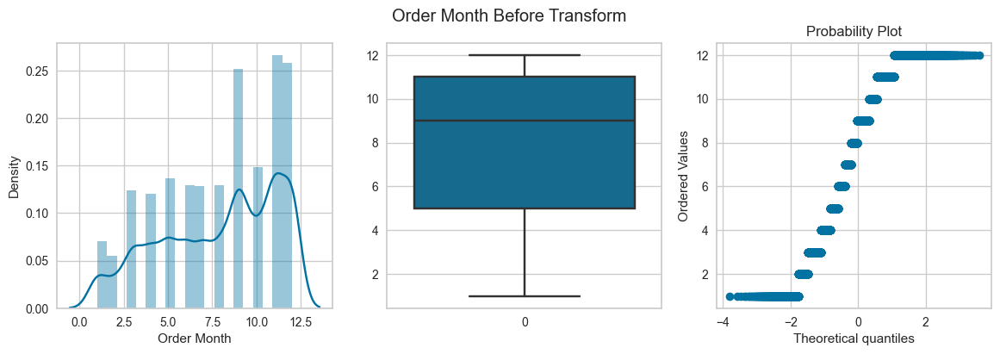

posx and posy should be finite values
posx and posy should be finite values


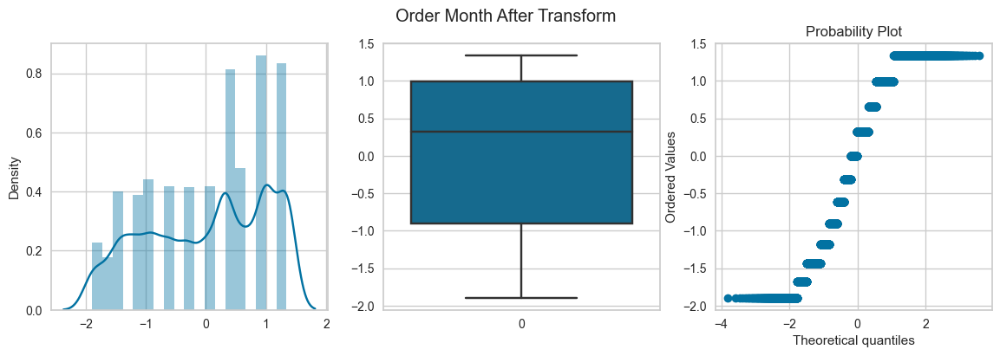

posx and posy should be finite values
posx and posy should be finite values


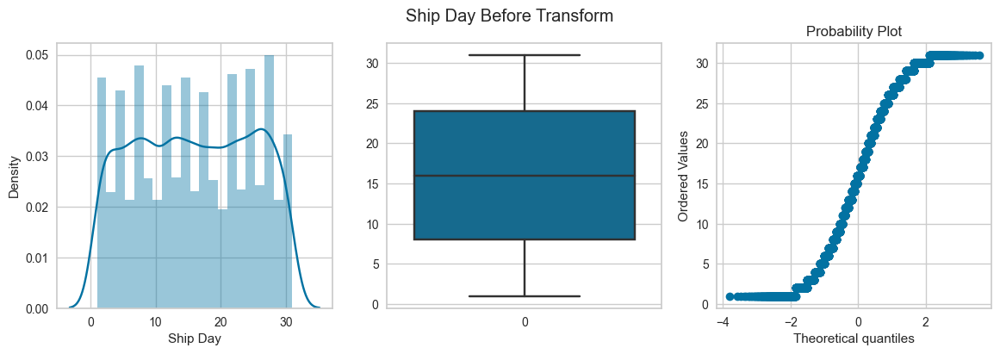

posx and posy should be finite values
posx and posy should be finite values


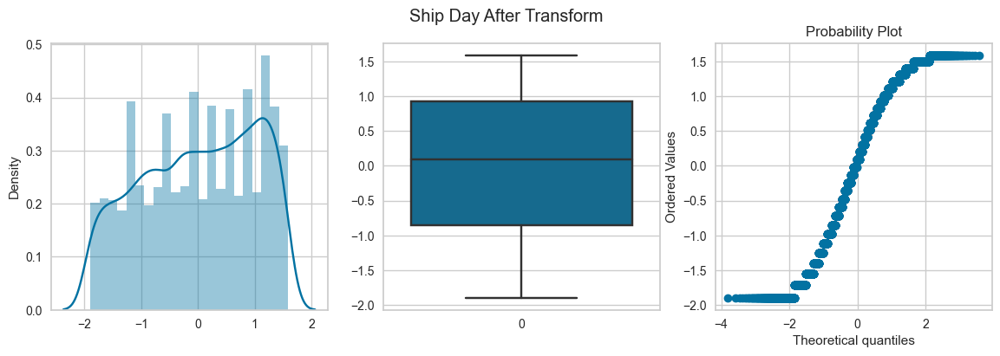

In [66]:
for col in skewed_cols:
    apply_transform(df,col,PowerTransformer())

Quantity: Log Transform <br>
Discount: Sqrt Transform <br>
Profit: Log Transform <br>
Profit Margin: Power Transform <br>
Discounted Profit: Log Transform <br>
Discount Percentage: Power Transform <br> 
Operating Expenses: Power Transform <br>
Net Profit: Log Transform 

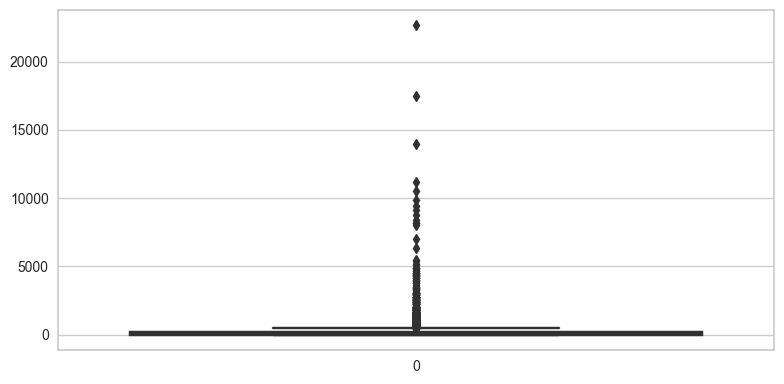

In [67]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(df['Sales'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

In [68]:
for idx in list(df[df['Sales'] > 10500].index):
    df.drop(idx,axis=0,inplace=True)

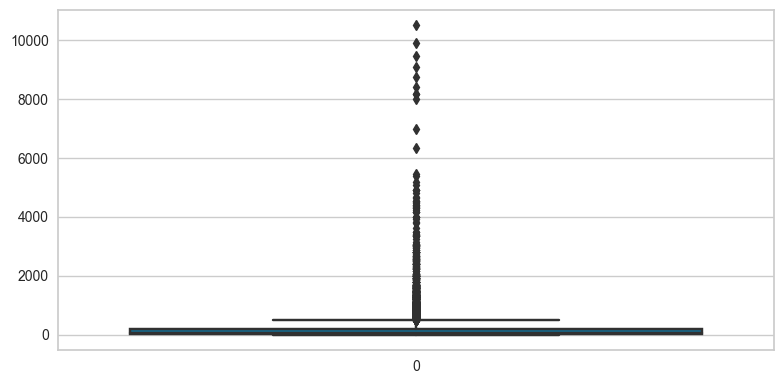

In [69]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(df['Sales'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

### Feature Splitting

In [75]:
df.isnull().sum()

Postal Code                                                               1
Sales                                                                     1
Quantity                                                                  1
Discount                                                                  1
Profit                                                                    1
                                                                         ..
Product Name_Logitech 910-002974 M325 Wireless Mouse for Web Scrolling    0
Product Name_Situations Contoured Folding Chairs, 4/Set                   0
Product Name_Staples                                                      0
Product Name_Storex Dura Pro Binders                                      0
Product Name_infrequent_sklearn                                           0
Length: 67, dtype: int64

In [76]:
df = df.dropna()
df.shape

(9988, 67)

In [77]:
X = df.drop('Sales',axis=1)
y = df['Sales']

In [78]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Feature Selection

In [79]:
X_train.shape, X_test.shape

((6991, 66), (2997, 66))

In [80]:
pipeline = Pipeline(steps=[
    ('constant',DropConstantFeatures()),
    ('duplicate',DropDuplicateFeatures()),
    ('correlated',DropCorrelatedFeatures())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [81]:
X_train.shape, X_test.shape

((6991, 55), (2997, 55))

In [82]:
kbest = SelectKBest(k=10,score_func=f_regression)
kbest.fit(X_train,y_train)

SelectKBest(score_func=<function f_regression at 0x00000193B33160E0>)

In [83]:
selected_features = kbest.get_feature_names_out()
selected_features

array(['Quantity', 'Discount', 'Profit', 'Discount Percentage',
       'Operating Expenses', 'Category_Office Supplies',
       'Category_Technology', 'Sub-Category_Chairs', 'Sub-Category_Paper',
       'Sub-Category_infrequent_sklearn'], dtype=object)

In [84]:
perc = SelectPercentile(percentile=20,score_func=f_regression)
perc.fit(X_train,y_train)

SelectPercentile(percentile=20,
                 score_func=<function f_regression at 0x00000193B33160E0>)

In [85]:
selected_features = perc.get_feature_names_out()
selected_features

array(['Quantity', 'Discount', 'Profit', 'Discount Percentage',
       'Operating Expenses', 'Category_Office Supplies',
       'Category_Technology', 'Sub-Category_Binders',
       'Sub-Category_Chairs', 'Sub-Category_Paper',
       'Sub-Category_infrequent_sklearn'], dtype=object)

In [86]:
ridge = SelectFromModel(estimator=Ridge(),max_features=10)
ridge.fit(X_train,y_train)

SelectFromModel(estimator=Ridge(), max_features=10)

In [87]:
selected_features = ridge.get_feature_names_out()
selected_features

array(['Profit', 'Operating Expenses'], dtype=object)

In [88]:
rf = SelectFromModel(estimator=RandomForestRegressor(),max_features=10)
rf.fit(X_train,y_train)

SelectFromModel(estimator=RandomForestRegressor(), max_features=10)

In [89]:
selected_features = rf.get_feature_names_out()
selected_features

array(['Profit', 'Discount Percentage', 'Operating Expenses'],
      dtype=object)

In [90]:
rfe = RFE(estimator=RandomForestRegressor(),n_features_to_select=10,step=5,verbose=1)
rfe.fit(X_train,y_train)

Fitting estimator with 55 features.
Fitting estimator with 50 features.
Fitting estimator with 45 features.
Fitting estimator with 40 features.
Fitting estimator with 35 features.
Fitting estimator with 30 features.
Fitting estimator with 25 features.
Fitting estimator with 20 features.
Fitting estimator with 15 features.


RFE(estimator=RandomForestRegressor(), n_features_to_select=10, step=5,
    verbose=1)

In [91]:
selected_features = rfe.get_feature_names_out()
selected_features

array(['Postal Code', 'Discount', 'Profit', 'Discount Percentage',
       'Operating Expenses', 'Order Year', 'Order Month', 'Order Day',
       'Order Weekday', 'Ship Weekday'], dtype=object)

In [92]:
sfs = SequentialFeatureSelector(estimator=Ridge(),n_features_to_select=10,direction='backward')
sfs.fit(X_train,y_train)

SequentialFeatureSelector(direction='backward', estimator=Ridge(),
                          n_features_to_select=10)

In [93]:
selected_features = sfs.get_feature_names_out()
selected_features

array(['Profit', 'Operating Expenses',
       'Product Name_Global High-Back Leather Tilter, Burgundy',
       "Product Name_Global Wood Trimmed Manager's Task Chair, Khaki",
       'Product Name_KI Adjustable-Height Table',
       'Product Name_Logitech 910-002974 M325 Wireless Mouse for Web Scrolling',
       'Product Name_Situations Contoured Folding Chairs, 4/Set',
       'Product Name_Staples', 'Product Name_Storex Dura Pro Binders',
       'Product Name_infrequent_sklearn'], dtype=object)

In [94]:
xgb = XGBRegressor()
xgb.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [95]:
def plot_feature_importances(feat_imp_type: str):
    feat_imps = xgb.get_booster().get_score(importance_type=feat_imp_type)
    keys = list(feat_imps.keys())[:10]
    values = list(feat_imps.values())[:10]
    feat_imps_df = pd.DataFrame(data=values, index=keys, columns=["Importance"]).sort_values(by="Importance", ascending=False).reset_index()
    feat_imps_df.rename({'index': 'Feature'},axis=1,inplace=True)
    plt.figure(figsize=(12,8))
    fig = sns.barplot(x='Importance',y='Feature',data=feat_imps_df,orient='horizontal',palette='viridis')
    plt.title(f"{feat_imp_type.title()} Feature Importance")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect();

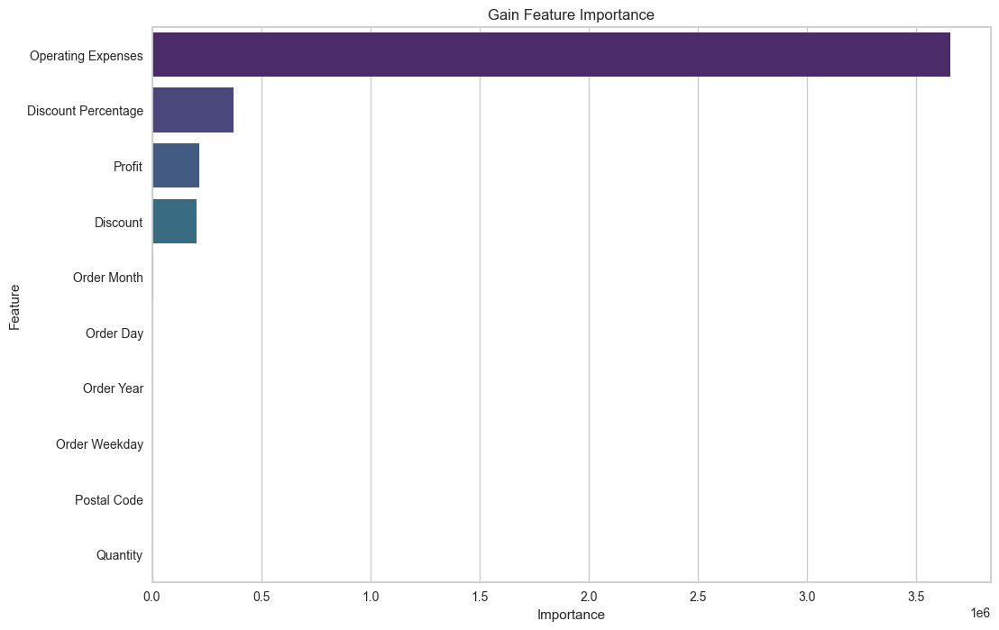

In [96]:
plot_feature_importances('gain')

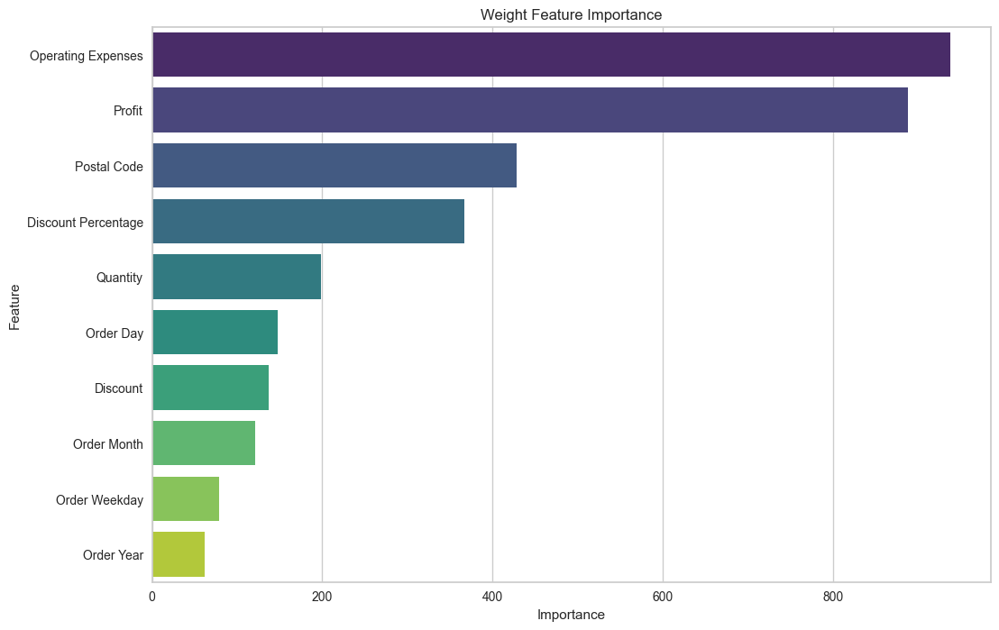

In [97]:
plot_feature_importances('weight')

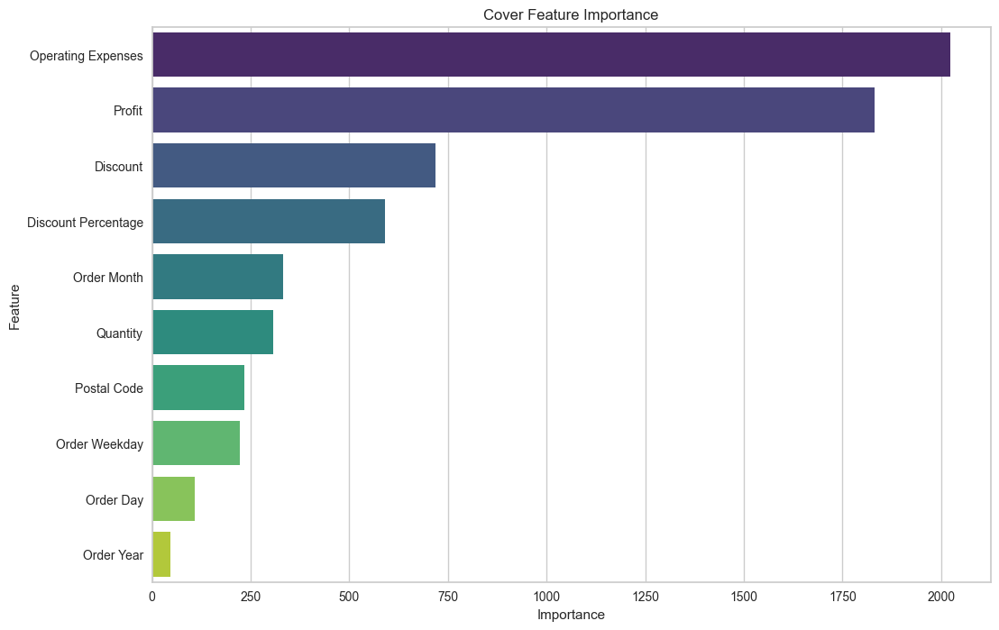

In [98]:
plot_feature_importances('cover')

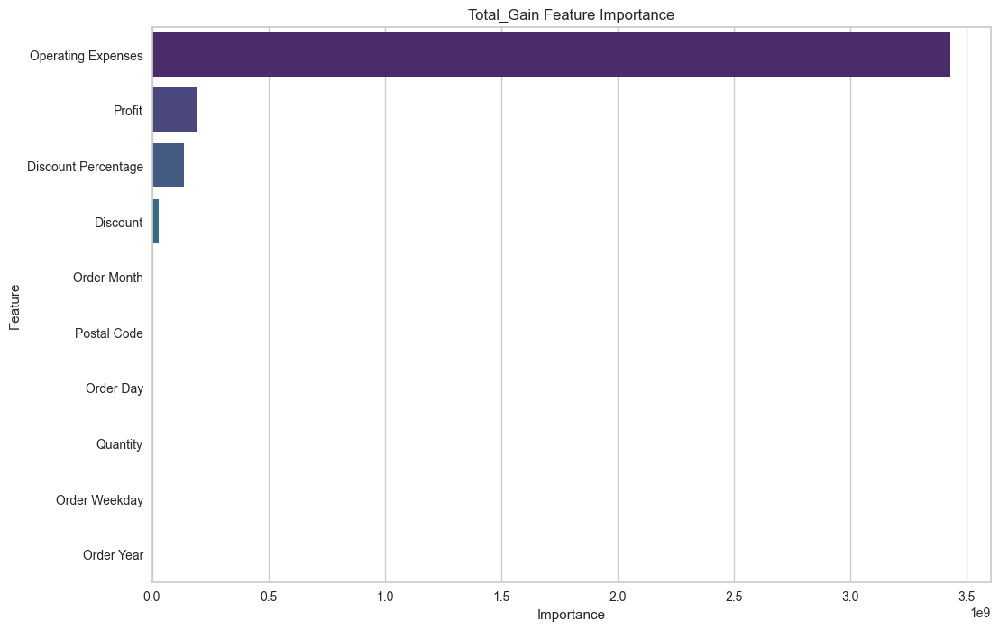

In [99]:
plot_feature_importances('total_gain')

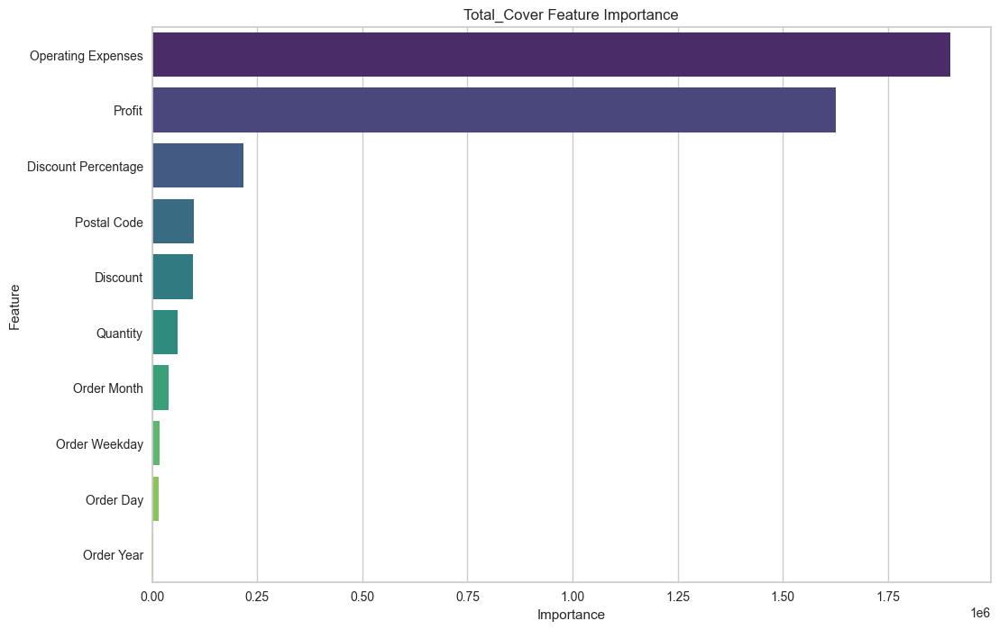

In [100]:
plot_feature_importances('total_cover')

In [101]:
final_selected_features = ['Profit',
                           'Discount Percentage',
                           'Postal Code',
                           'Discount',
                           'Order Day',
                           'Order Month',
                           'Quantity',
                           'Operating Expenses',
                           'Ship Day',
                           'Order Weekday']

final_X_train = X_train[final_selected_features]
final_X_test = X_test[final_selected_features]

In [102]:
gc.collect()

0

In [103]:
final_X_train.head()

,Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
5579,-15.2450,0.081994,90004.0,0.2,10.0,9.0,5.0,259.1650,15.0,2.0
2728,94.4937,0.063496,43615.0,0.4,23.0,12.0,7.0,535.4643,25.0,1.0
477,7.1820,0.208855,90008.0,0.2,13.0,7.0,6.0,88.5780,20.0,5.0
1329,16.3020,0.000000,94109.0,0.0,24.0,5.0,3.0,20.7480,28.0,4.0
4544,16.7040,0.134698,60610.0,0.2,12.0,7.0,2.0,131.7760,17.0,3.0


In [104]:
final_X_test.head()

,Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
1558,44.7096,0.000000,98103.0,0.0,16.0,3.0,2.0,127.2504,18.0,4.0
3059,-3.3506,0.820749,94110.0,0.2,20.0,10.0,2.0,27.7186,25.0,0.0
8234,0.4160,6.009615,32216.0,0.2,2.0,5.0,2.0,2.9120,7.0,4.0
5357,1.6360,0.000000,94122.0,0.0,5.0,8.0,1.0,14.7240,11.0,4.0
35,123.4737,0.018223,75080.0,0.2,9.0,12.0,7.0,974.0703,11.0,0.0


In [105]:
transformer = ColumnTransformer(transformers=[
    ('log_transform',FunctionTransformer(np.log1p),['Quantity','Profit']),
    ('sqrt_transform',FunctionTransformer(np.sqrt),['Discount']),
    ('power_transform',PowerTransformer(),['Discount Percentage','Operating Expenses'])
],remainder='passthrough')
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('log_transform',
                                 FunctionTransformer(func=<ufunc 'log1p'>),
                                 ['Quantity', 'Profit']),
                                ('sqrt_transform',
                                 FunctionTransformer(func=<ufunc 'sqrt'>),
                                 ['Discount']),
                                ('power_transform', PowerTransformer(),
                                 ['Discount Percentage',
                                  'Operating Expenses'])])

In [106]:
final_X_train = transformer.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=final_selected_features)
final_X_test = transformer.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=final_selected_features)
final_X_train.head()

,Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,1.791759,NaN,0.447214,-0.324229,1.009995,90004.0,10.0,9.0,15.0,2.0
1,2.079442,4.559060,0.632456,-0.412458,1.378259,43615.0,23.0,12.0,25.0,1.0
2,1.945910,2.101937,0.447214,0.171010,0.414783,90008.0,13.0,7.0,20.0,5.0
3,1.386294,2.850822,0.000000,-0.755604,-0.483757,94109.0,24.0,5.0,28.0,4.0
4,1.098612,2.873791,0.447214,-0.097214,0.642144,60610.0,12.0,7.0,17.0,3.0


In [107]:
final_X_test.head()

,Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,1.098612,3.822308,0.000000,-0.755604,0.622479,98103.0,16.0,3.0,18.0,4.0
1,1.098612,NaN,0.447214,1.246647,-0.296776,94110.0,20.0,10.0,25.0,0.0
2,1.098612,0.347836,0.447214,1.963591,-1.764067,32216.0,2.0,5.0,7.0,4.0
3,0.693147,0.969263,0.000000,-0.755604,-0.708771,94122.0,5.0,8.0,11.0,4.0
4,2.079442,4.824094,0.447214,-0.650184,1.662262,75080.0,9.0,12.0,11.0,0.0


### Missing Value Imputation

In [108]:
final_X_train.isna().sum()

Profit                    0
Discount Percentage    1283
Postal Code               0
Discount                  0
Order Day                 0
Order Month               0
Quantity                  0
Operating Expenses        0
Ship Day                  0
Order Weekday             0
dtype: int64

In [109]:
final_X_test.isnull().sum()

Profit                   0
Discount Percentage    551
Postal Code              0
Discount                 0
Order Day                0
Order Month              0
Quantity                 0
Operating Expenses       0
Ship Day                 0
Order Weekday            0
dtype: int64

In [110]:
imputer = SimpleImputer(strategy='median')
final_X_train['Discount Percentage'] = imputer.fit_transform(final_X_train[['Discount Percentage']])
final_X_test['Discount Percentage'] = imputer.fit_transform(final_X_test[['Discount Percentage']])

In [111]:
for col in final_X_train.columns:
    imputer = SimpleImputer(strategy='median')
    final_X_train[col] = imputer.fit_transform(final_X_train[[col]])

In [112]:
final_X_train.isna().sum()

Profit                 0
Discount Percentage    0
Postal Code            0
Discount               0
Order Day              0
Order Month            0
Quantity               0
Operating Expenses     0
Ship Day               0
Order Weekday          0
dtype: int64

In [113]:
final_X_test.isnull().sum()

Profit                 0
Discount Percentage    0
Postal Code            0
Discount               0
Order Day              0
Order Month            0
Quantity               0
Operating Expenses     0
Ship Day               0
Order Weekday          0
dtype: int64

### Outlier Treatment

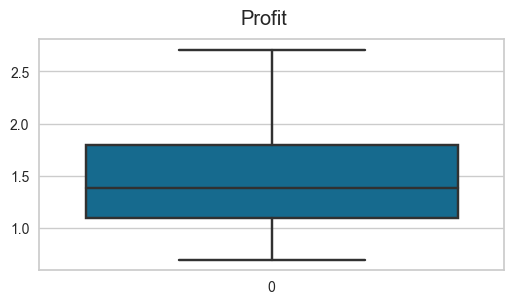

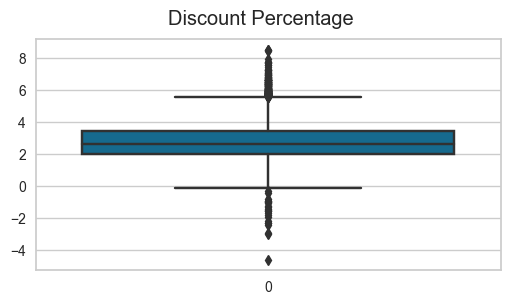

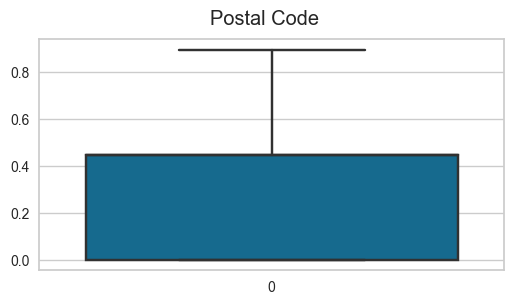

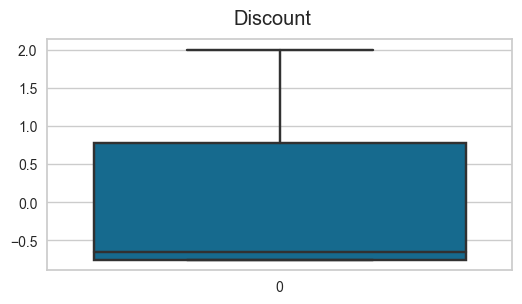

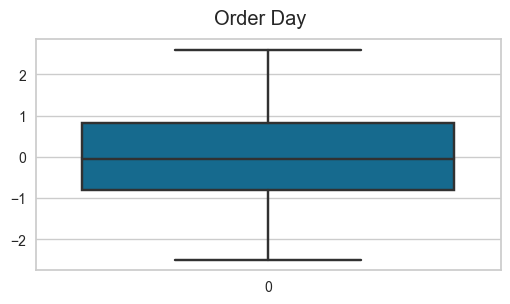

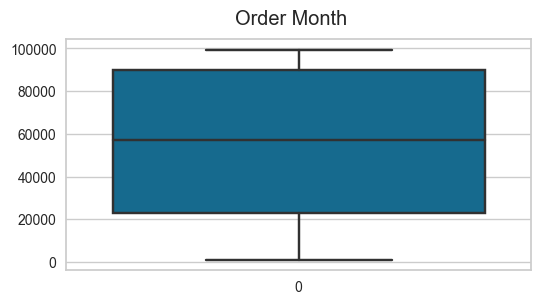

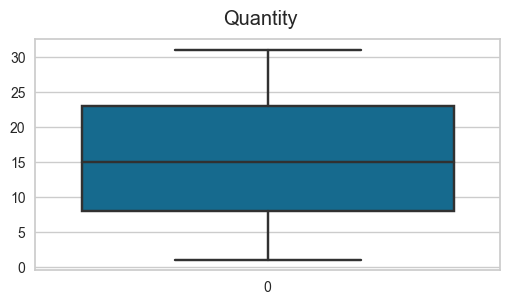

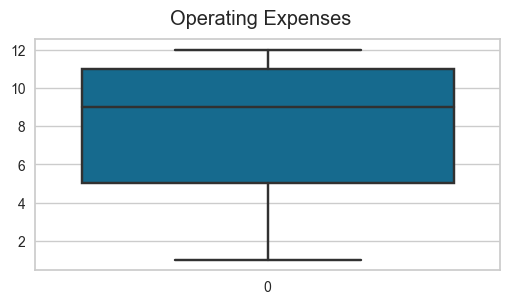

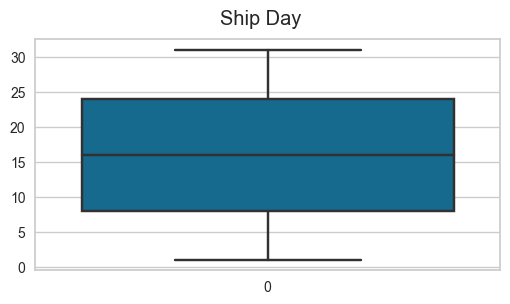

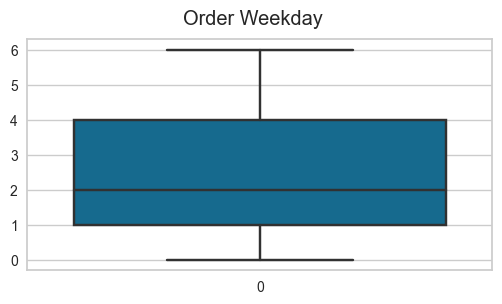

In [114]:
for col in final_X_train.columns:
    plt.figure(figsize=(6,3))
    sns.boxplot(final_X_train[col])
    plt.suptitle(col)
    plt.show()

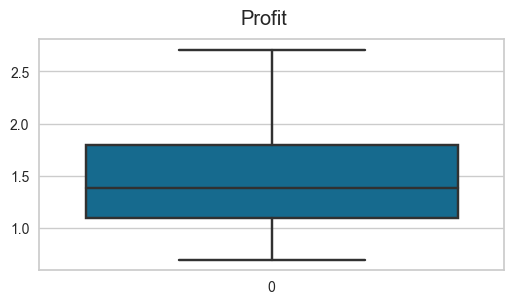

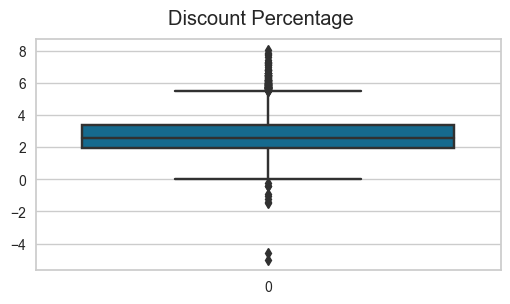

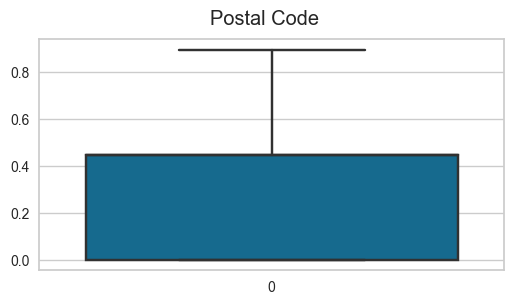

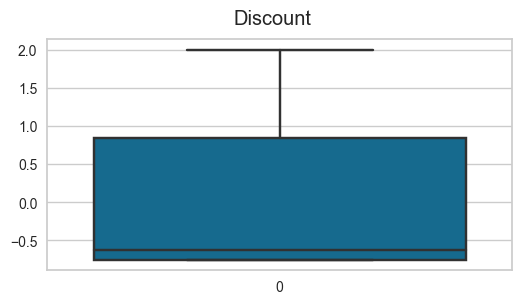

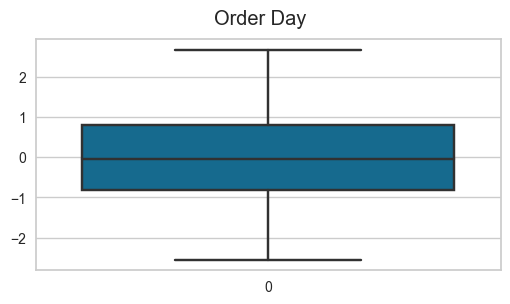

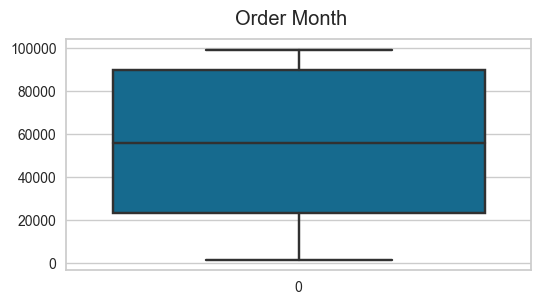

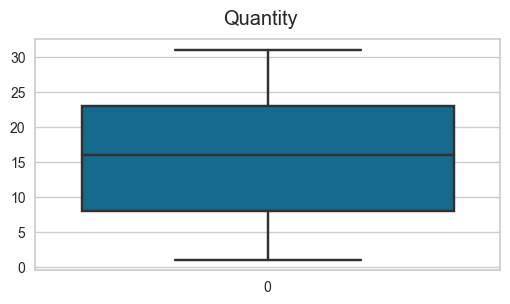

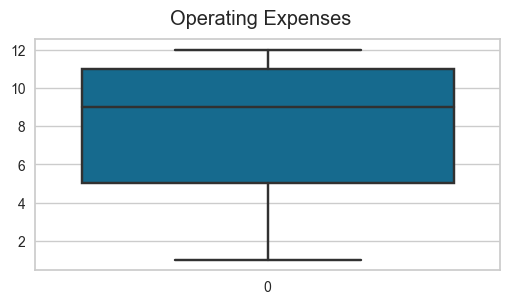

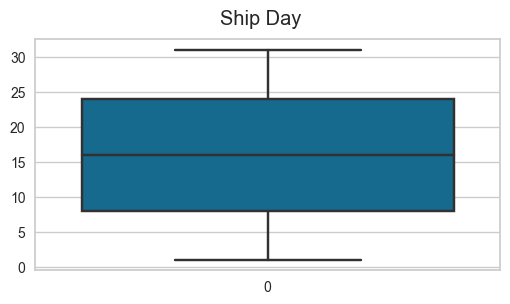

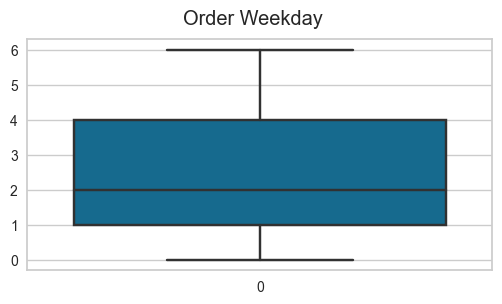

In [115]:
for col in final_X_test.columns:
    plt.figure(figsize=(6,3))
    sns.boxplot(final_X_test[col])
    plt.suptitle(col)
    plt.show()

In [116]:
def impute_outliers(data,col):
    winsorizer = Winsorizer(capping_method='iqr',fold=1.5,tail='both')
    fig = sns.boxplot(winsorizer.fit_transform(data[[col]]).values)
    plt.title(f"Box Plot of {col} after Outlier Removal")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect()

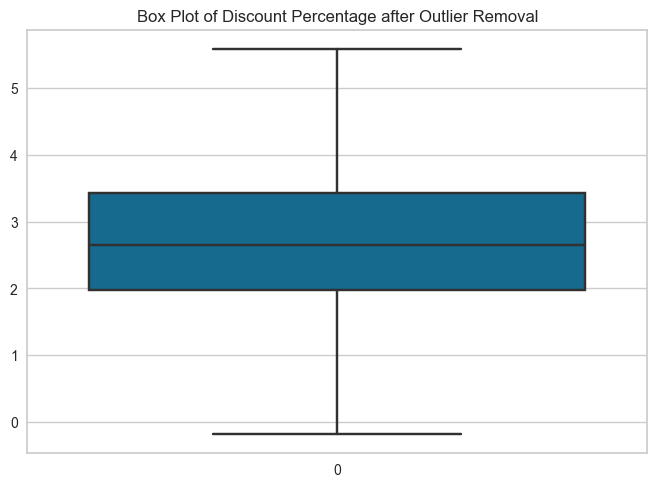

In [117]:
impute_outliers(final_X_train,'Discount Percentage')

In [118]:
winsorizer = Winsorizer(capping_method='iqr',fold=1.5,tail='both')
final_X_train['Discount Percentage'] = winsorizer.fit_transform(final_X_train[['Discount Percentage']])
final_X_test['Discount Percentage'] = winsorizer.transform(final_X_test[['Discount Percentage']])

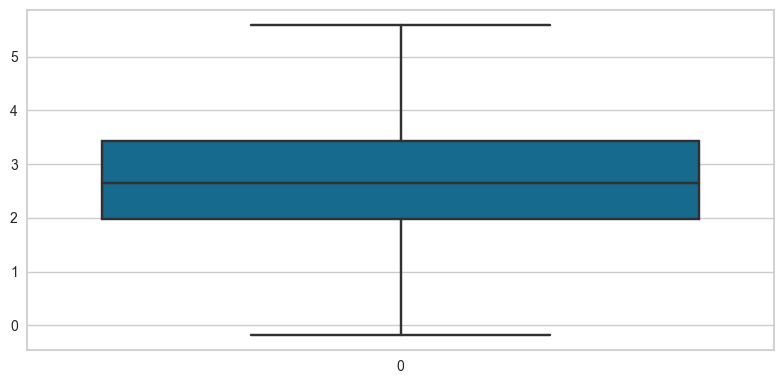

In [119]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(final_X_train['Discount Percentage'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

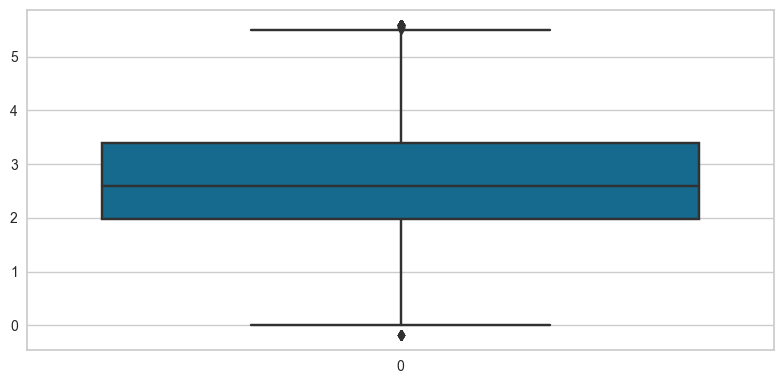

In [120]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(final_X_test['Discount Percentage'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

### Feature Scaling

In [121]:
scaler = StandardScaler()
features = final_X_train.columns
final_X_train = scaler.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=features)
final_X_test = scaler.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=features)
final_X_train.head()

,Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,0.738777,-0.085201,0.620435,-0.324229,1.009995,1.083957,-0.650256,0.361982,-0.093987,-0.231513
1,1.398690,1.488356,1.271876,-0.412458,1.378259,-0.361693,0.840780,1.277878,1.043587,-0.823287
2,1.092383,-0.540392,0.620435,0.171010,0.414783,1.084082,-0.306171,-0.248614,0.474800,1.543812
3,-0.191318,0.077933,-0.952285,-0.755604,-0.483757,1.211884,0.955475,-0.859211,1.384859,0.952037
4,-0.851232,0.096897,0.620435,-0.097214,0.642144,0.167933,-0.420866,-0.248614,0.133528,0.360262


In [122]:
final_X_test.head()

,Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,-0.851232,0.880050,-0.952285,-0.755604,0.622479,1.336351,0.037914,-1.469808,0.247285,0.952037
1,-0.851232,-0.130519,0.620435,1.246647,-0.296776,1.211915,0.496695,0.667281,1.043587,-1.415062
2,-0.851232,-1.988682,0.620435,1.963591,-1.764067,-0.716927,-1.567816,-0.859211,-1.004046,0.952037
3,-1.781327,-1.475595,-0.952285,-0.755604,-0.708771,1.212289,-1.223731,0.056684,-0.549016,0.952037
4,1.398690,1.707184,0.620435,-0.650184,1.662262,0.618871,-0.764951,1.277878,-0.549016,-1.415062


In [123]:
imputer = SimpleImputer(strategy='mean')
y_train = imputer.fit_transform(y_train.values.reshape(-1,1))
y_test = imputer.transform(y_test.values.reshape(-1,1))

## Model Training & Evaluation

In [124]:
models = []
mae_scores = []
mse_scores = []
rmse_scores = []
mape_scores = []
r2_scores = []
training_times = []

In [125]:
def train_and_evaluate_model(model):
    start_time = time.time()
    model.fit(final_X_train,y_train)
    duration = time.time() - start_time
    y_pred = model.predict(final_X_test)
    r2 = r2_score(y_test,y_pred)
    mae = mean_absolute_error(y_test,y_pred)
    mse = mean_squared_error(y_test,y_pred)
    rmse = np.sqrt(mean_squared_error(y_test,y_pred))
    mape = mean_absolute_percentage_error(y_test,y_pred)
    print("Mean Absolute Error:",mae)
    print("Mean Squared Error:",mse)
    print("Root Mean Squared Error:",rmse)
    print("Mean Absolute Percentage Error:",mape)
    print("R2 Score:",r2)
    print("Training Time:",duration)
    training_times.append(duration)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mape_scores.append(mape)
    r2_scores.append(r2)
    models.append(model)
    
    try:
        prediction_error = PredictionError(estimator=model)
        prediction_error.score(final_X_test,y_test)
        prediction_error.show()
        res_plot = ResidualsPlot(estimator=model)
        res_plot.score(final_X_test,y_test)
        res_plot.show()
        del r2, mae, mape, rmse, duration, prediction_error, res_plot
    except Exception as e:
        pass
    
    gc.collect()

Mean Absolute Error: 213.42072661640157
Mean Squared Error: 167198.14332373216
Root Mean Squared Error: 408.8986956737966
Mean Absolute Percentage Error: 11.133867517277029
R2 Score: 0.37788964949952375
Training Time: 0.18094563484191895


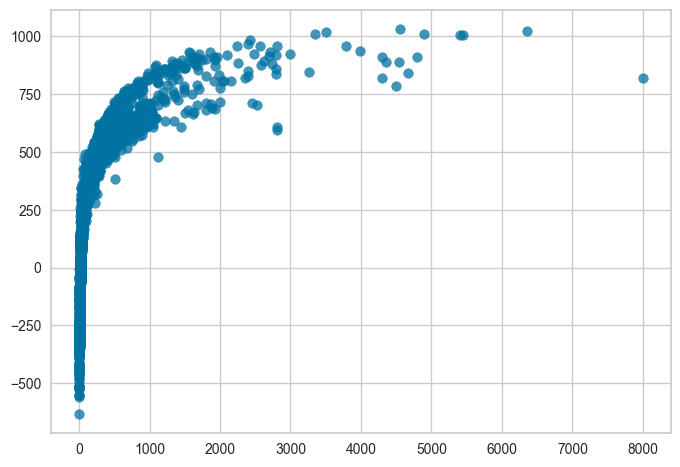

In [126]:
train_and_evaluate_model(LinearRegression())

Mean Absolute Error: 155.77207693600002
Mean Squared Error: 217567.34541287803
Root Mean Squared Error: 466.44114892757693
Mean Absolute Percentage Error: 3.579509948557775
R2 Score: 0.19047607334852512
Training Time: 0.008995294570922852


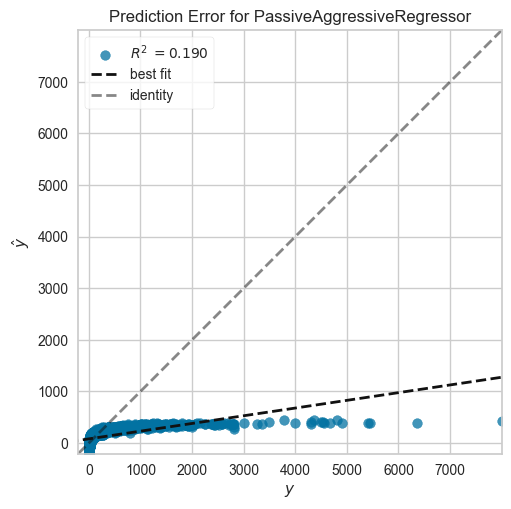

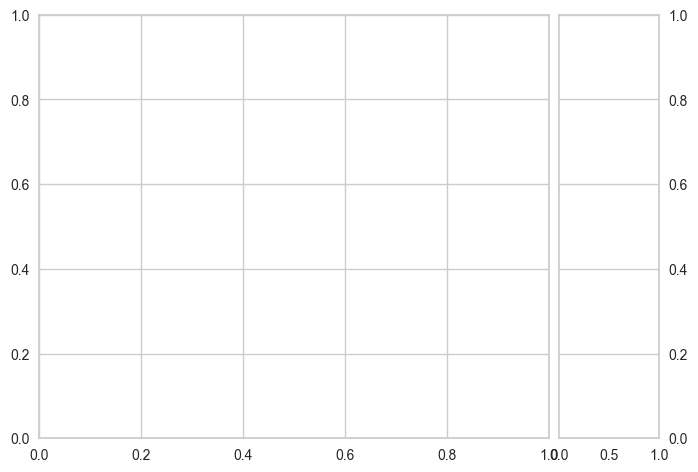

In [127]:
train_and_evaluate_model(PassiveAggressiveRegressor())

Mean Absolute Error: 226.2981992287408
Mean Squared Error: 167638.0696884139
Root Mean Squared Error: 409.4362828187237
Mean Absolute Percentage Error: 12.399212391767085
R2 Score: 0.3762527728005005
Training Time: 0.011340618133544922


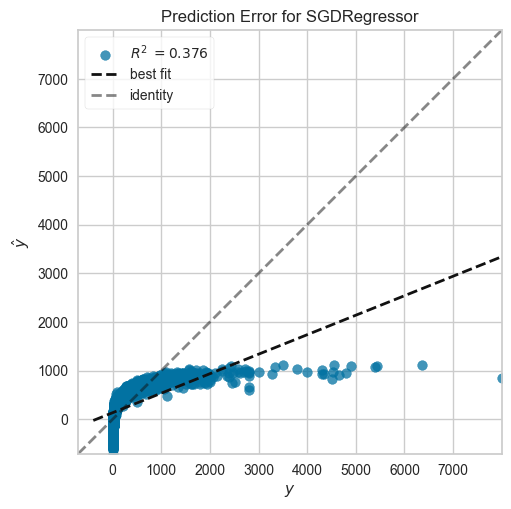

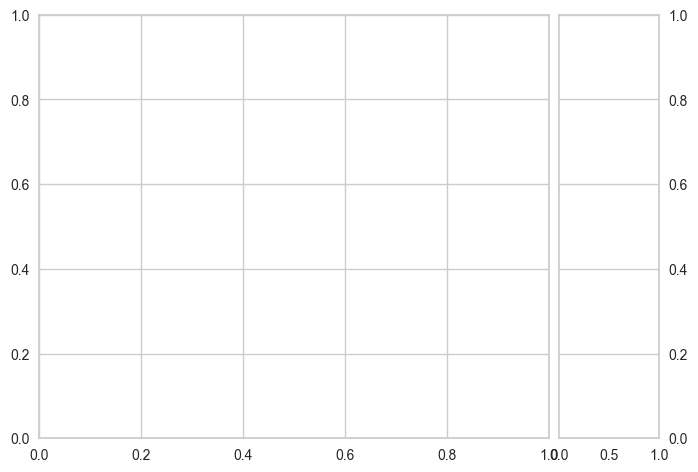

In [128]:
train_and_evaluate_model(SGDRegressor())

Mean Absolute Error: 213.41409828516774
Mean Squared Error: 167196.71701420474
Root Mean Squared Error: 408.896951583409
Mean Absolute Percentage Error: 11.132392060645758
R2 Score: 0.3778949565077381
Training Time: 0.012717962265014648


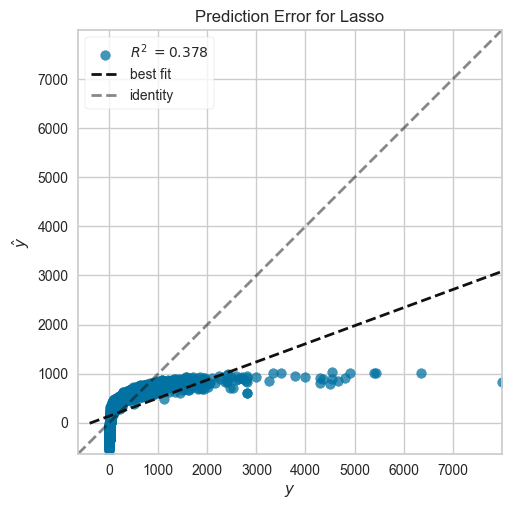

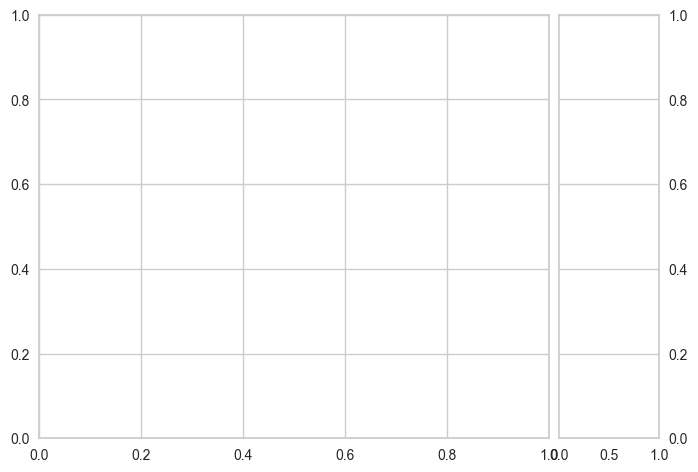

In [129]:
train_and_evaluate_model(Lasso(alpha=0.01))

Mean Absolute Error: 213.42070819423265
Mean Squared Error: 167198.1421355761
Root Mean Squared Error: 408.8986942209233
Mean Absolute Percentage Error: 11.133863779419864
R2 Score: 0.3778896539204112
Training Time: 0.0029976367950439453


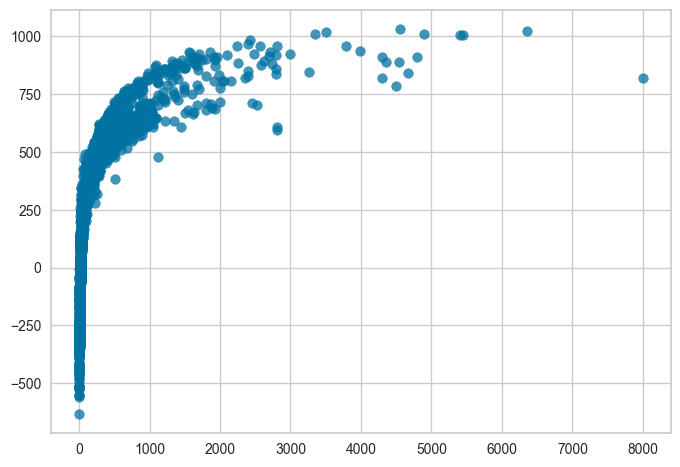

In [130]:
train_and_evaluate_model(Ridge(alpha=0.001))

Mean Absolute Error: 188.9466970519418
Mean Squared Error: 178713.9706704762
Root Mean Squared Error: 422.7457518065394
Mean Absolute Percentage Error: 6.127734848886094
R2 Score: 0.3350415936265909
Training Time: 0.007821083068847656


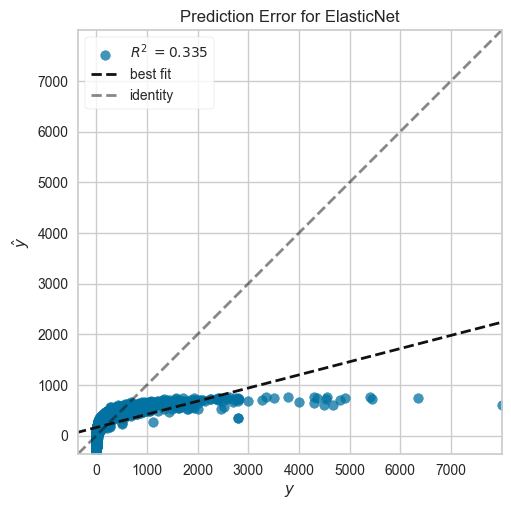

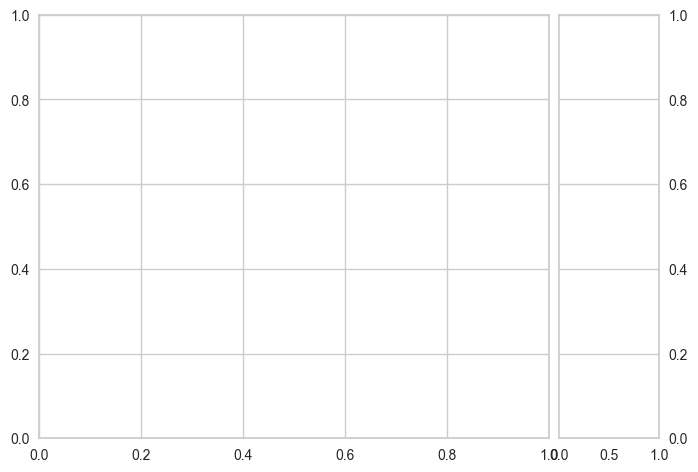

In [131]:
train_and_evaluate_model(ElasticNet(l1_ratio=0.3))

In [132]:
train_and_evaluate_model(PoissonRegressor())

Mean Absolute Error: 36.553124318329665
Mean Squared Error: 20701.894731829234
Root Mean Squared Error: 143.88153019699655
Mean Absolute Percentage Error: 0.27578118260862816
R2 Score: 0.9229724521359908
Training Time: 0.01234579086303711


In [133]:
train_and_evaluate_model(TweedieRegressor())

Mean Absolute Error: 186.83389369559367
Mean Squared Error: 183663.88195077595
Root Mean Squared Error: 428.56024308231855
Mean Absolute Percentage Error: 5.287975827607536
R2 Score: 0.31662397857227087
Training Time: 0.010033607482910156


Mean Absolute Error: 157.56289226059502
Mean Squared Error: 201580.96400338018
Root Mean Squared Error: 448.97768764536636
Mean Absolute Percentage Error: 5.2122163687035545
R2 Score: 0.24995815337761218
Training Time: 2.2058563232421875


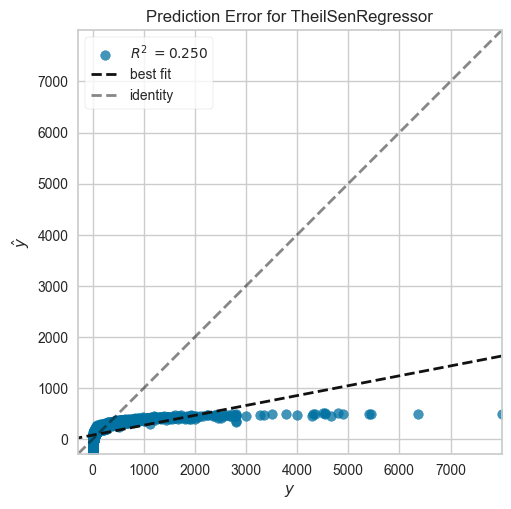

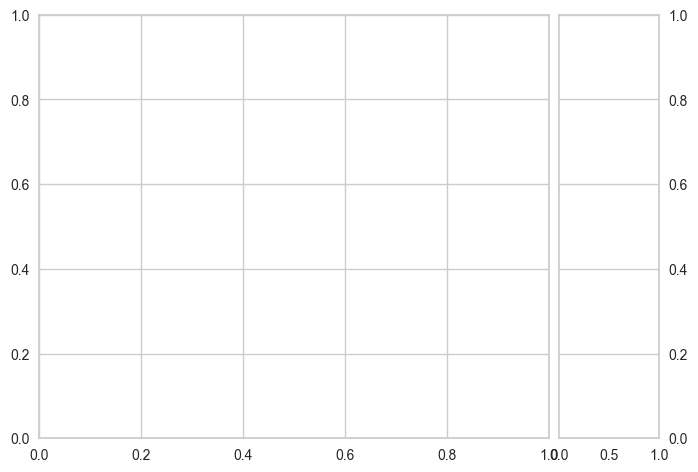

In [134]:
train_and_evaluate_model(TheilSenRegressor())

In [135]:
train_and_evaluate_model(GammaRegressor())

Mean Absolute Error: 121.88585710962785
Mean Squared Error: 171386.88686612254
Root Mean Squared Error: 413.988993653361
Mean Absolute Percentage Error: 0.8647014371499202
R2 Score: 0.36230418508280726
Training Time: 0.009127140045166016


Mean Absolute Error: 154.62668125087058
Mean Squared Error: 209097.50277297903
Root Mean Squared Error: 457.27180404326157
Mean Absolute Percentage Error: 3.857416125931706
R2 Score: 0.2219906384546051
Training Time: 0.053121089935302734


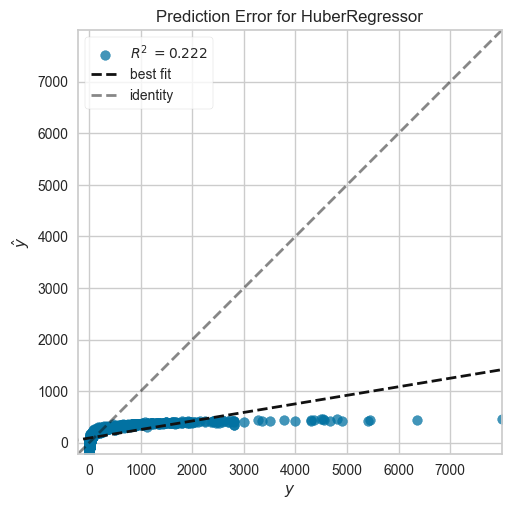

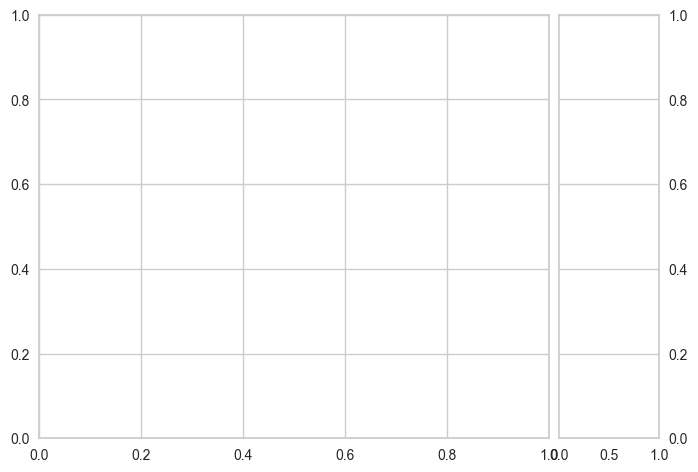

In [136]:
train_and_evaluate_model(HuberRegressor())

Mean Absolute Error: 213.06072026616184
Mean Squared Error: 167179.35522633916
Root Mean Squared Error: 408.87572100375337
Mean Absolute Percentage Error: 11.060482984111333
R2 Score: 0.3779595561959861
Training Time: 0.13362860679626465


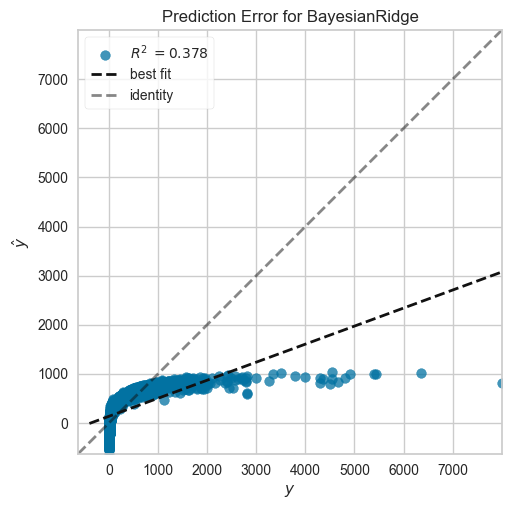

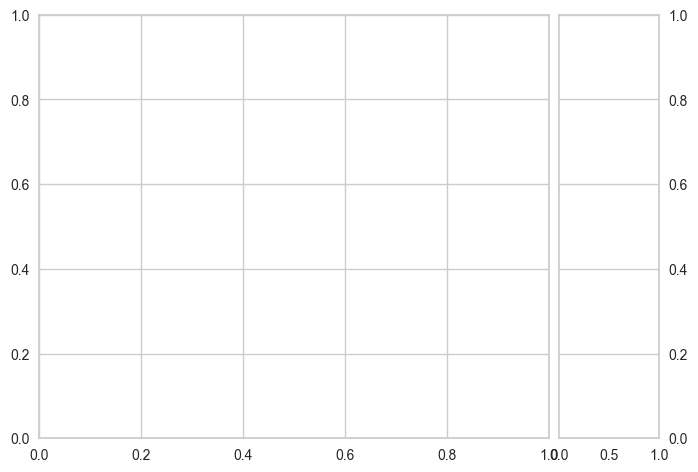

In [137]:
train_and_evaluate_model(BayesianRidge())

Mean Absolute Error: 213.15828090679744
Mean Squared Error: 167180.76873513605
Root Mean Squared Error: 408.87744953119636
Mean Absolute Percentage Error: 11.07274183117957
R2 Score: 0.3779542968166917
Training Time: 0.24023795127868652


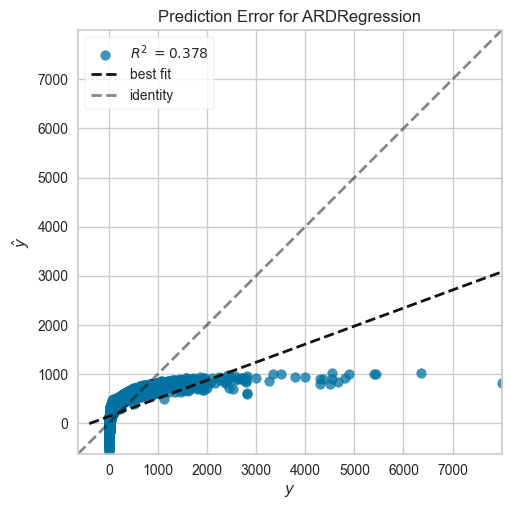

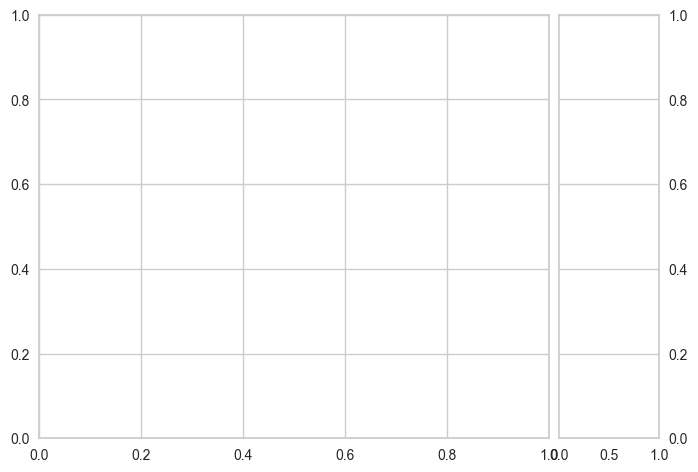

In [138]:
train_and_evaluate_model(ARDRegression())

Mean Absolute Error: 168.3735449878491
Mean Squared Error: 245549.03867027044
Root Mean Squared Error: 495.52904926983894
Mean Absolute Percentage Error: 2.1964195128270743
R2 Score: 0.08636187295188502
Training Time: 0.18381214141845703


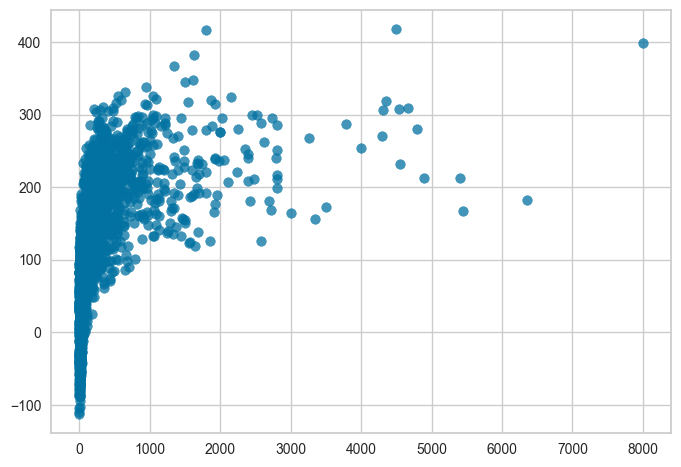

In [139]:
train_and_evaluate_model(RANSACRegressor())

Mean Absolute Error: 81.89178158158158
Mean Squared Error: 101780.86219585092
Root Mean Squared Error: 319.0311304494452
Mean Absolute Percentage Error: 0.30069908637151366
R2 Score: 0.6212940730310492
Training Time: 0.015630245208740234


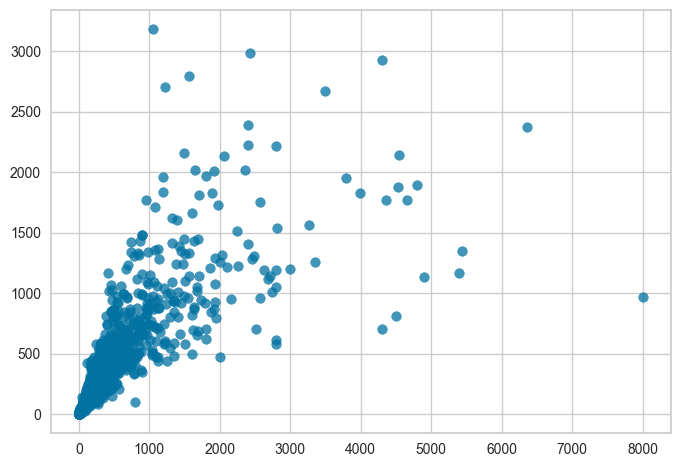

In [140]:
train_and_evaluate_model(KNeighborsRegressor())

Mean Absolute Error: 139.8005942518609
Mean Squared Error: 233141.03728634914
Root Mean Squared Error: 482.8468051943071
Mean Absolute Percentage Error: 0.7278048080498585
R2 Score: 0.13252952730804457
Training Time: 2.899280548095703


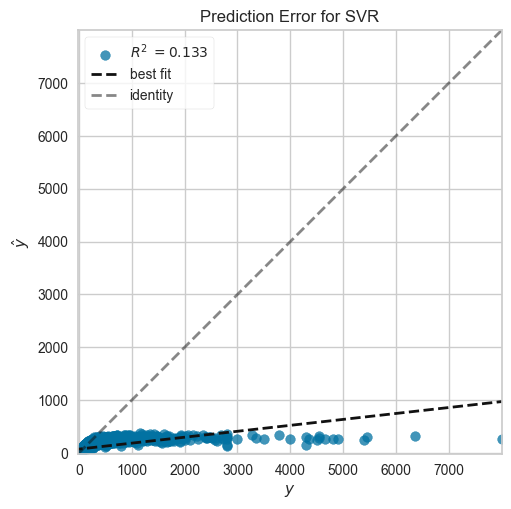

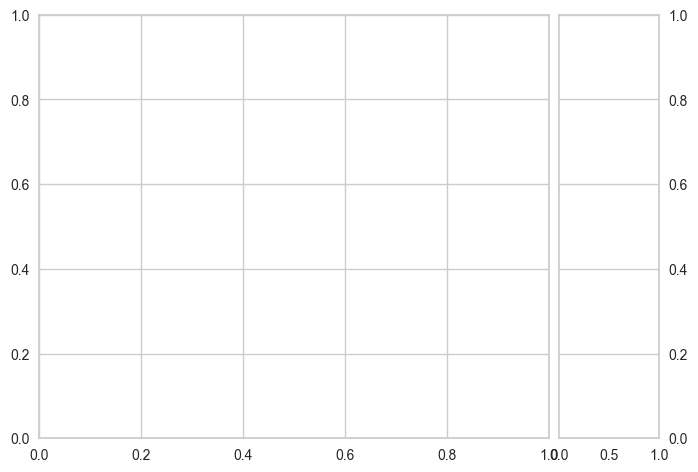

In [141]:
train_and_evaluate_model(SVR())

Mean Absolute Error: 153.58099230063056
Mean Squared Error: 220511.77549708562
Root Mean Squared Error: 469.5868135894423
Mean Absolute Percentage Error: 3.0897301047163146
R2 Score: 0.1795204467171705
Training Time: 0.008998870849609375


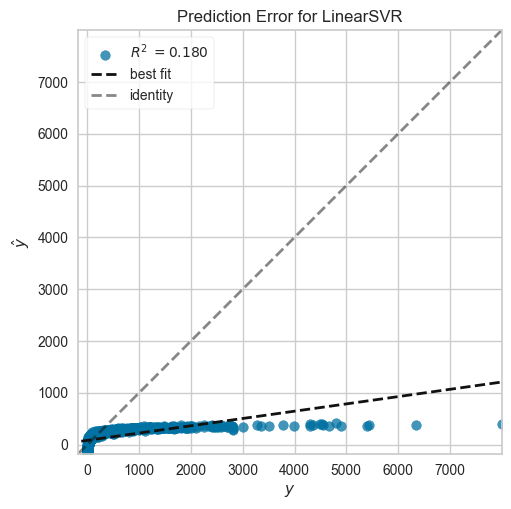

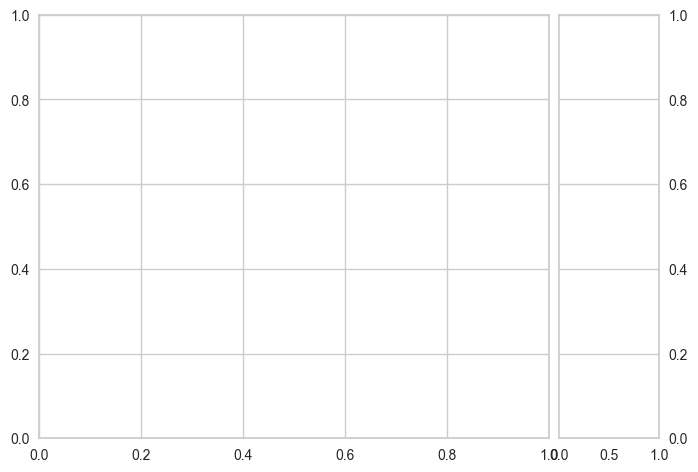

In [142]:
train_and_evaluate_model(LinearSVR())

Mean Absolute Error: 142.5806770398449
Mean Squared Error: 228972.92921490036
Root Mean Squared Error: 478.51115892411576
Mean Absolute Percentage Error: 1.287698415285431
R2 Score: 0.14803821132633654
Training Time: 1.5845506191253662


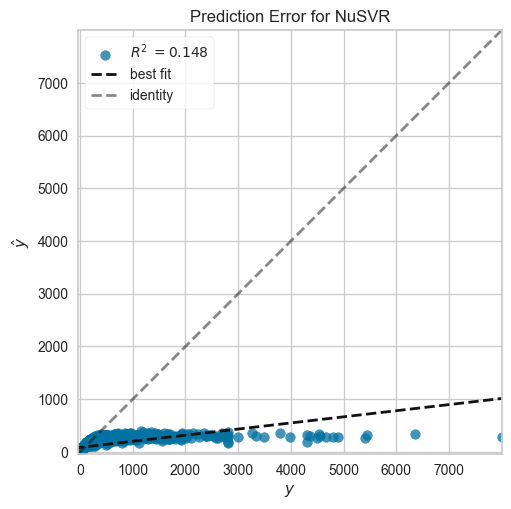

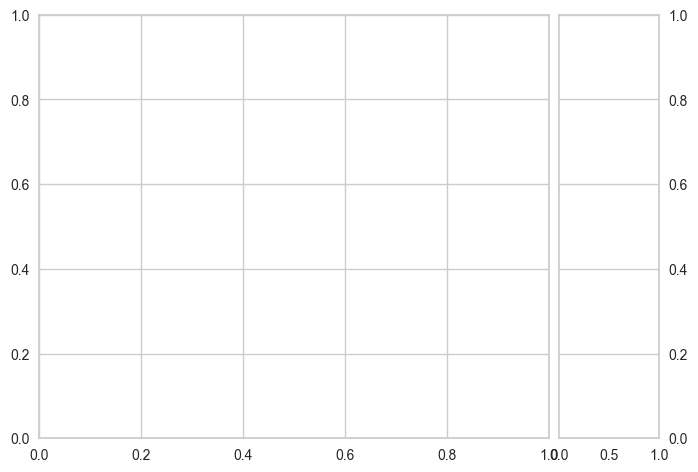

In [143]:
train_and_evaluate_model(NuSVR())

Mean Absolute Error: 16.70341918585252
Mean Squared Error: 13191.118209429198
Root Mean Squared Error: 114.85259339444276
Mean Absolute Percentage Error: 0.029597701858030862
R2 Score: 0.9509185269068929
Training Time: 0.06267595291137695


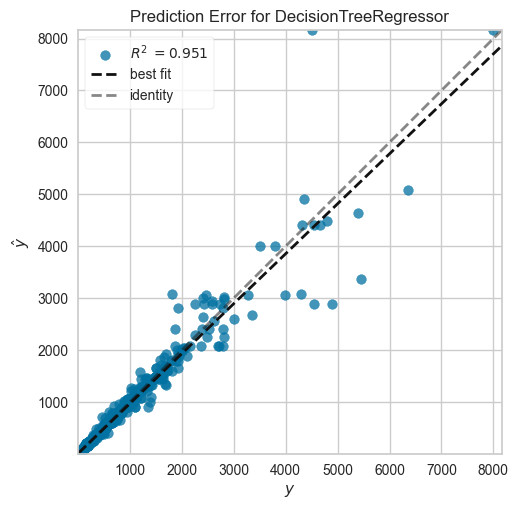

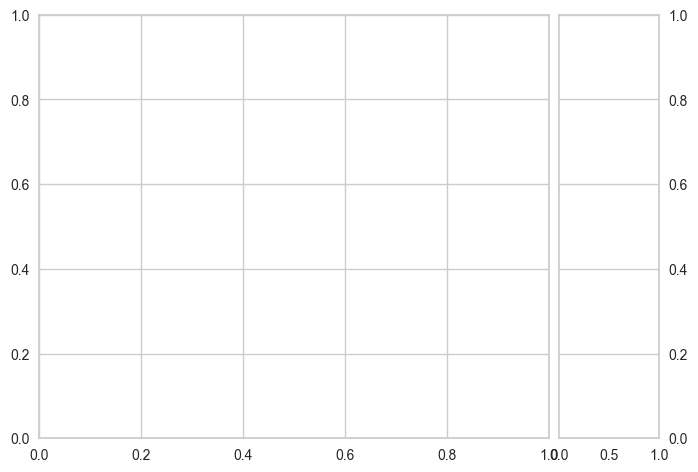

In [144]:
train_and_evaluate_model(DecisionTreeRegressor())

Mean Absolute Error: 11.767405445445448
Mean Squared Error: 6359.725944094039
Root Mean Squared Error: 79.74788990370867
Mean Absolute Percentage Error: 0.014177441652607172
R2 Score: 0.9763367507705707
Training Time: 1.8951308727264404


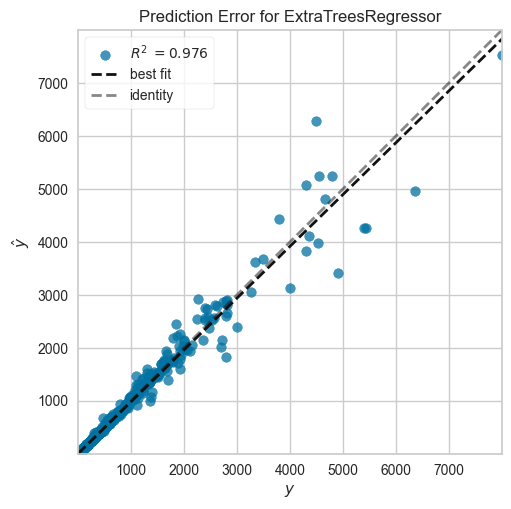

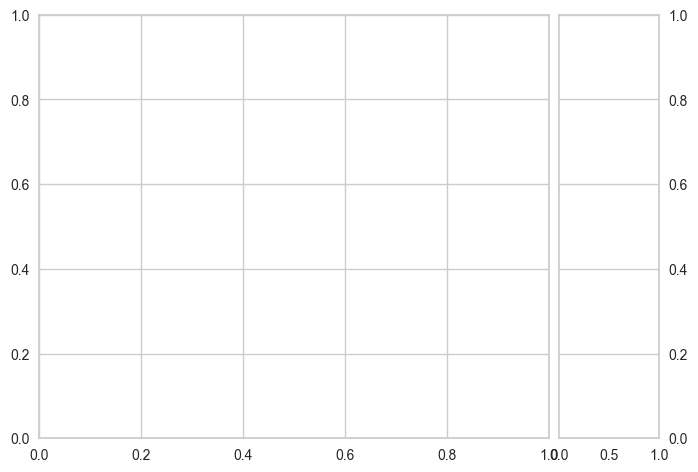

In [145]:
train_and_evaluate_model(ExtraTreesRegressor())

Mean Absolute Error: 373.0618256230851
Mean Squared Error: 169901.10125363184
Root Mean Squared Error: 412.19061276748147
Mean Absolute Percentage Error: 24.094041649226078
R2 Score: 0.36783249173610233
Training Time: 0.37844395637512207


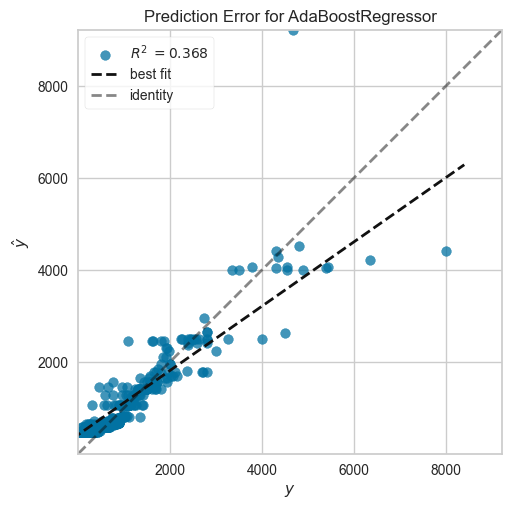

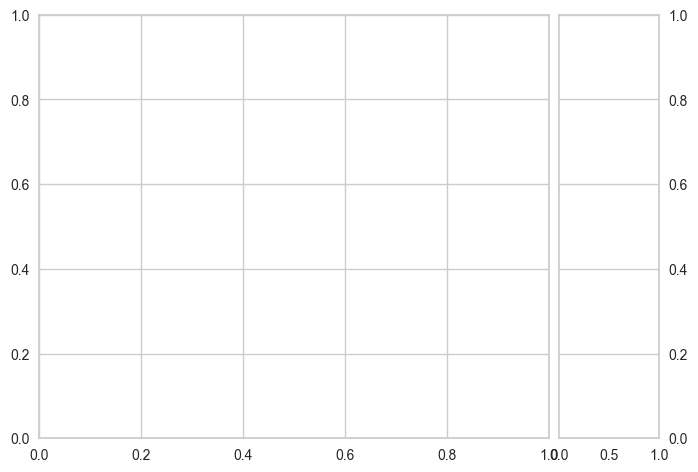

In [146]:
train_and_evaluate_model(AdaBoostRegressor())

Mean Absolute Error: 15.934095178511846
Mean Squared Error: 10662.775435948053
Root Mean Squared Error: 103.26071584076905
Mean Absolute Percentage Error: 0.022795975968923358
R2 Score: 0.9603259771197235
Training Time: 0.45496463775634766


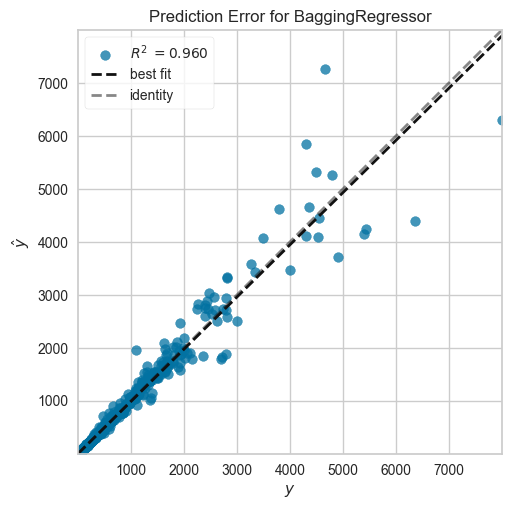

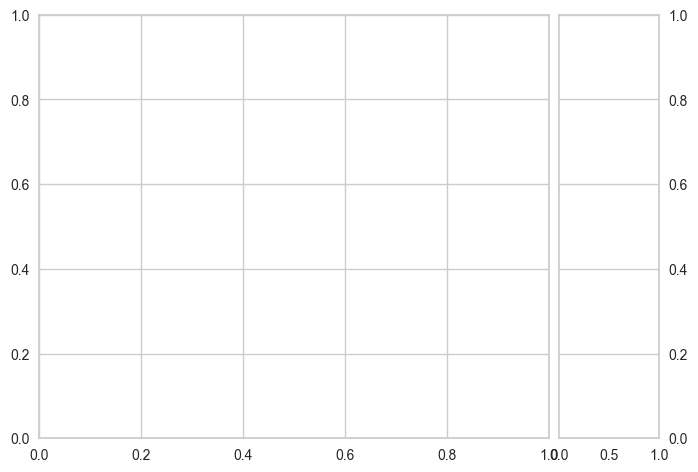

In [147]:
train_and_evaluate_model(BaggingRegressor())

Mean Absolute Error: 20.64486002830925
Mean Squared Error: 13493.017227189108
Root Mean Squared Error: 116.1594474297683
Mean Absolute Percentage Error: 0.18874401808912583
R2 Score: 0.9497952219465579
Training Time: 1.1912915706634521


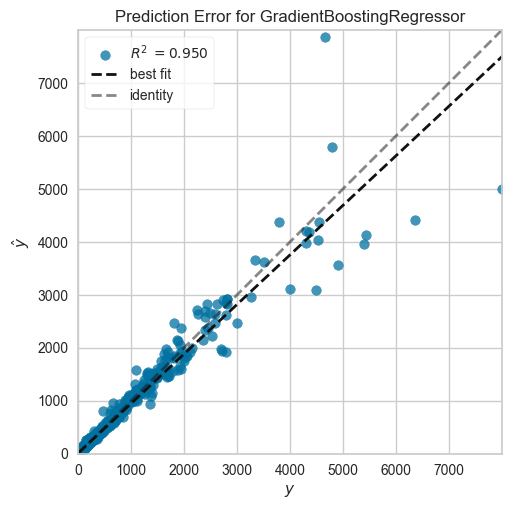

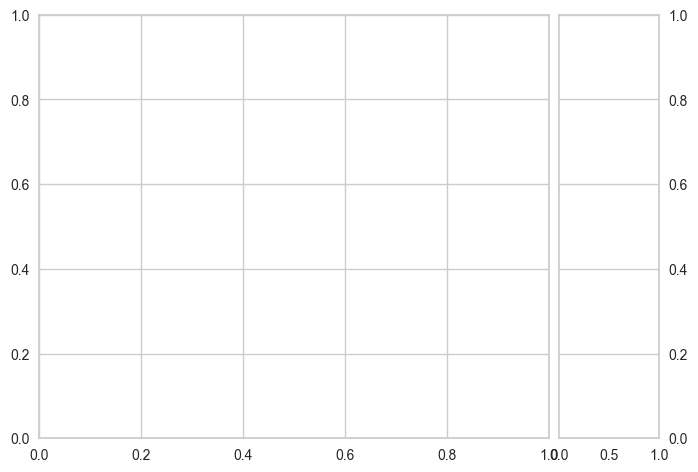

In [148]:
train_and_evaluate_model(GradientBoostingRegressor())

Mean Absolute Error: 20.29512863279213
Mean Squared Error: 13431.09317927563
Root Mean Squared Error: 115.89259328911244
Mean Absolute Percentage Error: 0.10049273279292983
R2 Score: 0.9500256287584162
Training Time: 0.5650954246520996


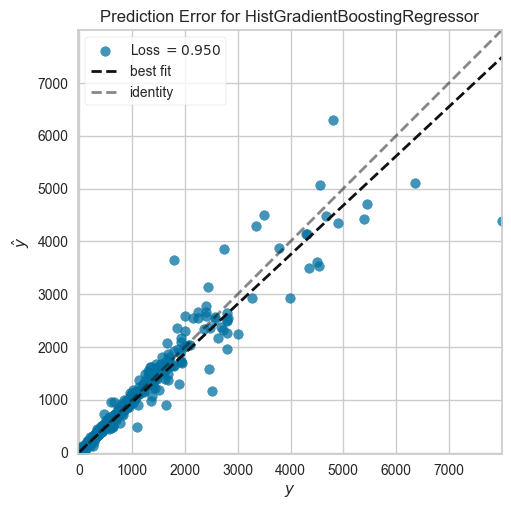

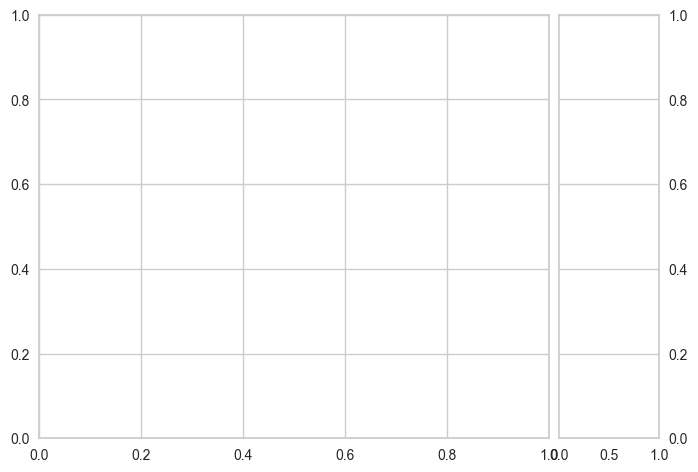

In [149]:
train_and_evaluate_model(HistGradientBoostingRegressor())

Mean Absolute Error: 14.07189562729396
Mean Squared Error: 10465.381974943984
Root Mean Squared Error: 102.30044953441791
Mean Absolute Percentage Error: 0.019037353428839998
R2 Score: 0.9610604381177381
Training Time: 4.4870476722717285


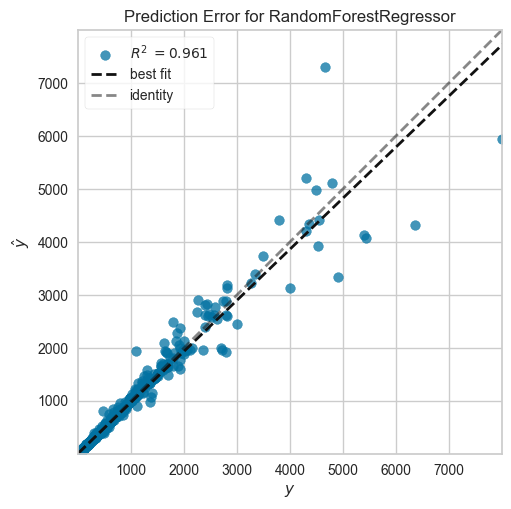

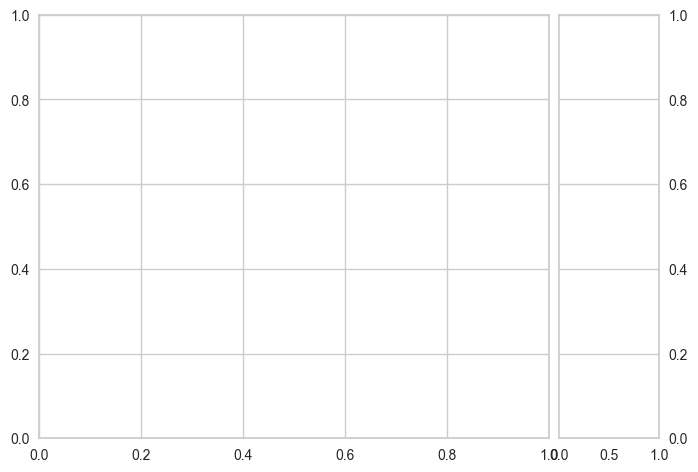

In [150]:
train_and_evaluate_model(RandomForestRegressor())

Mean Absolute Error: 19.70806272383624
Mean Squared Error: 16990.802533077545
Root Mean Squared Error: 130.34877265658295
Mean Absolute Percentage Error: 0.08365042218846372
R2 Score: 0.9367806728650622
Training Time: 0.27833032608032227


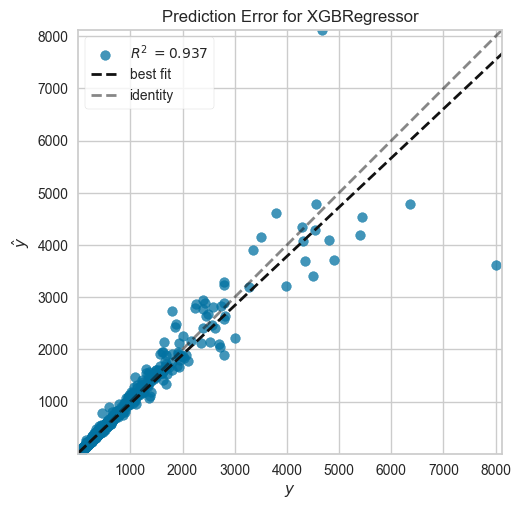

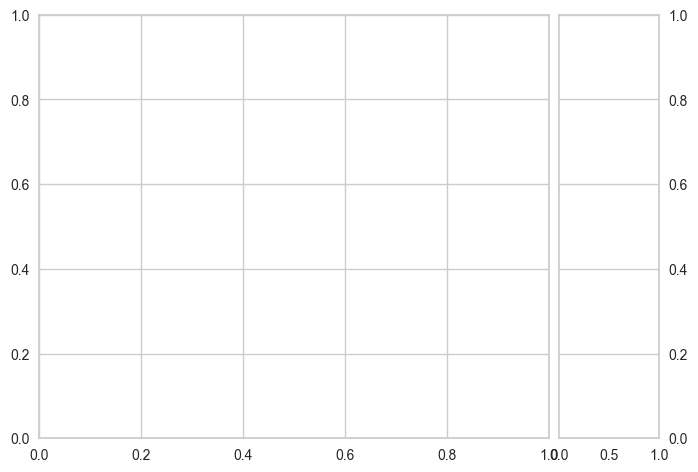

In [151]:
train_and_evaluate_model(XGBRegressor())

In [152]:
train_and_evaluate_model(CatBoostRegressor(silent=True))

Mean Absolute Error: 17.901773051320596
Mean Squared Error: 10572.891101993584
Root Mean Squared Error: 102.82456468176068
Mean Absolute Percentage Error: 0.11931038240296606
R2 Score: 0.9606604184800718
Training Time: 4.6550819873809814


Mean Absolute Error: 18.645762437566177
Mean Squared Error: 10966.364507214426
Root Mean Squared Error: 104.72041112989591
Mean Absolute Percentage Error: 0.10556997511798226
R2 Score: 0.9591963838133675
Training Time: 0.2079143524169922


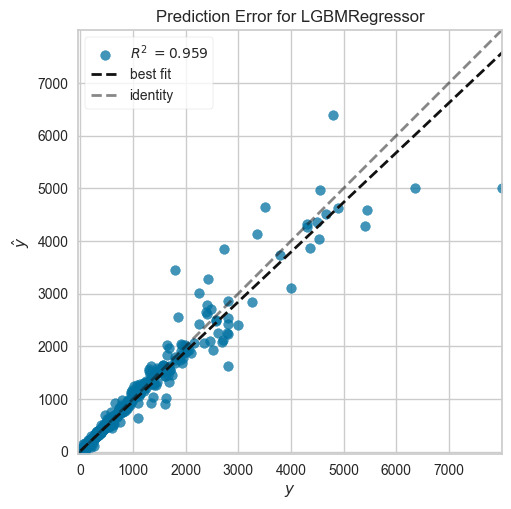

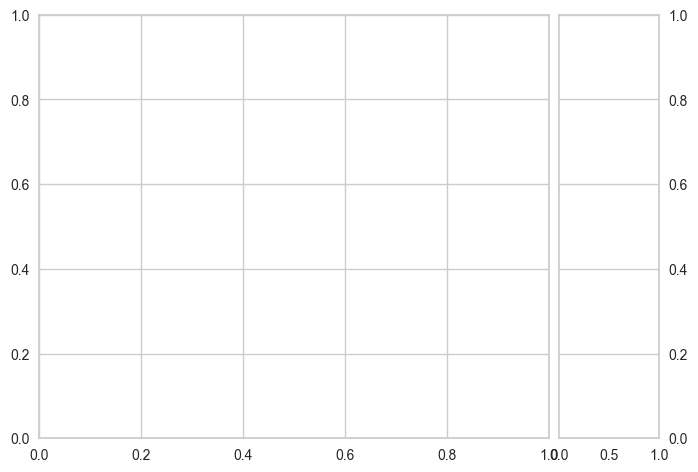

In [153]:
train_and_evaluate_model(LGBMRegressor())

In [154]:
train_and_evaluate_model(NGBRegressor())

[iter 0] loss=7.6922 val_loss=0.0000 scale=1.0000 norm=255.5840
[iter 100] loss=6.3421 val_loss=0.0000 scale=2.0000 norm=90.9302
[iter 200] loss=5.3874 val_loss=0.0000 scale=2.0000 norm=35.4227
[iter 300] loss=4.4015 val_loss=0.0000 scale=2.0000 norm=28.3314
[iter 400] loss=3.7229 val_loss=0.0000 scale=2.0000 norm=24.6798
Mean Absolute Error: 19.90904591492414
Mean Squared Error: 13592.158649983363
Root Mean Squared Error: 116.58541353867285
Mean Absolute Percentage Error: 0.1683398921671155
R2 Score: 0.9494263368378026
Training Time: 16.19578266143799


Mean Absolute Error: 21.889506133542397
Mean Squared Error: 11377.995442041978
Root Mean Squared Error: 106.6676869630254
Mean Absolute Percentage Error: 0.32693641229313736
R2 Score: 0.9576647886649298
Training Time: 0.261350154876709


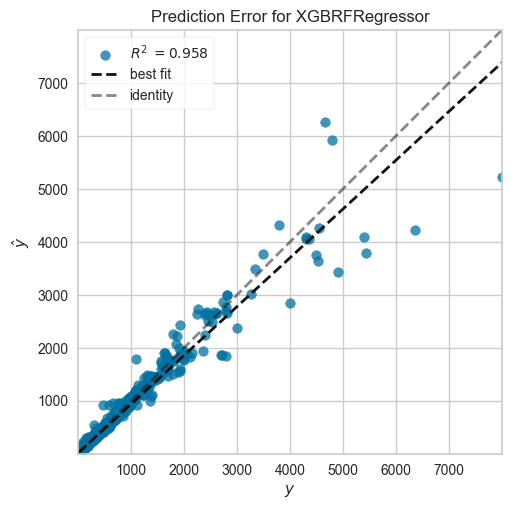

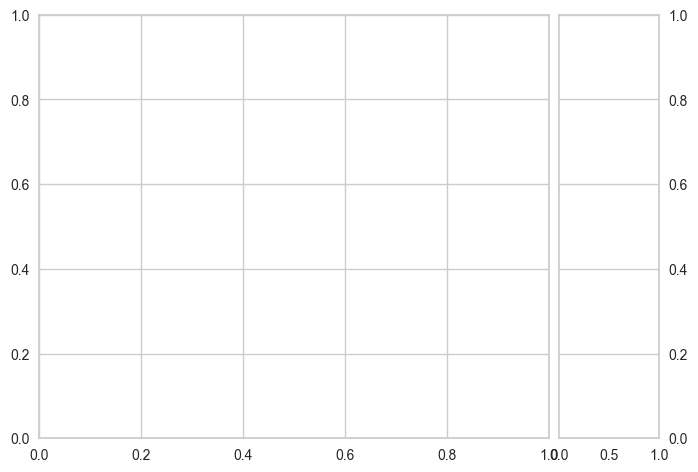

In [155]:
train_and_evaluate_model(XGBRFRegressor())

Mean Absolute Error: 108.39773640230997
Mean Squared Error: 80946.67987005829
Root Mean Squared Error: 284.511300074458
Mean Absolute Percentage Error: 2.3932217522358696
R2 Score: 0.6988138361781437
Training Time: 4.646028757095337


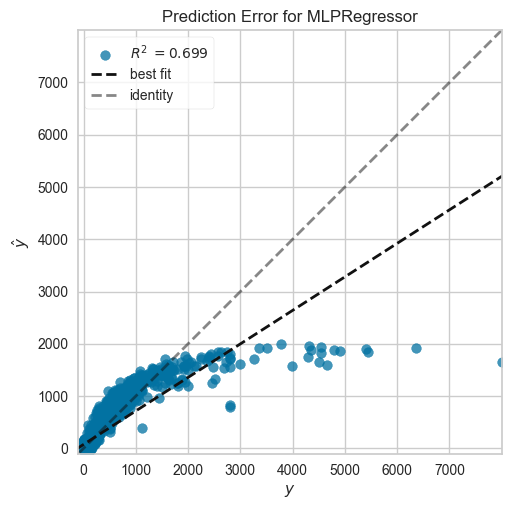

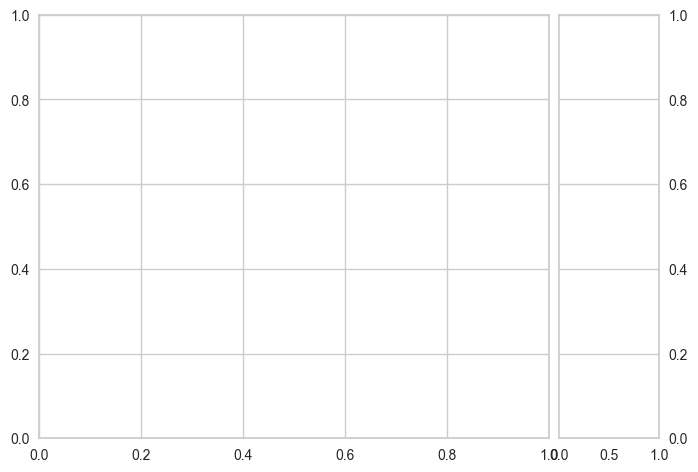

In [156]:
train_and_evaluate_model(MLPRegressor())

## Baseline Models Performance Comparison

In [157]:
model_perfs = pd.DataFrame({'Model': models, 
                            'R2': r2_scores, 
                            'MAE': mape_scores, 
                            'MSE': mse_scores, 
                            'RMSE': rmse_scores, 
                            'Training Time': training_times}).sort_values('R2',ascending=False).reset_index(drop=True)
model_perfs

,Model,R2,MAE,MSE,RMSE,Training Time
0,"(ExtraTreeRegressor(random_state=1029196382), ...",0.976337,0.014177,6359.725944,79.747890,1.895131
1,"(DecisionTreeRegressor(max_features=1.0, rando...",0.961060,0.019037,10465.381975,102.300450,4.487048
2,<catboost.core.CatBoostRegressor object at 0x0...,0.960660,0.119310,10572.891102,102.824565,4.655082
3,(DecisionTreeRegressor(random_state=2064953117...,0.960326,0.022796,10662.775436,103.260716,0.454965
4,LGBMRegressor(),0.959196,0.105570,10966.364507,104.720411,0.207914
5,"XGBRFRegressor(base_score=None, booster=None, ...",0.957665,0.326936,11377.995442,106.667687,0.261350
6,DecisionTreeRegressor(),0.950919,0.029598,13191.118209,114.852593,0.062676
7,HistGradientBoostingRegressor(),0.950026,0.100493,13431.093179,115.892593,0.565095
8,([DecisionTreeRegressor(criterion='friedman_ms...,0.949795,0.188744,13493.017227,116.159447,1.191292
9,NGBRegressor(random_state=RandomState(MT19937)...,0.949426,0.168340,13592.158650,116.585414,16.195783


The Extra Trees Regressor is the best performing model which achieved an incredible r2 score of more than 97% on the test set. It's closely followed by the Decision Trees Regressor model which produced an amazing r2 score of approximately 96.2%.

## Cross Validation & Hyperparameter Tuning

In [158]:
print(f"Mean cross validation training R2 score of Extra Trees Regressor: {round(np.mean(cross_val_score(model_perfs['Model'].iloc[0],final_X_train,y_train,cv=5,scoring='r2',verbose=0))*100,2)}%")

Mean cross validation training R2 score of Extra Trees Regressor: 96.07%


In [159]:
print(f"Mean cross validation test R2 score of Extra Trees Regressor: {round(np.mean(cross_val_score(model_perfs['Model'].iloc[0],final_X_test,y_test,cv=5,scoring='r2',verbose=0))*100,2)}%")

Mean cross validation test R2 score of Extra Trees Regressor: 95.59%


The cross validation R2 score of the Extra Trees Regressor model on the test set is comparable to the training cross validation R2 score so there seems to be no overfitting.

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END algorithm=brute, metric=minkowski, n_neighbors=8, p=1, weights=distance; total time=   0.1s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, metric=minkowski, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, metric=minkowski, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, metric=minkowski, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, metric=minkowski, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_

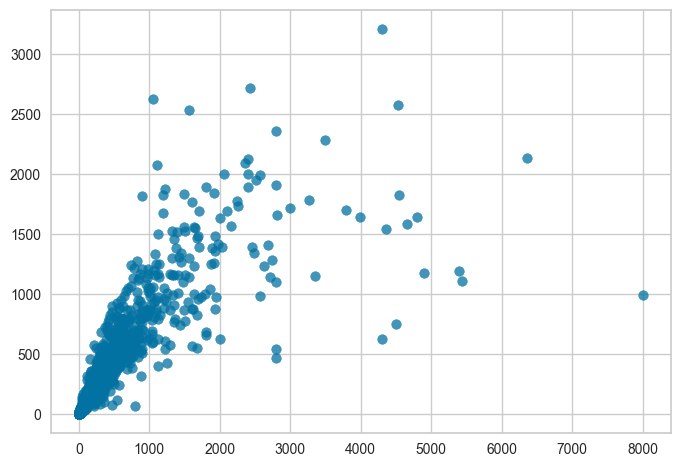

In [160]:
param_grid = {'n_neighbors': [2,8,12,20],
              'weights': ['uniform','distance'],
              'algorithm': ['ball_tree', 'brute', 'kd_tree'],
              'metric': ['minkowski','manhattan','euclidean','chebyshev'],
              'p': [1,2]
             }

grid_knn = RandomizedSearchCV(KNeighborsRegressor(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_knn)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END interaction_cst=pairwise, learning_rate=0.5, loss=quantile, max_bins=50; total time=   0.0s
[CV] END interaction_cst=pairwise, learning_rate=0.5, loss=quantile, max_bins=50; total time=   0.0s
[CV] END interaction_cst=pairwise, learning_rate=0.5, loss=quantile, max_bins=50; total time=   0.0s
[CV] END interaction_cst=pairwise, learning_rate=0.5, loss=quantile, max_bins=50; total time=   0.0s
[CV] END interaction_cst=pairwise, learning_rate=0.5, loss=quantile, max_bins=50; total time=   0.0s
[CV] END interaction_cst=pairwise, learning_rate=1.0, loss=quantile, max_bins=200; total time=   0.0s
[CV] END interaction_cst=pairwise, learning_rate=1.0, loss=quantile, max_bins=200; total time=   0.0s
[CV] END interaction_cst=pairwise, learning_rate=1.0, loss=quantile, max_bins=200; total time=   0.0s
[CV] END interaction_cst=pairwise, learning_rate=1.0, loss=quantile, max_bins=200; total time=   0.0s
[CV] END interaction_cst=p

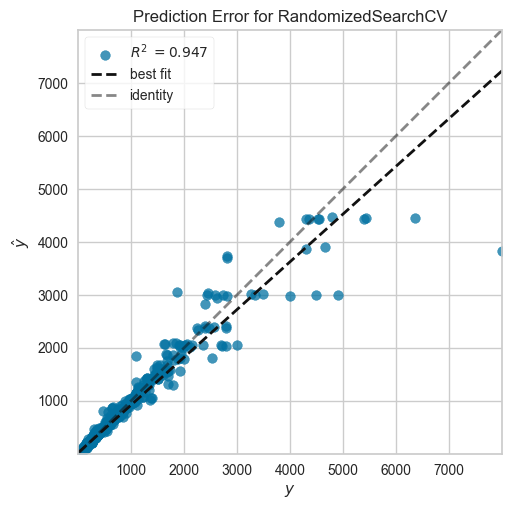

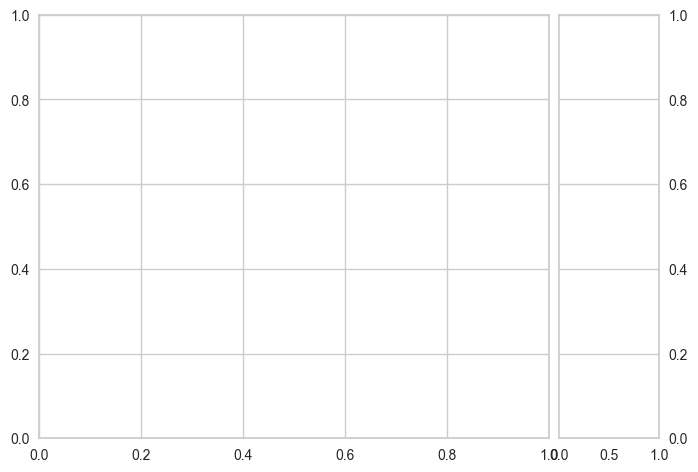

In [161]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.8,1.0],
              'loss': ['squared_error','absolute_error','poisson','quantile'],
              'max_bins': np.arange(0,255,50),
              'interaction_cst': ['pairwise','no_interaction']}

grid_hgb = RandomizedSearchCV(HistGradientBoostingRegressor(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_hgb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Mean Absolute Error: 213.51384394076788
Mean Squared Error: 167184.22055764636
Root Mean Squared Error: 408.8816706061136
Mean Absolute Percentage Error: 11.136663604608701
R2 Score: 0.37794145328584217
Training Time: 59.68140125274658


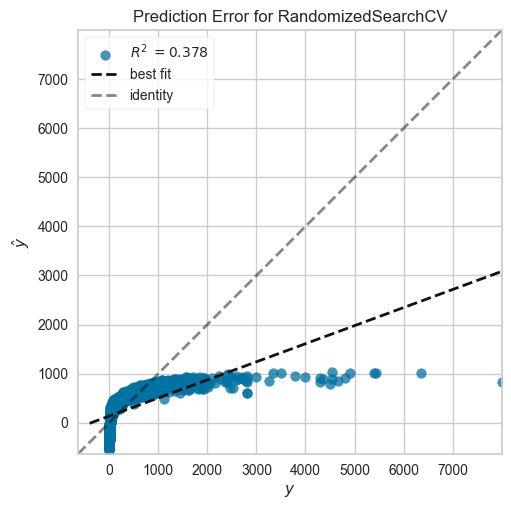

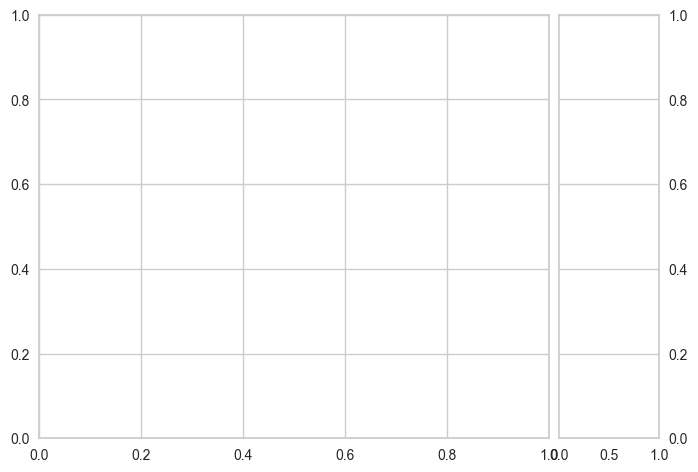

In [162]:
param_grid = {'loss': ['epsilon_insensitive','squared_epsilon_insensitive'],
             'C': [0.0001,0.001,0.01,0.1,1],
             'epsilon': np.linspace(0.001,1,5)}

grid_lsvr = RandomizedSearchCV(LinearSVR(),param_grid,cv=5,verbose=2,n_jobs=10)
train_and_evaluate_model(grid_lsvr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=absolute_error, max_features=sqrt, splitter=best; total time=   0.3s
[CV] END criterion=absolute_error, max_features=sqrt, splitter=best; total time=   0.4s
[CV] END criterion=absolute_error, max_features=sqrt, splitter=best; total time=   0.4s
[CV] END criterion=absolute_error, max_features=sqrt, splitter=best; total time=   0.4s
[CV] END criterion=absolute_error, max_features=sqrt, splitter=best; total time=   0.8s
[CV] END criterion=friedman_mse, max_features=sqrt, splitter=random; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=sqrt, splitter=random; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=sqrt, splitter=random; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=sqrt, splitter=random; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=sqrt, splitter=random; total time=   0.0s
[CV] END criterion=poisson, max_features=auto, splitter=ran

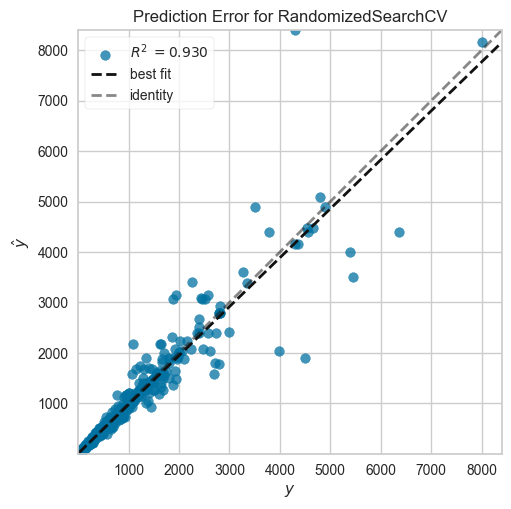

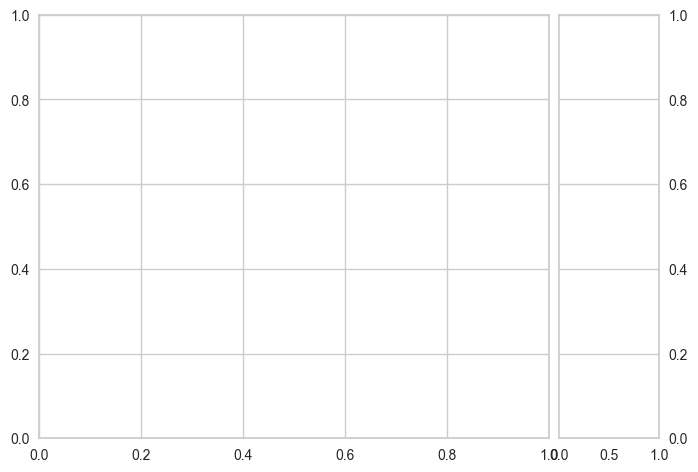

In [163]:
param_grid = {'criterion': ['squared_error','friedman_mse','absolute_error','poisson'],
              'splitter': ['best','random'],
              'max_features': ['auto','sqrt','log2']
             }

grid_dt = RandomizedSearchCV(DecisionTreeRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_dt)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END criterion=friedman_mse, learning_rate=0.2, loss=absolute_error, max_features=log2, n_estimators=700;, score=0.964 total time=   4.3s
[CV 2/5] END criterion=friedman_mse, learning_rate=0.2, loss=absolute_error, max_features=log2, n_estimators=700;, score=0.943 total time=   5.0s
[CV 3/5] END criterion=friedman_mse, learning_rate=0.2, loss=absolute_error, max_features=log2, n_estimators=700;, score=0.947 total time=   5.8s
[CV 4/5] END criterion=friedman_mse, learning_rate=0.2, loss=absolute_error, max_features=log2, n_estimators=700;, score=0.922 total time=   4.9s
[CV 5/5] END criterion=friedman_mse, learning_rate=0.2, loss=absolute_error, max_features=log2, n_estimators=700;, score=0.952 total time=   5.9s
[CV 1/5] END criterion=squared_error, learning_rate=0.7, loss=squared_error, max_features=auto, n_estimators=400;, score=0.960 total time=   5.9s
[CV 2/5] END criterion=squared_error, learning_rate=0.7, loss=s

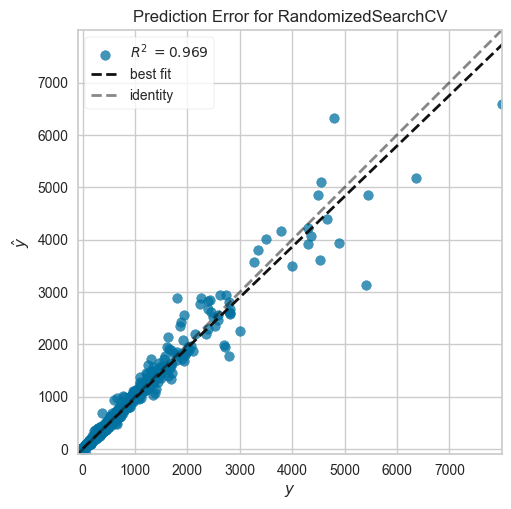

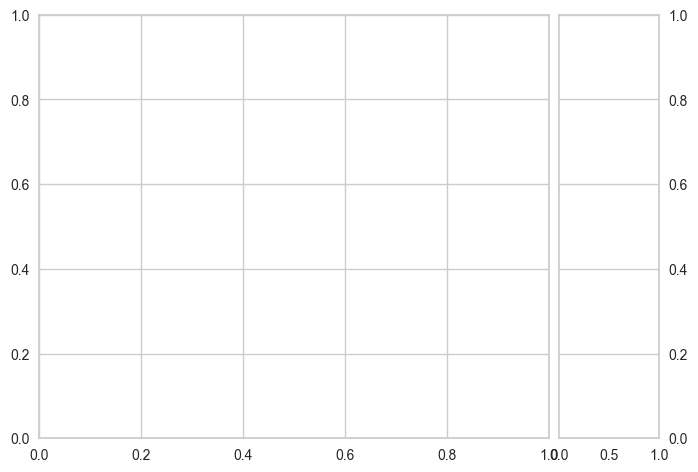

In [164]:
param_grid =  {'loss': ['squared_error','absolute_error','huber','quantile'],
                'n_estimators': [100,400,700,1000],
                'learning_rate': [0.2,0.4,0.7,1],
                'criterion': ['friedman_mse','squared_error'],
                'max_features': ['auto','sqrt','log2']
                }
    
grid_gb = RandomizedSearchCV(GradientBoostingRegressor(),param_grid,verbose=4,cv=5)
train_and_evaluate_model(grid_gb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END learning_rate=0.5, n_estimators=800;, score=-2757.847 total time=   3.4s
[CV 2/5] END learning_rate=0.5, n_estimators=800;, score=-2592.367 total time=   2.4s
[CV 3/5] END learning_rate=0.5, n_estimators=800;, score=-2315.575 total time=   3.5s
[CV 4/5] END learning_rate=0.5, n_estimators=800;, score=-2898.043 total time=   2.5s
[CV 5/5] END learning_rate=0.5, n_estimators=800;, score=-3009.212 total time=   4.4s
[CV 1/5] END learning_rate=0.5, n_estimators=100;, score=-2753.978 total time=   0.7s
[CV 2/5] END learning_rate=0.5, n_estimators=100;, score=-2589.350 total time=   0.7s
[CV 3/5] END learning_rate=0.5, n_estimators=100;, score=-2314.087 total time=   0.9s
[CV 4/5] END learning_rate=0.5, n_estimators=100;, score=-2892.918 total time=   0.9s
[CV 5/5] END learning_rate=0.5, n_estimators=100;, score=-3001.728 total time=   0.9s
[CV 1/5] END learning_rate=0.4, n_estimators=400;, score=-2755.052 total time= 

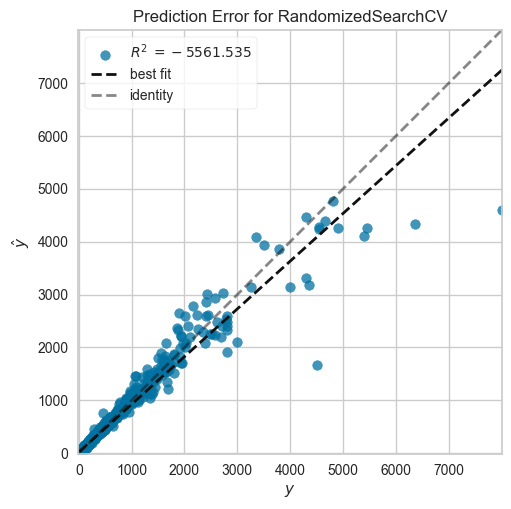

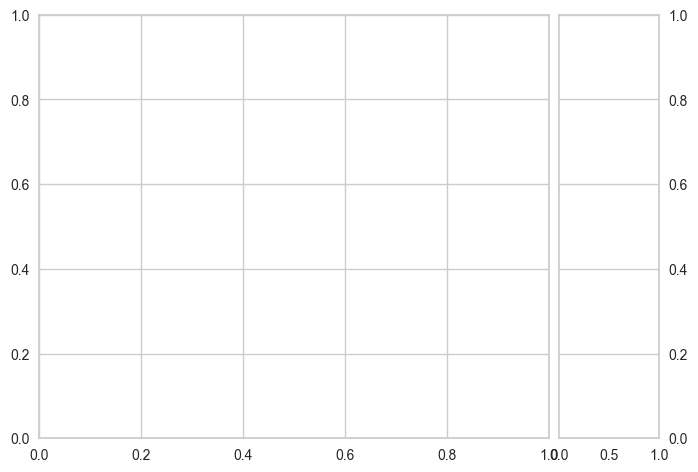

In [165]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.7,1],
'n_estimators': [100,400,700,800,1000]
}
    
grid_cat = RandomizedSearchCV(CatBoostRegressor(silent=True),param_grid,verbose=5,cv=5)
train_and_evaluate_model(grid_cat)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END boosting_type=rf, importance_type=split, learning_rate=1.0, min_split_gain=0.68, n_estimators=300;, score=nan total time=   0.1s
[CV 2/5] END boosting_type=rf, importance_type=split, learning_rate=1.0, min_split_gain=0.68, n_estimators=300;, score=nan total time=   0.0s
[CV 3/5] END boosting_type=rf, importance_type=split, learning_rate=1.0, min_split_gain=0.68, n_estimators=300;, score=nan total time=   0.0s
[CV 4/5] END boosting_type=rf, importance_type=split, learning_rate=1.0, min_split_gain=0.68, n_estimators=300;, score=nan total time=   0.0s
[CV 5/5] END boosting_type=rf, importance_type=split, learning_rate=1.0, min_split_gain=0.68, n_estimators=300;, score=nan total time=   0.0s
[CV 1/5] END boosting_type=dart, importance_type=gain, learning_rate=0.2, min_split_gain=0.79, n_estimators=100;, score=0.939 total time=   0.0s
[CV 2/5] END boosting_type=dart, importance_type=gain, learning_rate=0.2, min_split_

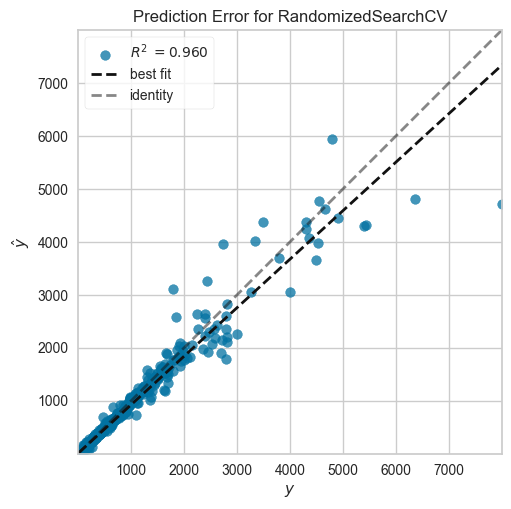

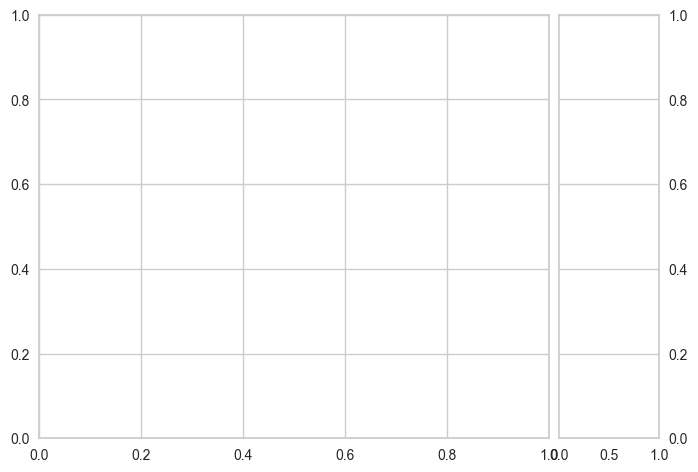

In [166]:
param_grid = {'boosting_type': ['gbdt','dart','goss','rf'],
            'learning_rate': np.linspace(0,1,6)[1:],
            'n_estimators': [100,300,500,800,1000],
            'importance_type': ['split','gain'],
            'min_split_gain': [0.68,0.79,0.87,1]}

grid_lgbm = RandomizedSearchCV(LGBMRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_lgbm)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END booster=gbtree, grow_policy=0, importance_type=total_gain, learning_rate=0.4, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.2s
[CV 2/5] END booster=gbtree, grow_policy=0, importance_type=total_gain, learning_rate=0.4, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, grow_policy=0, importance_type=total_gain, learning_rate=0.4, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, grow_policy=0, importance_type=total_gain, learning_rate=0.4, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, grow_policy=0, importance_type=total_gain, learning_rate=0.4, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, grow_policy=0, importance_type=total_gain, learning_rate=0.7, n_estimators=400, samplin

[CV 2/5] END booster=gblinear, grow_policy=1, importance_type=gain, learning_rate=0.4, n_estimators=100, sampling_method=gradient_based;, score=0.306 total time=   0.0s
[02:56:17] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "grow_policy", "sampling_method" } are not used.

[CV 3/5] END booster=gblinear, grow_policy=1, importance_type=gain, learning_rate=0.4, n_estimators=100, sampling_method=gradient_based;, score=0.297 total time=   0.0s
[02:56:17] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "grow_policy", "sampling_method" } are not used.

[CV 4/5] END booster=gblinear, grow_policy=1, importance_type=gain, learning_rate=0.4, n_estimators=100, sampling_method=gradient_based;, score=0.328 total time=   0.0s
[02:56:17] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "grow_policy", "sampling_method" } are not used.

[

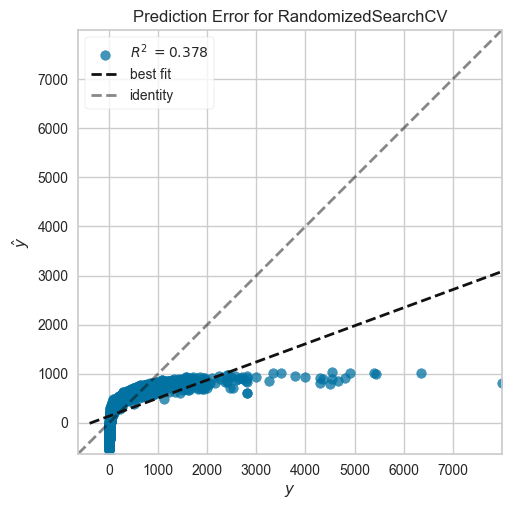

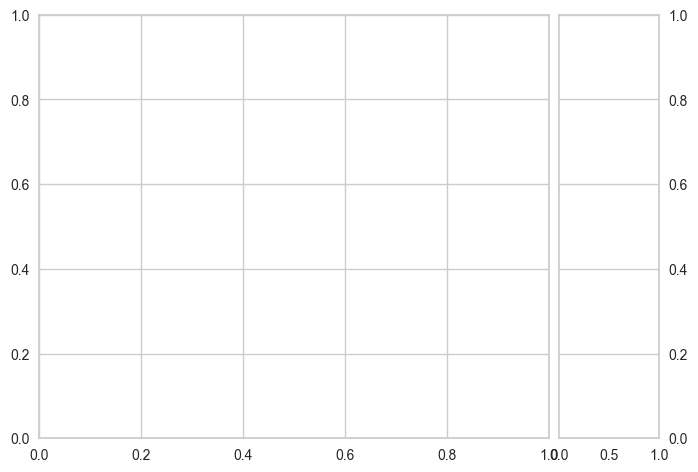

In [167]:
param_grid = {'n_estimators': [100,400,700,1000],
        'grow_policy': [0,1],
        'learning_rate': [0.1,0.4,0.7,1],
        'booster': ['gbtree','gblinear','dart'],
        'sampling_method': ['uniform','gradient_based'],
        'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgb = RandomizedSearchCV(XGBRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_xgb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END alpha=0.0001, average=False, epsilon=44.44499999999999, l1_ratio=0.97, learning_rate=invscaling, loss=huber, penalty=elasticnet, shuffle=True;, score=0.203 total time=   0.0s
[CV 2/5] END alpha=0.0001, average=False, epsilon=44.44499999999999, l1_ratio=0.97, learning_rate=invscaling, loss=huber, penalty=elasticnet, shuffle=True;, score=0.159 total time=   0.0s
[CV 3/5] END alpha=0.0001, average=False, epsilon=44.44499999999999, l1_ratio=0.97, learning_rate=invscaling, loss=huber, penalty=elasticnet, shuffle=True;, score=0.174 total time=   0.0s
[CV 4/5] END alpha=0.0001, average=False, epsilon=44.44499999999999, l1_ratio=0.97, learning_rate=invscaling, loss=huber, penalty=elasticnet, shuffle=True;, score=0.163 total time=   0.0s
[CV 5/5] END alpha=0.0001, average=False, epsilon=44.44499999999999, l1_ratio=0.97, learning_rate=invscaling, loss=huber, penalty=elasticnet, shuffle=True;, score=0.258 total time=   0.0s

[CV 4/5] END alpha=0.001, average=True, epsilon=100.0, l1_ratio=0.81, learning_rate=optimal, loss=squared_error, penalty=l1, shuffle=True;, score=-44974798835061.047 total time=   0.0s
[CV 5/5] END alpha=0.001, average=True, epsilon=100.0, l1_ratio=0.81, learning_rate=optimal, loss=squared_error, penalty=l1, shuffle=True;, score=-323078557331346.125 total time=   0.0s
Mean Absolute Error: 239.00472412724383
Mean Squared Error: 168728.18103813217
Root Mean Squared Error: 410.7653600757155
Mean Absolute Percentage Error: 12.91891045713944
R2 Score: 0.37219668975809084
Training Time: 6.264957904815674


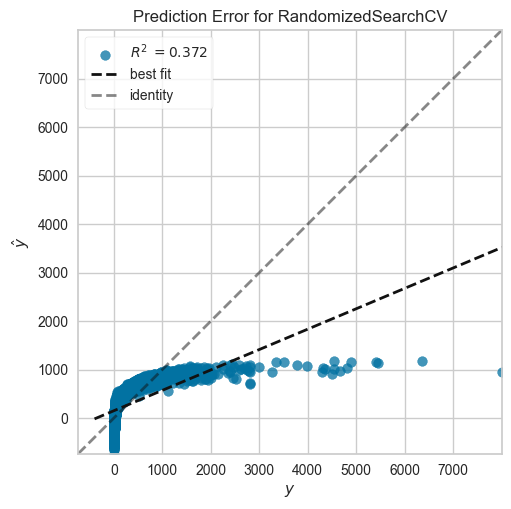

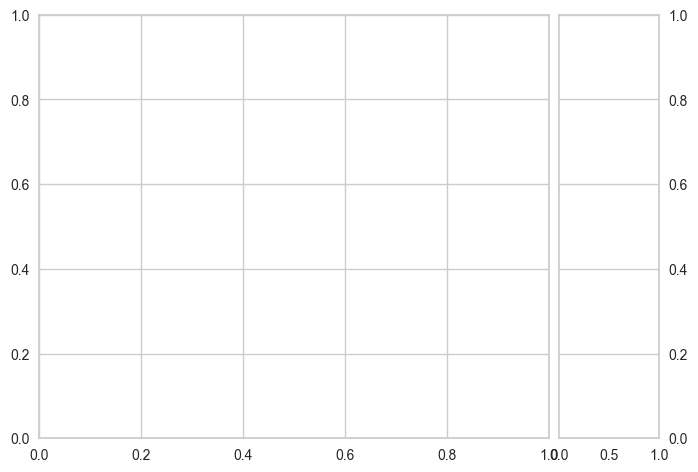

In [168]:
param_grid = {  
                'loss': ['squared_error','huber','epsilon_insensitive','squared_epsilon_insensitive'],
                'penalty': ['l2', 'l1', 'elasticnet'],
                'l1_ratio': [0.15,0.45,0.68,0.81,0.97],
                'alpha': [0.0001,0.001,0.01,0.1,1],
                'shuffle': [True,False],
                'learning_rate': ['adaptive','constant','optimal','invscaling'],
                'epsilon': np.linspace(0.001,100,10),
                'average': [True,False]
             }

grid_sgd = RandomizedSearchCV(SGDRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_sgd)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ..........................alpha=2.2223, epsilon=1.0; total time=   0.0s
[CV] END ..........................alpha=2.2223, epsilon=1.0; total time=   0.0s
[CV] END ..........................alpha=2.2223, epsilon=1.0; total time=   0.0s
[CV] END ..........................alpha=2.2223, epsilon=1.0; total time=   0.0s
[CV] END ..........................alpha=2.2223, epsilon=1.0; total time=   0.0s
[CV] END ..........................alpha=1.1112, epsilon=8.0; total time=   0.0s
[CV] END ..........................alpha=1.1112, epsilon=8.0; total time=   0.0s
[CV] END ..........................alpha=1.1112, epsilon=8.0; total time=   0.0s
[CV] END ..........................alpha=1.1112, epsilon=8.0; total time=   0.0s
[CV] END ..........................alpha=1.1112, epsilon=8.0; total time=   0.0s
[CV] END ..........................alpha=6.6667, epsilon=1.0; total time=   0.0s
[CV] END ..........................alpha=6.6667,

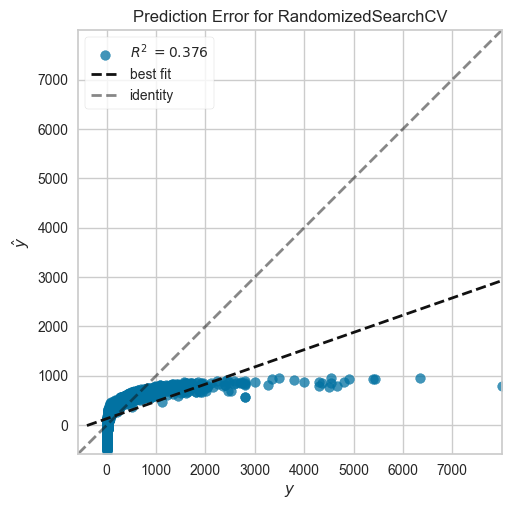

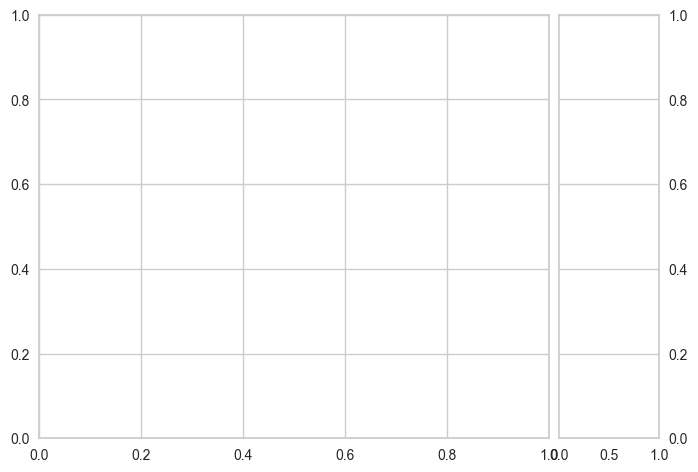

In [169]:
param_grid = {'epsilon': np.linspace(1,10,10),
'alpha': np.linspace(0.0001,10,10)}

grid_huber = RandomizedSearchCV(HuberRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_huber)

In [170]:
param_grid = {'link': ['auto', 'identity', 'log'],
'solver': ['lbfgs', 'newton-cholesky'],
'alpha': np.linspace(0.0001,10,10)}

grid_tweedie = RandomizedSearchCV(TweedieRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_tweedie)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END .....alpha=2.2223, link=log, solver=newton-cholesky; total time=   0.1s
[CV] END .....alpha=2.2223, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=2.2223, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=2.2223, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=2.2223, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=1.1112, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=1.1112, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=1.1112, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=1.1112, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=1.1112, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END alpha=6.6667, link=identity, solver=newton-cholesky; total time=   0.0s
[CV] END alpha=6.6667, link=identity, solver=new

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=0.1, average=False, epsilon=0.5005, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.1, average=False, epsilon=0.5005, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.1, average=False, epsilon=0.5005, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.1, average=False, epsilon=0.5005, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.1, average=False, epsilon=0.5005, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=1, average=False, epsilon=0.75025, loss=epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=1, average=False, epsilon=0.75025, loss=epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=1, average=False, epsilon=0.75025, loss=epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=1, average=False, epsilon=0.75025, los

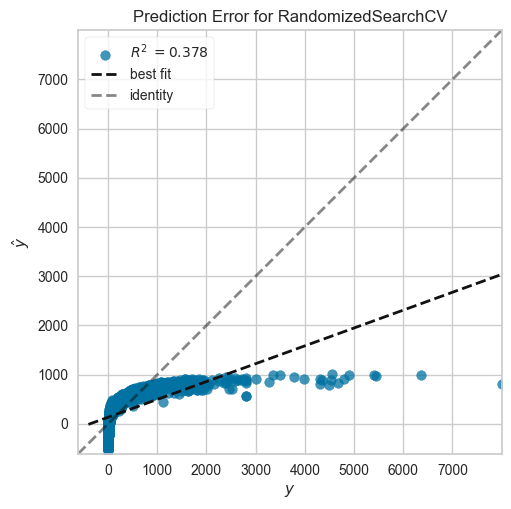

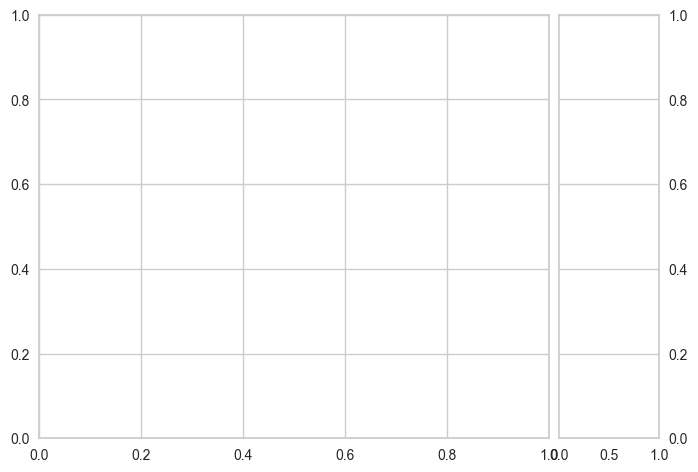

In [171]:
param_grid = {'C': [0.0001,0.001,0.01,0.1,1,10],
            'loss': ['epsilon_insensitive','squared_epsilon_insensitive'],
            'epsilon': np.linspace(0.001,1,5),
            'shuffle': [True,False],
            'average': [True,False]}

grid_pa = RandomizedSearchCV(PassiveAggressiveRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_pa)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.1, fit_intercept=True, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, selection=random; total time=   0.0s

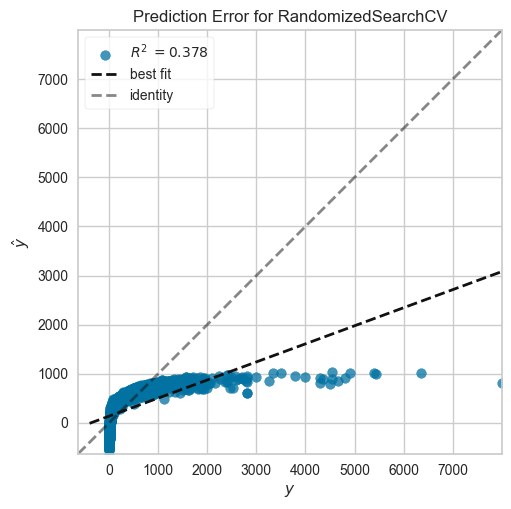

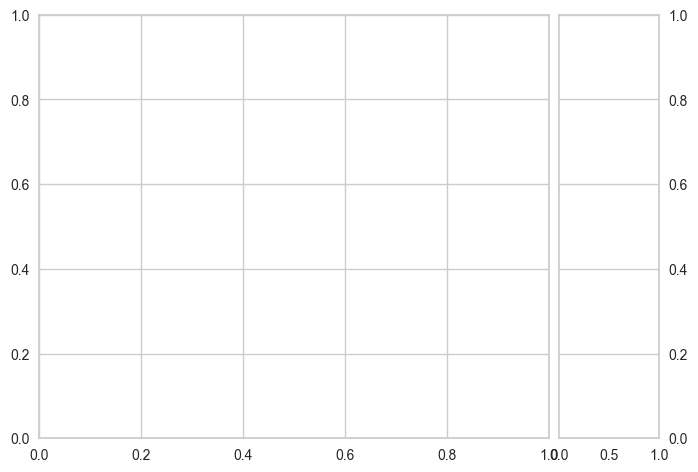

In [172]:
param_grid = {
            'alpha': [0.001,0.01,0.1],
            'positive': [True,False],
            'selection': ['cyclic','random'],
            'fit_intercept': [True,False]
}

grid_lasso = RandomizedSearchCV(Lasso(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_lasso)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.001, fit_intercept=False, positive=False, solver=lsqr; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=False, solver=lsqr; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=False, solver=lsqr; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=False, solver=lsqr; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=False, solver=lsqr; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, solver=cholesky; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, solver=cholesky; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, solver=cholesky; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, solver=cholesky; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, solver=cholesky; total time=   0.0s
[CV] END alpha=0.1, fit_

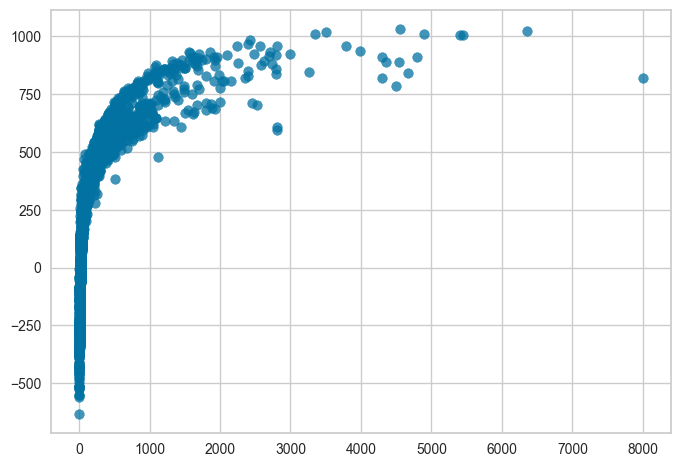

In [173]:
param_grid = {
            'alpha': [0.001,0.01,0.1],
            'positive': [True,False],
            'fit_intercept': [True,False],
            'solver': ['svd','cholesky','lsqr','sparse_cg','sag','saga','lbfgs']
}

grid_ridge = RandomizedSearchCV(Ridge(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ridge)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=0.8, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=0.8, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=0.8, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=0.8, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=0.8, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, l1_ratio=0.3, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, l1_ratio=0.3, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, l1_ratio=0.3, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, l1_ratio=0.3, positive=True, selection

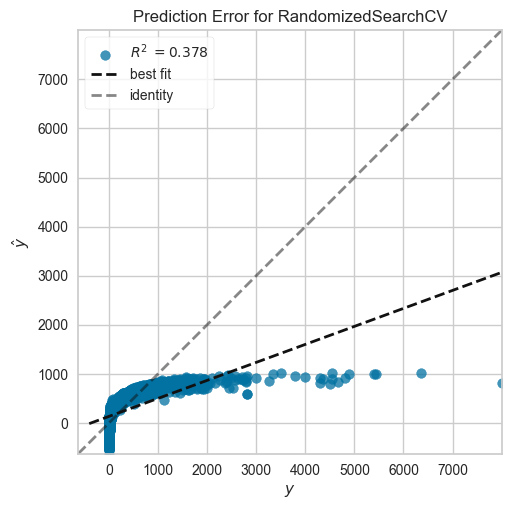

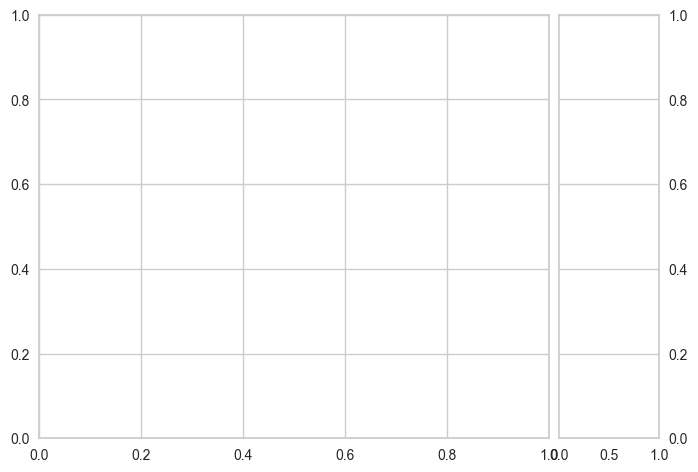

In [174]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'selection': ['cyclic','random'],
    'l1_ratio': [0.1,0.3,0.5,0.8,1],
    'positive': [True,False],
    'fit_intercept': [True,False]
}

grid_elasticnet = RandomizedSearchCV(ElasticNet(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_elasticnet)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha_1=1e-08, alpha_2=1e-07, compute_score=True, fit_intercept=True, lambda_1=1e-08, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-08, alpha_2=1e-07, compute_score=True, fit_intercept=True, lambda_1=1e-08, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-08, alpha_2=1e-07, compute_score=True, fit_intercept=True, lambda_1=1e-08, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-08, alpha_2=1e-07, compute_score=True, fit_intercept=True, lambda_1=1e-08, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-08, alpha_2=1e-07, compute_score=True, fit_intercept=True, lambda_1=1e-08, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-05, alpha_2=1e-05, compute_score=True, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-05, alpha_2=1e-05, compute_score=True, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-05, alp

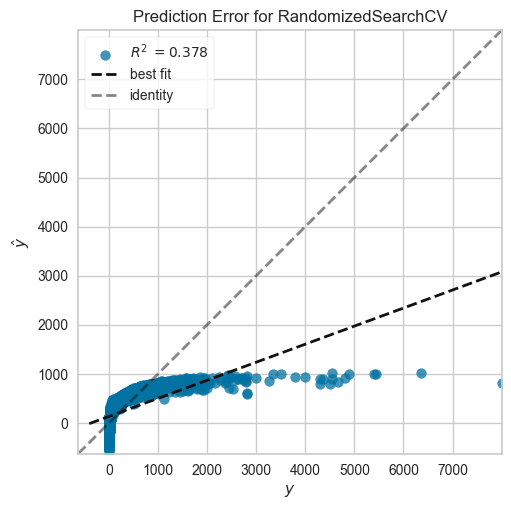

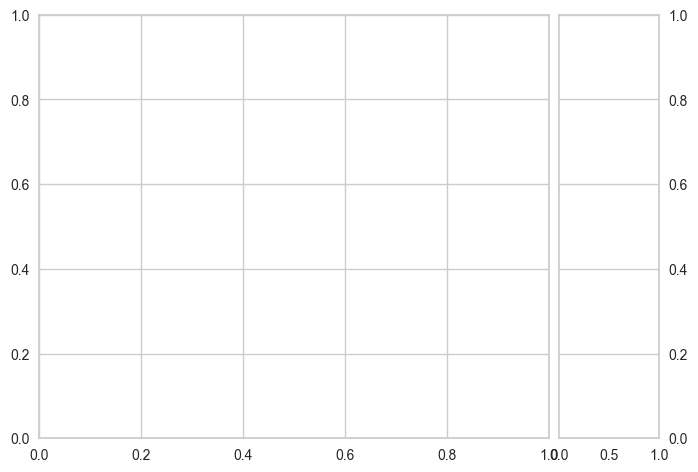

In [175]:
param_grid = {'alpha_1': [1e-5,1e-6,1e-7,1e-8],
'alpha_2': [1e-5,1e-6,1e-7,1e-8],
'lambda_1': [1e-5,1e-6,1e-7,1e-8],
'lambda_2': [1e-5,1e-6,1e-7,1e-8],
'fit_intercept': [True,False],
'compute_score': [True,False]}

grid_ard = RandomizedSearchCV(ARDRegression(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ard)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=False, positive=True; total time=   0.0s
[CV] END .................fit_intercept=False, po

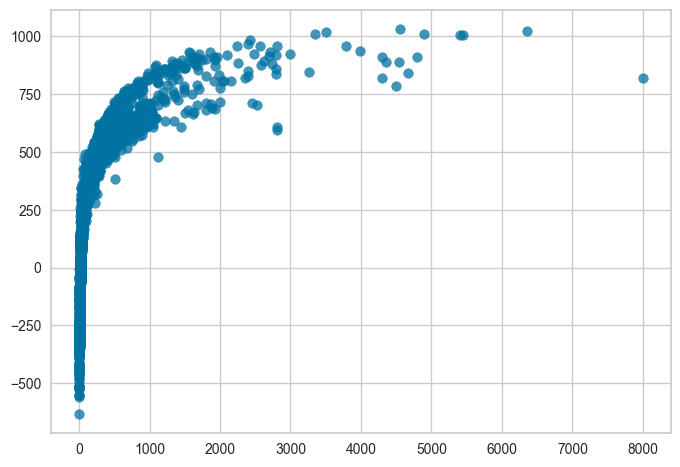

In [176]:
param_grid = {'fit_intercept': [True,False],
'positive': [True,False]}

grid_lr = RandomizedSearchCV(LinearRegression(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_lr)

In [177]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'fit_intercept': [True,False],
    'solver': ['lbfgs','newton-cholesky'],
    'warm_start': [True,False]
}

grid_poisson = RandomizedSearchCV(estimator=PoissonRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_poisson)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END loss=squared_error, min_samples=0.25, stop_probability=1.0; total time=   0.4s
[CV] END loss=squared_error, min_samples=0.25, stop_probability=1.0; total time=   0.4s
[CV] END loss=squared_error, min_samples=0.25, stop_probability=1.0; total time=   0.2s
[CV] END loss=squared_error, min_samples=0.25, stop_probability=1.0; total time=   0.2s
[CV] END loss=squared_error, min_samples=0.25, stop_probability=1.0; total time=   0.2s
[CV] END loss=squared_error, min_samples=0.25, stop_probability=0.75; total time=   0.2s
[CV] END loss=squared_error, min_samples=0.25, stop_probability=0.75; total time=   0.1s
[CV] END loss=squared_error, min_samples=0.25, stop_probability=0.75; total time=   0.2s
[CV] END loss=squared_error, min_samples=0.25, stop_probability=0.75; total time=   0.1s
[CV] END loss=squared_error, min_samples=0.25, stop_probability=0.75; total time=   0.2s
[CV] END loss=squared_error, min_samples=0.75, stop_pr

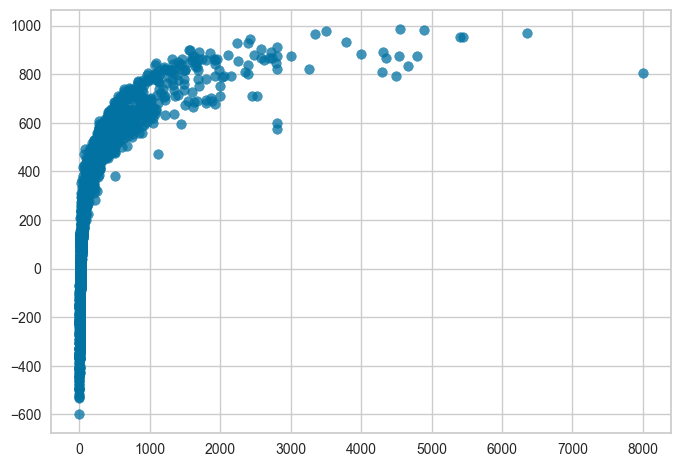

In [178]:
param_grid = {
    'stop_probability': np.linspace(0,1,5),
    'loss': ['absolute_error','squared_error'],
    'min_samples': np.linspace(0,1,5)[1:]
}

grid_ransac = RandomizedSearchCV(estimator=RANSACRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_ransac)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=True, criterion=friedman_mse, max_features=log2, max_samples=0.5, n_estimators=1000, oob_score=True, warm_start=False; total time=  15.6s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=log2, max_samples=0.5, n_estimators=1000, oob_score=True, warm_start=False; total time=  14.2s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=log2, max_samples=0.5, n_estimators=1000, oob_score=True, warm_start=False; total time=  14.1s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=log2, max_samples=0.5, n_estimators=1000, oob_score=True, warm_start=False; total time=  13.2s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=log2, max_samples=0.5, n_estimators=1000, oob_score=True, warm_start=False; total time=  13.2s
[CV] END bootstrap=False, criterion=poisson, max_features=sqrt, max_samples=0.25, n_estimators=1000, oob_score=True, warm_start=True; total time=   0.0s
[

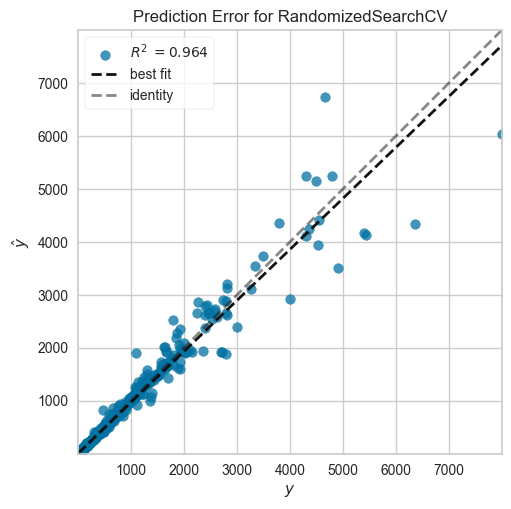

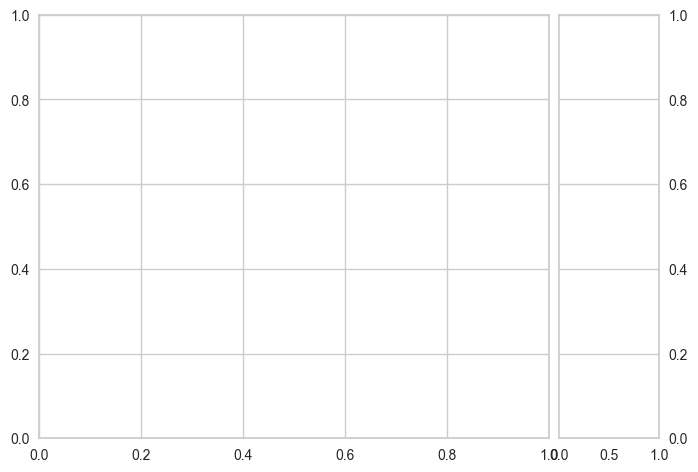

In [179]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'criterion': ['squared_error','absolute_error','friedman_mse','poisson'],
    'max_features': ['auto','sqrt','log2'],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'warm_start': [True,False],
    'max_samples': [0.25,0.5,0.75,1.0]
}

grid_rf = RandomizedSearchCV(estimator=RandomForestRegressor(),param_distributions=param_grid,verbose=2,return_train_score=True,scoring='r2')
train_and_evaluate_model(grid_rf)

In [180]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'fit_intercept': [True,False],
    'solver': ['lbfgs','newton-cholesky'],
    'warm_start': [True,False]
}

grid_gamma = RandomizedSearchCV(estimator=GammaRegressor(),param_distributions=param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_gamma)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=lbfgs, warm_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=1, degree=3, epsilon=0.1, gamma=scale, kernel=sigmoid, shrinking=True; total time=   2.5s
[CV] END C=1, degree=3, epsilon=0.1, gamma=scale, kernel=sigmoid, shrinking=True; total time=   2.5s
[CV] END C=1, degree=3, epsilon=0.1, gamma=scale, kernel=sigmoid, shrinking=True; total time=   2.4s
[CV] END C=1, degree=3, epsilon=0.1, gamma=scale, kernel=sigmoid, shrinking=True; total time=   2.1s
[CV] END C=1, degree=3, epsilon=0.1, gamma=scale, kernel=sigmoid, shrinking=True; total time=   2.3s
[CV] END C=0.1, degree=1, epsilon=1, gamma=scale, kernel=sigmoid, shrinking=True; total time=   2.6s
[CV] END C=0.1, degree=1, epsilon=1, gamma=scale, kernel=sigmoid, shrinking=True; total time=   2.5s
[CV] END C=0.1, degree=1, epsilon=1, gamma=scale, kernel=sigmoid, shrinking=True; total time=   2.5s
[CV] END C=0.1, degree=1, epsilon=1, gamma=scale, kernel=sigmoid, shrinking=True; total time=   2.6s
[CV] END C=0.1, degree=1, epsi

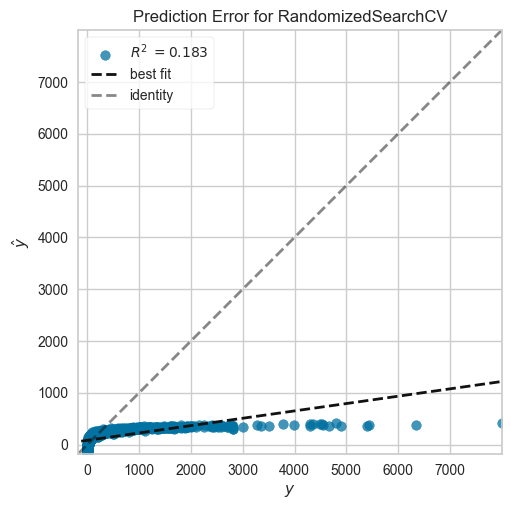

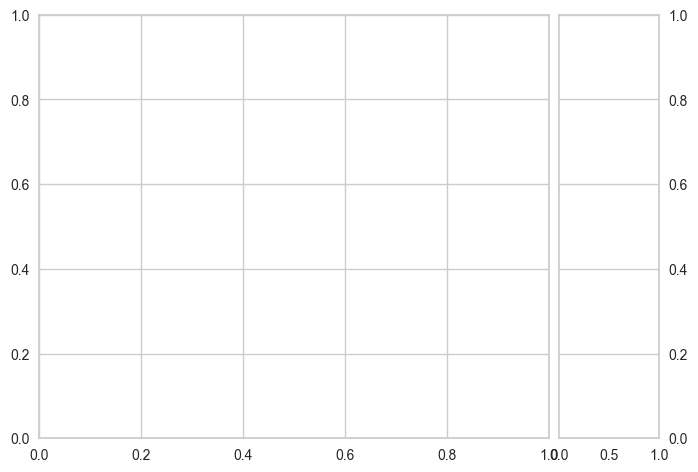

In [181]:
param_grid = {
    'kernel': ['linear','poly','rbf','sigmoid'],
    'degree': [1,2,3,4],
    'C': [0.01,0.1,1,10],
    'gamma': ['scale','auto'],
    'shrinking': [True,False],
    'epsilon': [0.001,0.01,0.1,1]
}

grid_svr = RandomizedSearchCV(estimator=SVR(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_svr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=0.1, degree=1, kernel=rbf, nu=0.1, shrinking=True; total time=   0.4s
[CV] END C=0.1, degree=1, kernel=rbf, nu=0.1, shrinking=True; total time=   0.5s
[CV] END C=0.1, degree=1, kernel=rbf, nu=0.1, shrinking=True; total time=   0.8s
[CV] END C=0.1, degree=1, kernel=rbf, nu=0.1, shrinking=True; total time=   0.4s
[CV] END C=0.1, degree=1, kernel=rbf, nu=0.1, shrinking=True; total time=   0.3s
[CV] END C=10, degree=1, kernel=poly, nu=0.01, shrinking=True; total time=   0.0s
[CV] END C=10, degree=1, kernel=poly, nu=0.01, shrinking=True; total time=   0.0s
[CV] END C=10, degree=1, kernel=poly, nu=0.01, shrinking=True; total time=   0.0s
[CV] END C=10, degree=1, kernel=poly, nu=0.01, shrinking=True; total time=   0.0s
[CV] END C=10, degree=1, kernel=poly, nu=0.01, shrinking=True; total time=   0.0s
[CV] END ..C=1, degree=1, kernel=rbf, nu=0.1, shrinking=True; total time=   0.2s
[CV] END ..C=1, degree=1, kernel=rbf, nu=0.

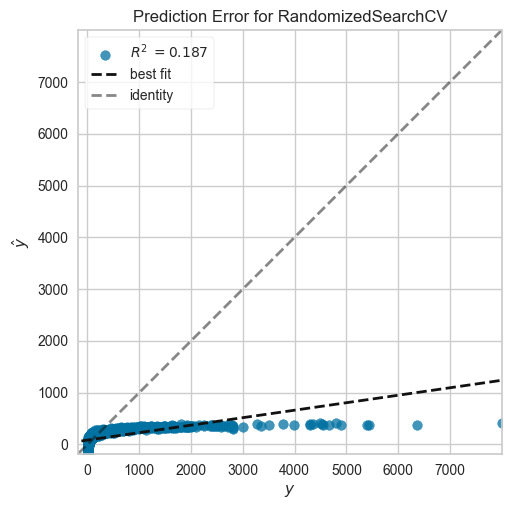

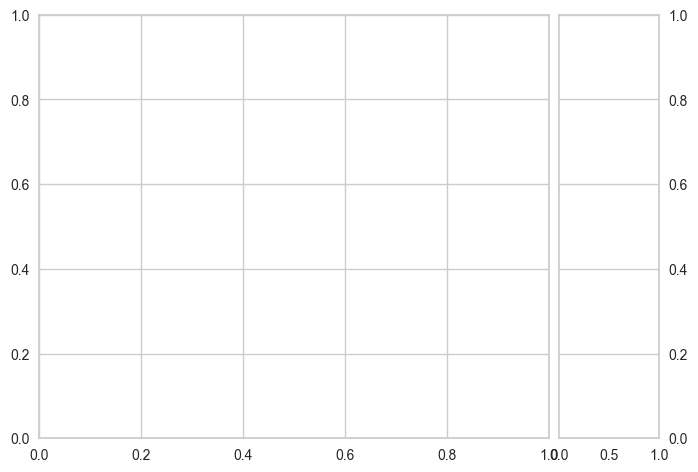

In [182]:
param_grid = {
    'nu': [0.001,0.01,0.1,0.5,1],
    'C': [0.1,1,10],
    'kernel': ['linear','poly','rbf','sigmoid'],
    'degree': [1,2,3,4],
    'shrinking': [True,False]
}

grid_nusvr = RandomizedSearchCV(estimator=NuSVR(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_nusvr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=100, n_subsamples=None; total time=   0.0s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=100, n_subsamples=None; total time=   0.0s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=100, n_subsamples=None; total time=   0.0s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=100, n_subsamples=None; total time=   0.0s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=100, n_subsamples=None; total time=   0.0s
[CV] END copy_X=False, fit_intercept=True, max_subpopulation=100000, n_subsamples=500; total time=  57.3s
[CV] END copy_X=False, fit_intercept=True, max_subpopulation=100000, n_subsamples=500; total time=  48.5s
[CV] END copy_X=False, fit_intercept=True, max_subpopulation=100000, n_subsamples=500; total time=  45.6s
[CV] END copy_X=False, fit_intercept=True, max_subpopulation=100000, n_subsamples=500; total time=  4

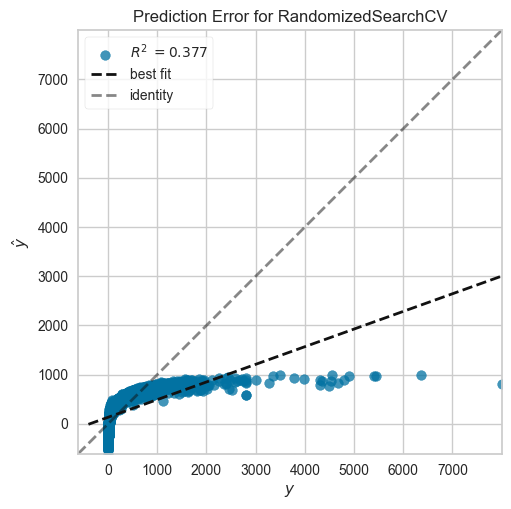

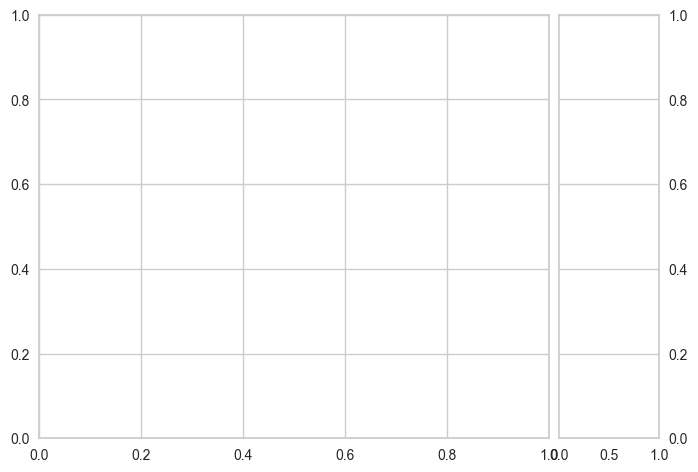

In [183]:
param_grid = {
    'fit_intercept': [True,False],
    'copy_X': [True,False],
    'max_subpopulation': [1,10,100,1000,10000,100000],
    'n_subsamples': [300,500,753,None]
}

grid_tsr = RandomizedSearchCV(estimator=TheilSenRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_tsr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha_1=1e-07, alpha_2=1e-05, compute_score=True, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-08; total time=   0.5s
[CV] END alpha_1=1e-07, alpha_2=1e-05, compute_score=True, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-05, compute_score=True, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-05, compute_score=True, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-05, compute_score=True, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-05, compute_score=True, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-05, compute_score=True, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-06, alp

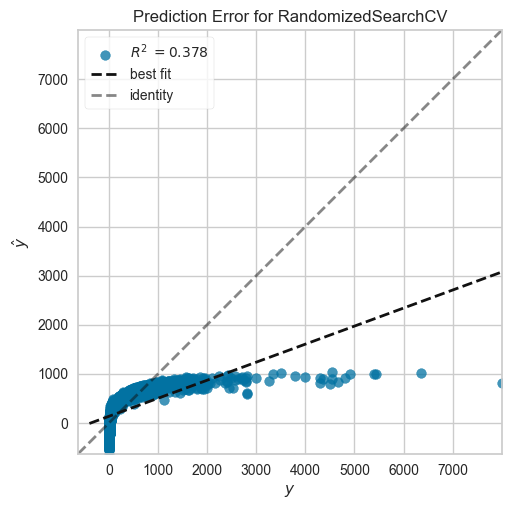

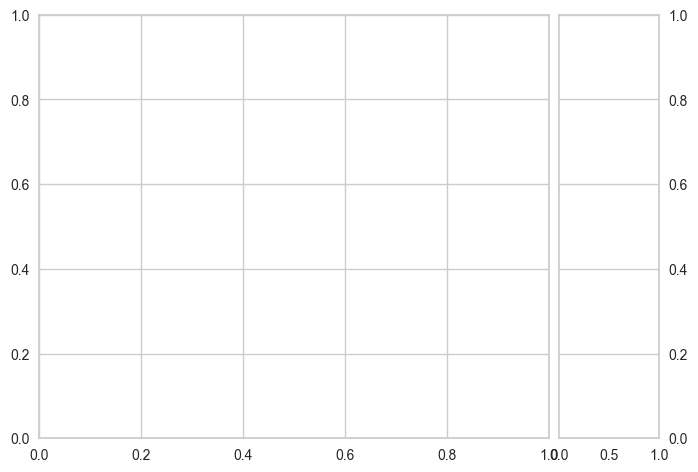

In [184]:
param_grid = {'alpha_1': [1e-5,1e-6,1e-7,1e-8],
'alpha_2': [1e-5,1e-6,1e-7,1e-8],
'lambda_1': [1e-5,1e-6,1e-7,1e-8],
'lambda_2': [1e-5,1e-6,1e-7,1e-8],
'fit_intercept': [True,False],
'compute_score': [True,False]
             }

grid_bayesian_ridge = RandomizedSearchCV(BayesianRidge(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_bayesian_ridge)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ..learning_rate=0.01, loss=linear, n_estimators=200; total time=   4.0s
[CV] END ..learning_rate=0.01, loss=linear, n_estimators=200; total time=   3.5s
[CV] END ..learning_rate=0.01, loss=linear, n_estimators=200; total time=   3.4s
[CV] END ..learning_rate=0.01, loss=linear, n_estimators=200; total time=   3.4s
[CV] END ..learning_rate=0.01, loss=linear, n_estimators=200; total time=   3.5s
[CV] END ....learning_rate=1, loss=square, n_estimators=1000; total time=  12.8s
[CV] END ....learning_rate=1, loss=square, n_estimators=1000; total time=  13.7s
[CV] END ....learning_rate=1, loss=square, n_estimators=1000; total time=  12.6s
[CV] END ....learning_rate=1, loss=square, n_estimators=1000; total time=  12.7s
[CV] END ....learning_rate=1, loss=square, n_estimators=1000; total time=  12.7s
[CV] END learning_rate=0.001, loss=exponential, n_estimators=800; total time=  14.9s
[CV] END learning_rate=0.001, loss=exponenti

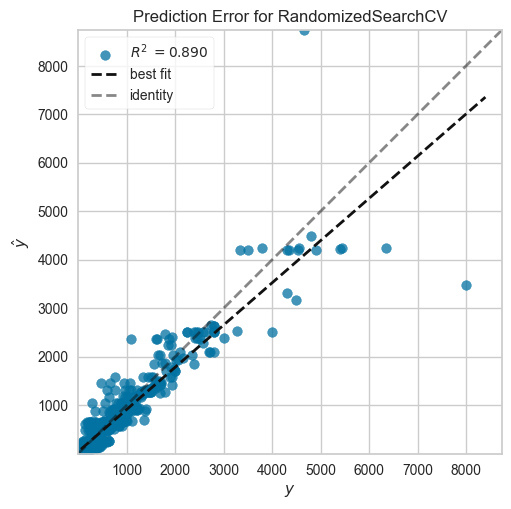

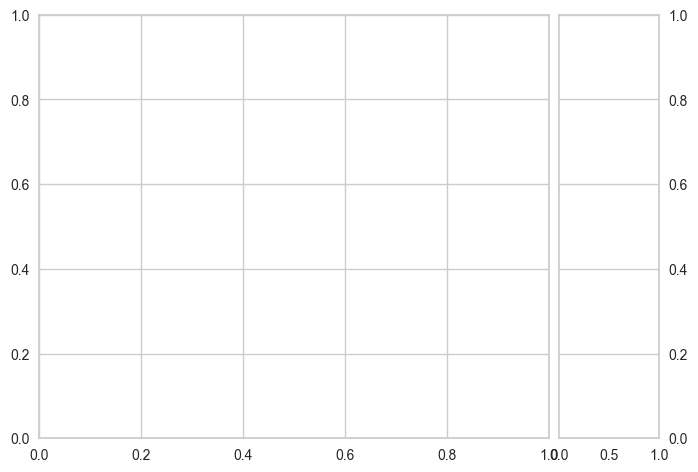

In [185]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.001,0.01,0.1,1],
    'loss': ['linear','square','exponential']
}

grid_ab = RandomizedSearchCV(estimator=AdaBoostRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_ab)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=False, criterion=poisson, max_features=auto, max_samples=0.9, n_estimators=1000, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=poisson, max_features=auto, max_samples=0.9, n_estimators=1000, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=poisson, max_features=auto, max_samples=0.9, n_estimators=1000, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=poisson, max_features=auto, max_samples=0.9, n_estimators=1000, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=poisson, max_features=auto, max_samples=0.9, n_estimators=1000, oob_score=True; total time=   0.0s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=sqrt, max_samples=0.5, n_estimators=1000, oob_score=True; total time=   9.0s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=sqrt, max_samples=0.5, n_estimators=1000, oob_score=True; total

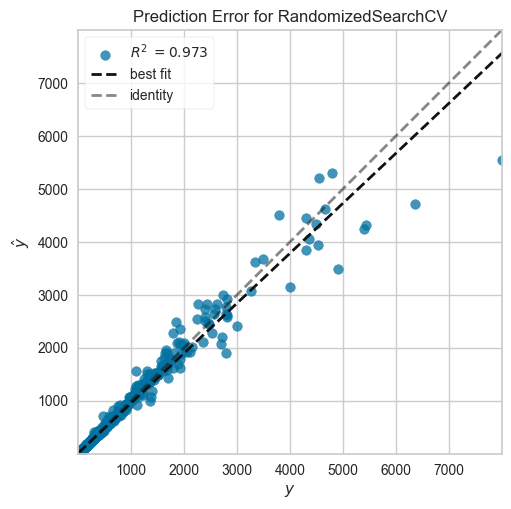

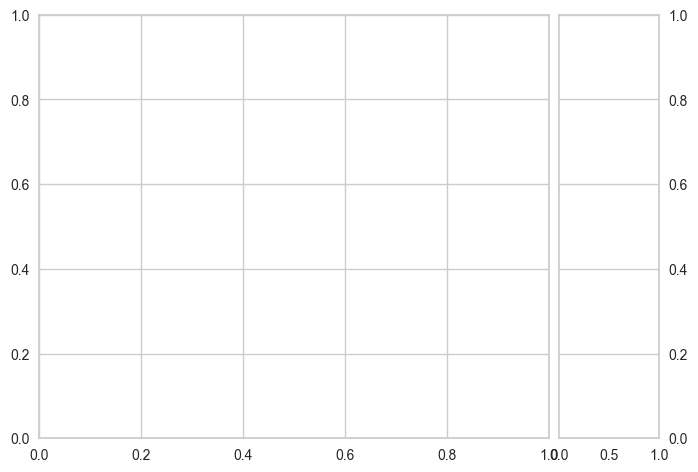

In [186]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'criterion': ['squared_error','absolute_error','friedman_mse','poisson'],
    'max_features': ['auto','sqrt','log2'],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'max_samples': [0.5,0.75,0.9,1]
}

grid_et = RandomizedSearchCV(estimator=ExtraTreesRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_et)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[03:27:34] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "colsample_bynode", "num_parallel_tree", "subsample" } are not used.

[CV] END booster=gblinear, importance_type=total_cover, learning_rate=0.01, n_estimators=500; total time=   0.2s
[03:27:34] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "colsample_bynode", "num_parallel_tree", "subsample" } are not used.

[CV] END booster=gblinear, importance_type=total_cover, learning_rate=0.01, n_estimators=500; total time=   0.0s
[03:27:34] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "colsample_bynode", "num_parallel_tree", "subsample" } are not used.

[CV] END booster=gblinear, importance_type=total_cover, learning_rate=0.01, n_estimators=500; total time=   0.0s
[03:27:34] WARNING: C:\Users\dev-admin\croot2\xg

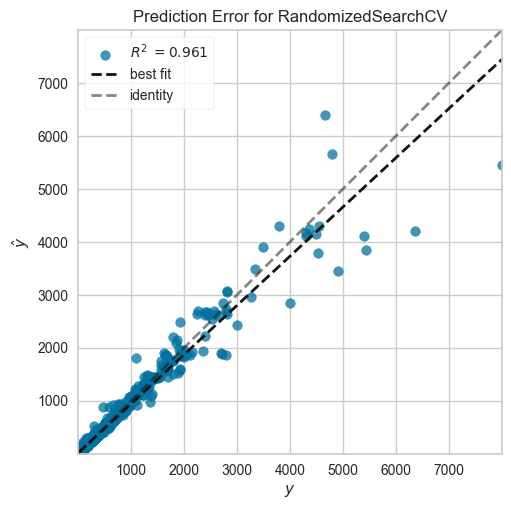

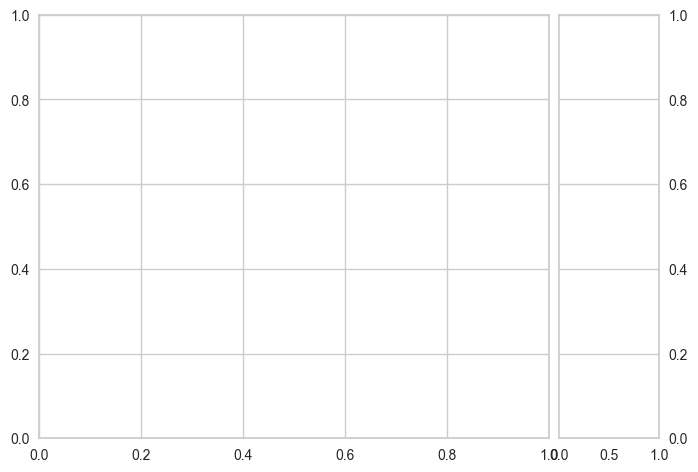

In [187]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.001,0.01,0.1,1],
    'booster': ['gbtree','dart','gblinear'],
    'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgbrf = RandomizedSearchCV(estimator=XGBRFRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_xgbrf)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=False, bootstrap_features=True, max_features=0.5, max_samples=0.5, n_estimators=200, oob_score=False, warm_start=True; total time=   4.4s
[CV] END bootstrap=False, bootstrap_features=True, max_features=0.5, max_samples=0.5, n_estimators=200, oob_score=False, warm_start=True; total time=   4.1s
[CV] END bootstrap=False, bootstrap_features=True, max_features=0.5, max_samples=0.5, n_estimators=200, oob_score=False, warm_start=True; total time=   5.0s
[CV] END bootstrap=False, bootstrap_features=True, max_features=0.5, max_samples=0.5, n_estimators=200, oob_score=False, warm_start=True; total time=   4.0s
[CV] END bootstrap=False, bootstrap_features=True, max_features=0.5, max_samples=0.5, n_estimators=200, oob_score=False, warm_start=True; total time=   3.9s
[CV] END bootstrap=False, bootstrap_features=True, max_features=0.65, max_samples=0.5, n_estimators=1000, oob_score=False, warm_start=True; total time=  2

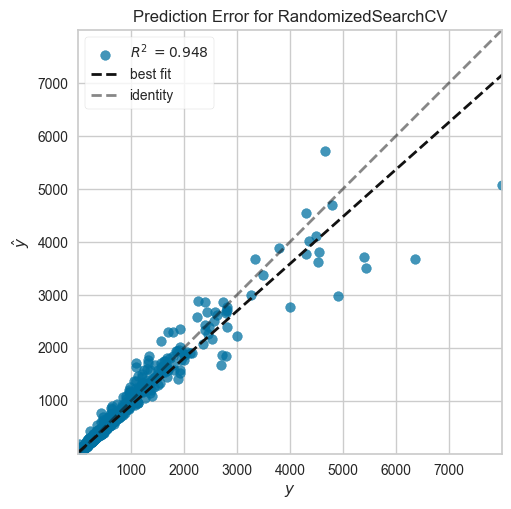

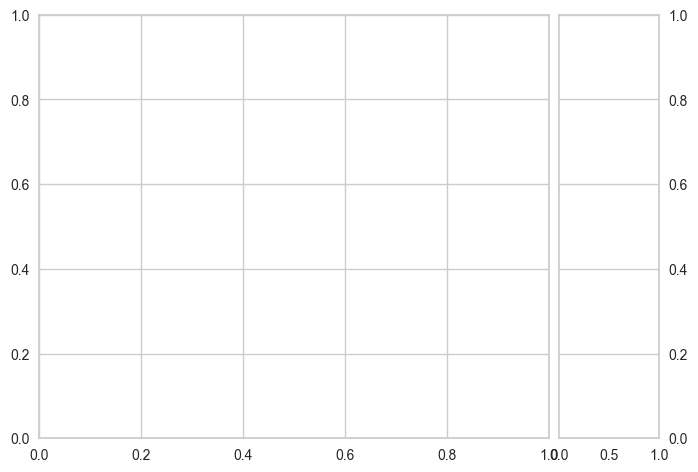

In [188]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'max_samples': [0.25,0.5,0.75,1],
    'max_features': [0.5,0.65,0.85,1],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'bootstrap_features': [True,False],
    'warm_start': [True,False]
}

grid_bag = RandomizedSearchCV(estimator=BaggingRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_bag)

## Optimized Models Performance Comparison

In [194]:
model_perfs = pd.DataFrame({'Model': models, 
                            'R2': r2_scores, 
                            'RMSE': rmse_scores, 
                            'MAPE': mape_scores, 
                            'MSE': mse_scores, 
                            'Training Time': training_times}).sort_values('R2',ascending=False).reset_index(drop=True)
model_perfs[:20]

,Model,R2,RMSE,MAPE,MSE,Training Time
0,"(ExtraTreeRegressor(random_state=1029196382), ...",0.976337,79.747890,0.014177,6359.725944,1.895131
1,"RandomizedSearchCV(cv=5, estimator=ExtraTreesR...",0.972853,85.417259,0.017916,7296.108217,125.169776
2,"RandomizedSearchCV(cv=5, estimator=GradientBoo...",0.969176,91.018475,0.201590,8284.362773,262.948552
3,RandomizedSearchCV(estimator=RandomForestRegre...,0.964296,97.957550,0.019701,9595.681569,339.901599
4,"(DecisionTreeRegressor(max_features=1.0, rando...",0.961060,102.300450,0.019037,10465.381975,4.487048
5,"RandomizedSearchCV(cv=5,\n e...",0.960849,102.577754,0.326840,10522.195562,92.023288
6,<catboost.core.CatBoostRegressor object at 0x0...,0.960660,102.824565,0.119310,10572.891102,4.655082
7,(DecisionTreeRegressor(random_state=2064953117...,0.960326,103.260716,0.022796,10662.775436,0.454965
8,"RandomizedSearchCV(cv=5, estimator=LGBMRegress...",0.959694,104.080024,0.124777,10832.651487,19.581051
9,LGBMRegressor(),0.959196,104.720411,0.105570,10966.364507,0.207914


Even after tuning the hyperparameters of all the models, the Extra Trees Regressor model stays intact as the best performing model with an outstanding R2 score of more than 97.6%.

## Saving the best performing model for deployment into production

In [195]:
best_model = model_perfs['Model'].iloc[0]
best_model

ExtraTreesRegressor()

In [196]:
pipeline = Pipeline(steps=[
        ('transformer',transformer),
        ('scaler',scaler),
        ('model',best_model)
])
pipeline

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('log_transform',
                                                  FunctionTransformer(func=<ufunc 'log1p'>),
                                                  ['Quantity', 'Profit']),
                                                 ('sqrt_transform',
                                                  FunctionTransformer(func=<ufunc 'sqrt'>),
                                                  ['Discount']),
                                                 ('power_transform',
                                                  PowerTransformer(),
                                                  ['Discount Percentage',
                                                   'Operating Expenses'])])),
                ('scaler', StandardScaler()),
                ('model', ExtraTreesRegressor())])

In [197]:
joblib.dump(pipeline,'pipeline.pkl')

['pipeline.pkl']

In [198]:
joblib.load('pipeline.pkl')

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('log_transform',
                                                  FunctionTransformer(func=<ufunc 'log1p'>),
                                                  ['Quantity', 'Profit']),
                                                 ('sqrt_transform',
                                                  FunctionTransformer(func=<ufunc 'sqrt'>),
                                                  ['Discount']),
                                                 ('power_transform',
                                                  PowerTransformer(),
                                                  ['Discount Percentage',
                                                   'Operating Expenses'])])),
                ('scaler', StandardScaler()),
                ('model', ExtraTreesRegressor())])

In [200]:
for col in final_X_train.columns:
    print(f"Min value of {col}:",df[col].min())
    print(f"Max value of {col}:",df[col].max())

Min value of Profit: -6599.978000000001
Max value of Profit: 5039.9856
Min value of Discount Percentage: 0.0
Max value of Discount Percentage: 180.1801801801802
Min value of Postal Code: 1040.0
Max value of Postal Code: 99301.0
Min value of Discount: 0.0
Max value of Discount: 0.8
Min value of Order Day: 1.0
Max value of Order Day: 31.0
Min value of Order Month: 1.0
Max value of Order Month: 12.0
Min value of Quantity: 1.0
Max value of Quantity: 14.0
Min value of Operating Expenses: 0.5543999999999999
Max value of Operating Expenses: 11839.970399999998
Min value of Ship Day: 1.0
Max value of Ship Day: 31.0
Min value of Order Weekday: 0.0
Max value of Order Weekday: 6.0


In [205]:
list(final_X_train.columns)

['Profit',
 'Discount Percentage',
 'Postal Code',
 'Discount',
 'Order Day',
 'Order Month',
 'Quantity',
 'Operating Expenses',
 'Ship Day',
 'Order Weekday']

### Making a test prediction

In [208]:
pipeline.predict(pd.DataFrame([[3846.91,79.42479138,5937,0.5,8.0,5.0,9.0,6293.46,29.0,3.0]],columns=list(final_X_train.columns)))

array([6367.70122])

In [210]:
gc.collect()

0

In [2]:
import sklearn
print(sklearn.__version__)

1.2.2
